In [2]:
import numpy as np, pandas as pd
import torch, torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from torchvision.datasets import MNIST
import matplotlib.pyplot as plt
from dataclasses import dataclass
from IPython.display import display

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("DEVICE:", DEVICE)

def set_torch_seed(seed: int):
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

CFG = dict(
    seed_list=[0,1,2],
    n_init=20,
    n_val=100,
    acq_batch=10,
    rounds=100,
    pool_subset=2000,

    feat_dim=128,
    bb_epochs=50,
    bb_lr=1e-3,
    bb_wd=1e-2,          # uses bb_wd / N each round
    batch_size=128,

    center_Y=False,      # keep False for one-hot regression

    alpha_init=10.0,
    alpha_min=1e-6,
    alpha_max=1e6,
    alpha_tune_every=5,
    alpha_grid=7,

    sigma2_init=1.0,
    sigma2_floor=1e-2,
    sigma2_ceil=1e2,
    jitter=1e-6,

    ll_iters=25,

    lam=0.05,            # corr shrinkage
    omega_eps=1e-3,

    debug_acq=True,
    debug_every=5,
    s2_flat_eps=1e-8,
    s2_round_dec=10,

    feat_norm="ln",        # "none" | "ln" | "zscore"
    zscore_eps=1e-6,
    coreset_block=256,

    # ---- predvar diversity (kmeans) ----
    predvar_diverse=True,
    predvar_top=128,
    predvar_mode="product",  # "product" or "add"
    predvar_beta=0.5,
    predvar_kmeans_iters=15,
    predvar_kmeans_seed=0,

    # predvar_seq
    predvar_seq_use_dist=True,   # mild diversify by distance-to-labelled
    predvar_seq_dist_eps=0.1,

    # coreset
    coreset_robust=True,
    coreset_xi_frac=1e-4,
    coreset_bs_iters=15,

    # label noise knobs (default OFF)
    label_smooth=0.0,
    hist_every = 10,
    plot_hist = True,

    predvar_divide = True,
    predvar_divide_rounds = 6,
)

def set_predvar_diverse(on=True): CFG["predvar_diverse"] = bool(on)
def set_coreset_robust(on=True):  CFG["coreset_robust"]  = bool(on)


DEVICE: cuda


In [3]:
def onehot(y, C=10):
    return F.one_hot(y.long(), C).float()

@torch.no_grad()
def normal_smooth_onehot(Y, *, logit_gap=6.0, sigma=1.0, T=1.0):
    logits = (2*Y - 1) * logit_gap
    logits = logits + sigma * torch.randn_like(logits)
    return torch.softmax(logits / T, dim=1)

train_raw = MNIST(".", train=True, download=True)
test_raw  = MNIST(".", train=False, download=True)

X_train_all = train_raw.data.unsqueeze(1).float().div_(255.0)
X_test      = test_raw.data.unsqueeze(1).float().div_(255.0)

# standard MNIST normalize
X_train_all = (X_train_all - 0.1307) / 0.3081
X_test      = (X_test      - 0.1307) / 0.3081

y_train_int = train_raw.targets.long()
y_test_int  = test_raw.targets.long()

Y_train_all = onehot(y_train_int)
#Y_train_all = normal_smooth_onehot(onehot(y_train_int), sigma=2.5, logit_gap=6.0, T=1.0)
Y_test      = onehot(y_test_int)

def balanced_init_indices(y: torch.Tensor, seed: int, n_total: int):
    assert n_total % 10 == 0
    n_per = n_total // 10
    g = torch.Generator().manual_seed(seed)
    idx = []
    for c in range(10):
        cand = torch.where(y == c)[0]
        pick = cand[torch.randperm(len(cand), generator=g)[:n_per]]
        idx.append(pick)
    idx = torch.cat(idx)
    idx = idx[torch.randperm(len(idx), generator=g)]
    return idx

def make_splits(seed: int):
    init_idx = balanced_init_indices(y_train_int, seed, CFG["n_init"])
    mask = torch.ones(len(y_train_int), dtype=torch.bool)
    mask[init_idx] = False
    remaining = torch.where(mask)[0]
    g = torch.Generator().manual_seed(seed + 12345)
    perm = remaining[torch.randperm(len(remaining), generator=g)]
    val_idx  = perm[:CFG["n_val"]]
    pool_idx = perm[CFG["n_val"]:]
    return init_idx, val_idx, pool_idx

init_idx, val_idx, pool_idx = make_splits(0)
print("init counts:", torch.bincount(y_train_int[init_idx], minlength=10).tolist())
print("sizes:", len(init_idx), len(val_idx), len(pool_idx))


100%|██████████| 9.91M/9.91M [00:01<00:00, 5.56MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 134kB/s]
100%|██████████| 1.65M/1.65M [00:01<00:00, 1.28MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 10.4MB/s]


init counts: [2, 2, 2, 2, 2, 2, 2, 2, 2, 2]
sizes: 20 100 59880


In [4]:
class ConvBackbone(nn.Module):
    def __init__(self, feat_dim=128, p_conv=0.25, p_fc=0.5):
        super().__init__()
        self.conv1 = nn.Conv2d(1, 32, 4, 1)
        self.conv2 = nn.Conv2d(32, 32, 4, 1)
        self.pool  = nn.MaxPool2d(2)
        self.fc    = nn.Linear(32*11*11, feat_dim)
        self.dropc = nn.Dropout2d(p_conv)
        self.drop  = nn.Dropout(p_fc)
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = self.pool(x)
        x = self.dropc(x)
        x = x.flatten(1)
        x = F.relu(self.fc(x))
        x = self.drop(x)
        return x

class LinearHead(nn.Module):
    def __init__(self, in_dim, out_dim=10):
        super().__init__()
        self.lin = nn.Linear(in_dim, out_dim)
    def forward(self, x):
        return self.lin(x)

def train_backbone_and_head(X, Y_onehot, seed=0):
    set_torch_seed(seed)
    bb = ConvBackbone(CFG["feat_dim"]).to(DEVICE).train()
    head = LinearHead(CFG["feat_dim"], 10).to(DEVICE).train()

    wd = CFG["bb_wd"] / max(1, len(X))
    opt = torch.optim.AdamW(list(bb.parameters()) + list(head.parameters()),
                            lr=CFG["bb_lr"], weight_decay=wd)

    ds = TensorDataset(X, Y_onehot)
    g = torch.Generator().manual_seed(seed)
    dl = DataLoader(ds, batch_size=min(CFG["batch_size"], len(ds)),
                    shuffle=True, generator=g)

    for _ in range(CFG["bb_epochs"]):
        for xb, yb in dl:
            xb, yb = xb.to(DEVICE), yb.to(DEVICE)
            pred = head(bb(xb))
            loss = F.mse_loss(pred, yb)
            opt.zero_grad(set_to_none=True)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(list(bb.parameters()) + list(head.parameters()), 5.0)
            opt.step()

    return bb.eval(), head.eval()

@torch.no_grad()
def extract_features(bb, X):
    dl = DataLoader(TensorDataset(X, torch.zeros(len(X))),
                    batch_size=CFG["batch_size"], shuffle=False)
    out = []
    for xb, _ in dl:
        out.append(bb(xb.to(DEVICE)).cpu())
    return torch.cat(out, 0)

def fit_zscore(Phi, eps=None):
    eps = CFG["zscore_eps"] if eps is None else eps
    mu = Phi.mean(0, keepdim=True)
    sd = Phi.std(0, unbiased=False, keepdim=True).clamp_min(eps)
    return mu, sd

def feat_norm_apply(Phi, stats=None, eps=1e-5):
    kind = CFG["feat_norm"]
    if kind == "none":
        return Phi
    if kind == "ln":
        return F.layer_norm(Phi, (Phi.size(1),), eps=eps)
    if kind == "zscore":
        mu, sd = stats
        return (Phi - mu) / sd
    #Phi = Phi / (Phi.norm(dim=1, keepdim=True) + 1e-12)
    raise ValueError(kind)


In [5]:
def _to_cpu64(X):
    X = X.detach().cpu().to(torch.float64)
    if not torch.isfinite(X).all():
        raise ValueError("Non-finite values detected.")
    return X

def augment_bias(Phi):
    ones = torch.ones(Phi.size(0), 1, dtype=Phi.dtype, device=Phi.device)
    return torch.cat([Phi, ones], dim=1)

def _chol_pd(A, jitter=1e-8):
    A = 0.5 * (A + A.T)
    I = torch.eye(A.size(0), dtype=A.dtype, device=A.device)
    j = float(jitter)
    for _ in range(20):
        try:
            return torch.linalg.cholesky(A + j * I)
        except RuntimeError:
            j *= 10.0
    evals, evecs = torch.linalg.eigh(A)
    evals = torch.nan_to_num(evals, nan=1e-6, posinf=1e6, neginf=1e-6).clamp_min(1e-6)
    A_pd = evecs @ torch.diag(evals) @ evecs.T
    A_pd = 0.5 * (A_pd + A_pd.T)
    return torch.linalg.cholesky(A_pd + 1e-6 * I)

def _diag_P_Ainv_Pt(Phi, cholA):
    S = torch.cholesky_solve(Phi.T, cholA)
    return (Phi * S.T).sum(dim=1)


In [6]:
@torch.no_grad()
def _omega_corr_from_residuals(R, *, lam, eps):
    R = _to_cpu64(R)
    N, C = R.shape
    I = torch.eye(C, dtype=R.dtype)

    if N < 2:
        Corr = I.clone()
        chol = _chol_pd(Corr + eps * I, jitter=CFG["jitter"])
        return Corr, chol, 1.0

    Rc = R - R.mean(0, keepdim=True)
    S = (Rc.T @ Rc) / float(N)

    d = torch.diag(S).clamp_min(eps)
    sigma2_scale = float(d.mean().item())

    invsd = torch.rsqrt(d)
    Corr = S * invsd[:, None] * invsd[None, :]

    lam = float(lam)
    lam_eff = max(lam, min(0.95, float(C) / float(N + C)))
    Corr = (1.0 - lam_eff) * Corr + lam_eff * I

    Corr = 0.5 * (Corr + Corr.T) + float(eps) * I
    chol = _chol_pd(Corr, jitter=CFG["jitter"])
    return Corr, chol, sigma2_scale

def ridge_fit(Phi, Y, *, alpha, bias=True):
    Phi = _to_cpu64(Phi); Y = _to_cpu64(Y)
    if bias: Phi = augment_bias(Phi)
    D = Phi.size(1)
    I = torch.eye(D, dtype=Phi.dtype)
    A = (Phi.T @ Phi) + float(alpha) * I
    cholA = _chol_pd(A, jitter=CFG["jitter"])
    W = torch.cholesky_solve(Phi.T @ Y, cholA)
    return dict(W=W, cholA=cholA, alpha=float(alpha), bias=bool(bias))

@torch.no_grad()
def ridge_predict(post, Phi):
    Phi = _to_cpu64(Phi)
    if post["bias"]: Phi = augment_bias(Phi)
    return Phi @ post["W"]

@dataclass
class BLR_IID:
    M: torch.Tensor
    cholA: torch.Tensor
    sigma2: float
    alpha: float
    bias: bool

def blr_iid_fit(Phi, Y, *, alpha, sigma2_init, iters, bias=True):
    Phi = _to_cpu64(Phi); Y = _to_cpu64(Y)
    if bias: Phi = augment_bias(Phi)
    N, C = Phi.size(0), Y.size(1)
    D = Phi.size(1)
    I = torch.eye(D, dtype=Phi.dtype)

    sigma2 = float(np.clip(sigma2_init, CFG["sigma2_floor"], CFG["sigma2_ceil"]))
    for _ in range(int(iters)):
        A = float(alpha) * I + (Phi.T @ Phi) / sigma2
        cholA = _chol_pd(A, jitter=CFG["jitter"])
        M = torch.cholesky_solve(Phi.T @ Y, cholcholA:=cholA) / sigma2
        R = Y - Phi @ M
        sigma2 = float((R.square().sum() / (N * C)).item())
        sigma2 = float(np.clip(sigma2, CFG["sigma2_floor"], CFG["sigma2_ceil"]))
    return BLR_IID(M=M, cholA=cholA, sigma2=sigma2, alpha=float(alpha), bias=bool(bias))

@torch.no_grad()
def blr_iid_predict(post: BLR_IID, Phi):
    Phi = _to_cpu64(Phi)
    if post.bias: Phi = augment_bias(Phi)
    mu = Phi @ post.M
    s2 = _diag_P_Ainv_Pt(Phi, post.cholA)
    k  = s2 + float(post.sigma2)
    return mu, s2, k

@dataclass
class BLR_CORR:
    Mw: torch.Tensor
    cholA: torch.Tensor
    sigma2: float
    Omega: torch.Tensor
    cholOmega: torch.Tensor
    alpha: float
    bias: bool

def blr_corr_fit(Phi, Y, *, alpha, iters, bias=True):
    Phi = _to_cpu64(Phi); Y = _to_cpu64(Y)
    if bias: Phi = augment_bias(Phi)

    # init corr from ridge residuals
    D = Phi.size(1)
    I_D = torch.eye(D, dtype=Phi.dtype)
    A0 = float(alpha) * I_D + (Phi.T @ Phi)
    cholA0 = _chol_pd(A0, jitter=CFG["jitter"])
    M0 = torch.cholesky_solve(Phi.T @ Y, cholA0)
    R0 = Y - Phi @ M0

    Om, cholOm, s2_init = _omega_corr_from_residuals(R0, lam=CFG["lam"], eps=CFG["omega_eps"])
    sigma2 = float(np.clip(s2_init, CFG["sigma2_floor"], CFG["sigma2_ceil"]))

    Mw = None; cholA = None
    for _ in range(max(1, int(iters))):
        YwT = torch.linalg.solve_triangular(cholOm, Y.T, upper=False)
        Yw  = YwT.T

        postw = blr_iid_fit(Phi, Yw, alpha=alpha, sigma2_init=sigma2, iters=1, bias=False)
        Mw, cholA, sigma2 = postw.M, postw.cholA, float(postw.sigma2)

        mu = (Phi @ Mw) @ cholOm.T
        R  = Y - mu
        Om, cholOm, _ = _omega_corr_from_residuals(R, lam=CFG["lam"], eps=CFG["omega_eps"])

    return BLR_CORR(Mw=Mw, cholA=cholA, sigma2=sigma2, Omega=Om, cholOmega=cholOm,
                    alpha=float(alpha), bias=bool(bias))

@torch.no_grad()
def blr_corr_predict(post: BLR_CORR, Phi):
    Phi = _to_cpu64(Phi)
    if post.bias: Phi = augment_bias(Phi)
    mu_w = Phi @ post.Mw
    mu   = mu_w @ post.cholOmega.T
    s2   = _diag_P_Ainv_Pt(Phi, post.cholA)
    k    = s2 + float(post.sigma2)
    return mu, s2, k

@dataclass
class MFVI_IID:
    M: torch.Tensor
    var_w: torch.Tensor
    sigma2: float
    alpha: float
    bias: bool

def mfvi_iid_fit(Phi, Y, *, alpha, sigma2_init, iters, bias=True):
    Phi = _to_cpu64(Phi); Y = _to_cpu64(Y)
    if bias: Phi = augment_bias(Phi)
    N, C = Phi.size(0), Y.size(1)
    D = Phi.size(1)
    I = torch.eye(D, dtype=Phi.dtype)

    s_d = (Phi**2).sum(0)
    sigma2 = float(np.clip(sigma2_init, CFG["sigma2_floor"], CFG["sigma2_ceil"]))

    for _ in range(int(iters)):
        A = float(alpha) * I + (Phi.T @ Phi) / sigma2
        cholA = _chol_pd(A, jitter=CFG["jitter"])
        M = torch.cholesky_solve(Phi.T @ Y, cholA) / sigma2

        var_w = 1.0 / (float(alpha) + s_d / sigma2)

        R = Y - Phi @ M
        term_data = R.square().sum()
        term_var  = C * ((Phi**2) @ var_w).sum()
        sigma2 = float(((term_data + term_var) / (N * C)).item())
        sigma2 = float(np.clip(sigma2, CFG["sigma2_floor"], CFG["sigma2_ceil"]))

    return MFVI_IID(M=M, var_w=var_w, sigma2=sigma2, alpha=float(alpha), bias=bool(bias))

@torch.no_grad()
def mfvi_iid_predict(q: MFVI_IID, Phi):
    Phi = _to_cpu64(Phi)
    if q.bias: Phi = augment_bias(Phi)
    mu = Phi @ q.M
    s2 = (Phi**2) @ q.var_w
    k  = s2 + float(q.sigma2)
    return mu, s2, k

@dataclass
class MFVI_CORR:
    Mw: torch.Tensor
    var_w: torch.Tensor
    sigma2: float
    Omega: torch.Tensor
    cholOmega: torch.Tensor
    alpha: float
    bias: bool

def mfvi_corr_fit(Phi, Y, *, alpha, sigma2_init, iters, bias=True):
    Phi = _to_cpu64(Phi); Y = _to_cpu64(Y)
    if bias: Phi = augment_bias(Phi)

    # init corr from ridge residuals
    D = Phi.size(1)
    I_D = torch.eye(D, dtype=Phi.dtype)
    A0 = float(alpha) * I_D + (Phi.T @ Phi)
    cholA0 = _chol_pd(A0, jitter=CFG["jitter"])
    M0 = torch.cholesky_solve(Phi.T @ Y, cholA0)
    R0 = Y - Phi @ M0
    Om, cholOm, _ = _omega_corr_from_residuals(R0, lam=CFG["lam"], eps=CFG["omega_eps"])

    sigma2 = float(np.clip(sigma2_init, CFG["sigma2_floor"], CFG["sigma2_ceil"]))
    Mw = var_w = None

    for _ in range(max(1, int(iters))):
        YwT = torch.linalg.solve_triangular(cholOm, Y.T, upper=False)
        Yw  = YwT.T

        qw = mfvi_iid_fit(Phi, Yw, alpha=alpha, sigma2_init=sigma2, iters=1, bias=False)
        Mw, var_w, sigma2 = qw.M, qw.var_w, float(qw.sigma2)

        mu = (Phi @ Mw) @ cholOm.T
        R  = Y - mu
        Om, cholOm, _ = _omega_corr_from_residuals(R, lam=CFG["lam"], eps=CFG["omega_eps"])

    return MFVI_CORR(Mw=Mw, var_w=var_w, sigma2=sigma2,
                     Omega=Om, cholOmega=cholOm, alpha=float(alpha), bias=bool(bias))

@torch.no_grad()
def mfvi_corr_predict(q: MFVI_CORR, Phi):
    Phi = _to_cpu64(Phi)
    if q.bias: Phi = augment_bias(Phi)
    mu_w = Phi @ q.Mw
    mu   = mu_w @ q.cholOmega.T
    s2   = (Phi**2) @ q.var_w
    k    = s2 + float(q.sigma2)
    return mu, s2, k


In [7]:
def acc_from_mu(mu64, y_int):
    mu = mu64.detach().cpu().numpy()
    y  = y_int.detach().cpu().numpy()
    return float((mu.argmax(-1) == y).mean())

def rmse_from_mu(mu64, Y64):
    return float(torch.sqrt((mu64 - Y64).square().mean()).item())

@torch.no_grad()
def nll_iid(mu64, k64, Y64):
    k64 = k64.clamp_min(1e-12)
    R = (Y64 - mu64)
    C = R.size(1)
    quad = R.square().sum(1) / k64
    const = float(C * np.log(2.0*np.pi))
    return float((0.5 * (const + C*torch.log(k64) + quad)).mean().item())

@torch.no_grad()
def nll_corr(mu64, k64, Y64, cholOmega):
    k64 = k64.clamp_min(1e-12)
    R = (Y64 - mu64)
    Rt = R.T
    tmp = torch.linalg.solve_triangular(cholOmega, Rt, upper=False)
    sol = torch.linalg.solve_triangular(cholOmega.T, tmp, upper=True)
    quad = (Rt * sol).sum(0) / k64
    C = R.size(1)
    logdetOm = 2.0 * torch.log(torch.diag(cholOmega)).sum()
    const = float(C * np.log(2.0*np.pi))
    return float((0.5 * (const + C*torch.log(k64) + logdetOm + quad)).mean().item())

def local_alpha_grid(alpha_prev):
    a = float(np.clip(alpha_prev, CFG["alpha_min"], CFG["alpha_max"]))
    lo, hi = a / 5.0, a * 5.0
    lo = max(lo, CFG["alpha_min"]); hi = min(hi, CFG["alpha_max"])
    return np.geomspace(lo, hi, CFG["alpha_grid"]).tolist()

def tune_alpha_local(method, Phi_lab, Y_fit64, Phi_val, y_val_int, *, alpha_prev, bias):
    best_a, best_acc = alpha_prev, -1.0
    for a in local_alpha_grid(alpha_prev):
        if method == "ridge":
            post = ridge_fit(Phi_lab, Y_fit64, alpha=a, bias=bias)
            mu = ridge_predict(post, Phi_val)
        elif method == "blr_iid":
            post = blr_iid_fit(Phi_lab, Y_fit64, alpha=a, sigma2_init=CFG["sigma2_init"], iters=CFG["ll_iters"], bias=bias)
            mu, _, _ = blr_iid_predict(post, Phi_val)
        elif method == "blr_corr":
            post = blr_corr_fit(Phi_lab, Y_fit64, alpha=a, iters=1, bias=bias)
            mu, _, _ = blr_corr_predict(post, Phi_val)
        elif method == "mfvi_iid":
            post = mfvi_iid_fit(Phi_lab, Y_fit64, alpha=a, sigma2_init=CFG["sigma2_init"], iters=CFG["ll_iters"], bias=bias)
            mu, _, _ = mfvi_iid_predict(post, Phi_val)
        elif method == "mfvi_corr":
            post = mfvi_corr_fit(Phi_lab, Y_fit64, alpha=a, sigma2_init=CFG["sigma2_init"], iters=CFG["ll_iters"], bias=bias)
            mu, _, _ = mfvi_corr_predict(post, Phi_val)
        else:
            raise ValueError(method)

        acc = acc_from_mu(mu, y_val_int)
        if acc > best_acc:
            best_acc, best_a = acc, a
    return float(best_a)

@torch.no_grad()
def acq_score(method, post, Phi_sub):
    if method == "blr_iid":
        _, s2, _ = blr_iid_predict(post, Phi_sub); return s2
    if method == "mfvi_iid":
        _, s2, _ = mfvi_iid_predict(post, Phi_sub); return s2
    if method == "blr_corr":
        _, s2, _ = blr_corr_predict(post, Phi_sub)
        return s2 * torch.trace(post.Omega)
    if method == "mfvi_corr":
        _, s2, _ = mfvi_corr_predict(post, Phi_sub)
        return s2 * torch.trace(post.Omega)
    raise ValueError(method)

@torch.no_grad()
def _score_stats(score):
    s = score.detach().flatten().cpu()
    if not torch.is_floating_point(s): s = s.float()
    q = torch.tensor([0.0, 0.1, 0.5, 0.9, 1.0], dtype=s.dtype)
    qs = torch.quantile(s, q).tolist()
    std  = s.std(unbiased=False).item()
    uniq = torch.unique(s.round(decimals=CFG["s2_round_dec"])).numel()
    return dict(std=std, q0=qs[0], q10=qs[1], q50=qs[2], q90=qs[3], q100=qs[4], uniq=uniq, n=s.numel())

@torch.no_grad()
def debug_acq_round(r, method, score, topk):
    st = _score_stats(score)
    ratio = (st["q90"] / max(st["q10"], 1e-12)) if st["q10"] > 0 else float("inf")
    print(f"[acq dbg] r={r:03d} {method} std={st['std']:.3g} "
          f"q10={st['q10']:.3g} q50={st['q50']:.3g} q90={st['q90']:.3g} "
          f"min={st['q0']:.3g} max={st['q100']:.3g} p90/p10={ratio:.3g} "
          f"uniq~={st['uniq']}/{st['n']}")
    if st["std"] < CFG["s2_flat_eps"] or st["uniq"] < max(50, topk * 3):
        print("  -> WARNING: predvar may act like random).")

@torch.no_grad()
def _min_dist_to_set(PhiA, PhiB, block=256):
    PhiA = PhiA.float().cpu()
    PhiB = PhiB.float().cpu()
    M = PhiA.size(0)
    out = torch.empty(M, dtype=torch.float32)
    for i in range(0, M, block):
        d = torch.cdist(PhiA[i:i+block], PhiB)
        out[i:i+block] = d.min(1).values
    return out

@torch.no_grad()
def kcenter_greedy(Phi_pool, Phi_seed, b):
    Phi_pool = Phi_pool.float().cpu()
    Phi_seed = Phi_seed.float().cpu()
    dmin = _min_dist_to_set(Phi_pool, Phi_seed, block=CFG["coreset_block"])
    chosen = []
    for _ in range(int(b)):
        i = int(torch.argmax(dmin).item())
        chosen.append(i)
        dnew = torch.cdist(Phi_pool, Phi_pool[i:i+1]).squeeze(1)
        dmin = torch.minimum(dmin, dnew)
        dmin[i] = -1.0
    return np.array(chosen, dtype=np.int64)

@torch.no_grad()
def _kmeans_pp_init(X, k, seed=0):
    N = X.size(0)
    g = torch.Generator(device="cpu").manual_seed(int(seed))
    C = torch.empty((k, X.size(1)), dtype=X.dtype)

    i0 = torch.randint(0, N, (1,), generator=g).item()
    C[0] = X[i0]
    d2 = torch.cdist(X, C[0:1]).squeeze(1).square()

    for j in range(1, k):
        p = d2 / (d2.sum() + 1e-12)
        ij = torch.multinomial(p, 1, generator=g).item()
        C[j] = X[ij]
        d2 = torch.minimum(d2, torch.cdist(X, C[j:j+1]).squeeze(1).square())
    return C

@torch.no_grad()
def _kmeans(X, k, iters=15, seed=0):
    X = X.float().cpu()
    N = X.size(0)
    k = int(min(k, N))
    C = _kmeans_pp_init(X, k, seed=seed)

    for _ in range(int(iters)):
        dist = torch.cdist(X, C)
        a = dist.argmin(1)
        C2 = C.clone()
        for j in range(k):
            m = (a == j)
            if m.any():
                C2[j] = X[m].mean(0)
            else:
                far = dist.min(1).values.argmax().item()
                C2[j] = X[far]
        if torch.allclose(C, C2, atol=1e-4, rtol=0):
            C = C2
            break
        C = C2
    return a

@torch.no_grad()
def predvar_pick(score, Phi_pool, Phi_seed, b):
    score = score.detach().flatten().cpu()
    b = int(b)

    if not CFG.get("predvar_diverse", False):
        return torch.topk(score, k=b).indices.cpu().numpy()

    topM = int(CFG.get("predvar_top", 512))
    topM = max(b, min(topM, score.numel()))
    cand = torch.topk(score, k=topM).indices.cpu().numpy()

    Phi_c = Phi_pool[cand].float().cpu()
    Phi_seed = Phi_seed.float().cpu()

    dmin = _min_dist_to_set(Phi_c, Phi_seed, block=CFG["coreset_block"]).float()
    d = (dmin - dmin.min()) / (dmin.max() - dmin.min() + 1e-12)

    s = score[cand].float()
    s = (s - s.min()) / (s.max() - s.min() + 1e-12)

    mode = CFG.get("predvar_mode", "product")
    beta = float(CFG.get("predvar_beta", 0.5))
    obj = (s + beta * d) if mode == "add" else (s * d)

    assign = _kmeans(Phi_c, k=b,
                     iters=int(CFG.get("predvar_kmeans_iters", 15)),
                     seed=int(CFG.get("predvar_kmeans_seed", 0)))

    chosen = []
    used = torch.zeros(topM, dtype=torch.bool)
    for j in range(min(b, topM)):
        m = (assign == j) & (~used)
        if m.any():
            idxs = torch.where(m)[0]
            pick = idxs[obj[m].argmax()].item()
            chosen.append(pick)
            used[pick] = True

    if len(chosen) < b:
        rest = torch.where(~used)[0]
        extra = rest[torch.topk(obj[rest], k=b - len(chosen)).indices].tolist()
        chosen += extra

    return cand[np.array(chosen, dtype=np.int64)]

@torch.no_grad()
def robust_kcenter(Phi_pool, Phi_seed, b):
    Phi_pool = Phi_pool.float().cpu()
    Phi_seed = Phi_seed.float().cpu()
    M = Phi_pool.size(0)

    xi = int(np.ceil(float(CFG.get("coreset_xi_frac", 1e-4)) * M))
    xi = max(0, min(xi, M-1))

    sg = kcenter_greedy(Phi_pool, Phi_seed, b)
    Phi_seed2 = torch.cat([Phi_seed, Phi_pool[sg]], 0) if sg.size else Phi_seed
    delta2 = float(_min_dist_to_set(Phi_pool, Phi_seed2, block=CFG["coreset_block"]).max().item())
    lb, ub = 0.5 * delta2, delta2

    Dpp = torch.cdist(Phi_pool, Phi_pool)
    d0  = _min_dist_to_set(Phi_pool, Phi_seed, block=CFG["coreset_block"])

    def feasible(delta):
        covered = (d0 <= delta).clone()
        if int(covered.sum().item()) >= M - xi:
            return True, []
        chosen = []
        for _ in range(int(b)):
            if int(covered.sum().item()) >= M - xi:
                return True, chosen
            unc = torch.where(~covered)[0]
            if unc.numel() <= xi:
                return True, chosen
            subD = Dpp[unc][:, unc]
            cnt  = (subD <= delta).sum(1)
            pick = int(unc[int(torch.argmax(cnt))].item())
            chosen.append(pick)
            covered |= (Dpp[pick] <= delta)
        return (int(covered.sum().item()) >= M - xi), chosen

    for _ in range(int(CFG.get("coreset_bs_iters", 15))):
        mid = 0.5 * (lb + ub)
        ok, _ = feasible(mid)
        if ok: ub = mid
        else:  lb = mid

    _, chosen = feasible(ub)
    chosen = list(dict.fromkeys(chosen))

    if len(chosen) < int(b):
        mask = torch.ones(M, dtype=torch.bool)
        if chosen:
            mask[torch.tensor(chosen, dtype=torch.long)] = False
        rem = torch.where(mask)[0].numpy()
        if rem.size:
            Phi_seed_fill = torch.cat([Phi_seed, Phi_pool[chosen]], 0) if chosen else Phi_seed
            fill = kcenter_greedy(Phi_pool[rem], Phi_seed_fill, int(b) - len(chosen))
            chosen += rem[fill].tolist()

    return np.array(chosen[:int(b)], dtype=np.int64)

@torch.no_grad()
def predvar_seq_pick(method, post, Phi_sub, Phi_lab, b):

    b = int(b)
    Phi = _to_cpu64(Phi_sub)
    if getattr(post, "bias", False):
        Phi = augment_bias(Phi)

    dist_fac = None
    if CFG.get("predvar_seq_use_dist", False):
        dmin = _min_dist_to_set(Phi_sub, Phi_lab, block=CFG["coreset_block"]).double()
        dmin = (dmin - dmin.min()) / (dmin.max() - dmin.min() + 1e-12)
        dist_fac = dmin.clamp_min(0.0) + float(CFG.get("predvar_seq_dist_eps", 0.05))

    N, D = Phi.shape

    if method in ("blr_iid", "blr_corr"):
        sigma2 = float(post.sigma2)
        Sigma = torch.cholesky_inverse(post.cholA)
        s2_true = (Phi @ Sigma * Phi).sum(1)

        chosen = []
        for _ in range(b):
            score = s2_true if dist_fac is None else (s2_true * dist_fac)
            i = int(torch.argmax(score).item())
            chosen.append(i)

            phi = Phi[i]
            z = Sigma @ phi
            denom = max(sigma2 + float((phi * z).sum().item()), 1e-12)

            Sigma = Sigma - torch.outer(z, z) / denom
            c = Phi @ z
            s2_true = s2_true - (c * c) / denom

            s2_true[torch.tensor(chosen)] = -1e30
        return np.array(chosen, dtype=np.int64)


    if method in ("mfvi_iid", "mfvi_corr"):
        sigma2 = float(post.sigma2)
        var_w = post.var_w.detach().cpu().to(torch.float64).clone()

        Phi2 = Phi.square()
        s2 = (Phi2 @ var_w)
        if dist_fac is not None: s2 = s2 * dist_fac

        chosen = []
        for _ in range(b):
            i = int(torch.argmax(s2).item())
            chosen.append(i)
            s2[i] = -1e30

            phi2 = Phi2[i]
            denom = sigma2 + float((phi2 * var_w).sum().item())
            denom = max(denom, 1e-12)

            var_w = (var_w - (var_w.square() * phi2) / denom).clamp_min(1e-12)

            s2 = (Phi2 @ var_w)
            if dist_fac is not None:
                s2 = s2 * dist_fac
                s2[torch.tensor(chosen, dtype=torch.long)] = -1e30
            else:
                s2[i] = -1e30

        return np.array(chosen, dtype=np.int64)

    raise ValueError(method)

def predvar_divide_pick(score, b, *, rounds=4, rng=None):
    # score: torch [m]
    s = score.detach().flatten().cpu().numpy()
    cand = np.arange(s.shape[0])

    for _ in range(int(rounds)):
        if cand.size <= b: break
        # keep top half by predvar
        k = max(b, cand.size // 2)
        cand = cand[np.argpartition(-s[cand], k-1)[:k]]
        if cand.size <= b: break
        # keep random half
        k = max(b, cand.size // 2)
        cand = (rng.choice(cand, size=k, replace=False) if rng is not None
                else np.random.choice(cand, size=k, replace=False))

    if cand.size > b:
        cand = (rng.choice(cand, size=b, replace=False) if rng is not None
                else np.random.choice(cand, size=b, replace=False))
    return cand.astype(np.int64)


In [8]:
import torch, matplotlib.pyplot as plt

def _bincountC(y, C=10):
    y = torch.as_tensor(y).detach().cpu().long().view(-1)
    return torch.bincount(y, minlength=C)

def hist_logger_init(C=10):
    return []

def hist_logger_step(hist_new, r, y_new, C=10, every=1):
    cnt = _bincountC(y_new, C)
    hist_new.append(cnt)
    if (r % every) == 0:
        cum = torch.stack(hist_new).sum(0)
        print(f"r={r:03d} new={cnt.tolist()} cum={cum.tolist()}")

def hist_logger_plot(hist_new, title):
    H = torch.stack(hist_new).T.numpy()  # [C, R]
    plt.figure(figsize=(10, 2.6), dpi=140)
    im = plt.imshow(H, aspect="auto", interpolation="nearest")
    plt.yticks(range(H.shape[0]), [str(i) for i in range(H.shape[0])])
    plt.xlabel("round"); plt.ylabel("class"); plt.title(title)
    plt.colorbar(im, fraction=0.02, pad=0.02, label="count")
    plt.tight_layout(); plt.show()


In [9]:
# active_learning runner
def active_run(*, seed, method, acq, log=False):

    acq_log = []
    hist_new = hist_logger_init(C=10)
    set_torch_seed(seed)
    rng = np.random.default_rng(seed)

    init_idx, val_idx, pool_idx = make_splits(seed)
    labelled = init_idx.clone()
    pool = pool_idx.cpu().numpy().copy()

    x_acq, hist_rmse, hist_nll, hist_acc = [], [], [], []
    y_test = y_test_int.detach().cpu()
    Yte64  = _to_cpu64(Y_test)

    alpha_prev = CFG["alpha_init"]
    acq_log = []

    for r in range(CFG["rounds"] + 1):
        x_acq.append(r * CFG["acq_batch"])

        X_lab = X_train_all[labelled]
        Y_lab = Y_train_all[labelled]

        # optional label smoothing (keep 0.0 by default)
        if CFG.get("label_smooth", 0.0) > 0:
            eps = float(CFG["label_smooth"])
            K = Y_lab.size(1)
            Y_lab = (1-eps)*Y_lab + eps/(K-1)*(1-Y_lab)

        if CFG["center_Y"]:
            y_mean32 = Y_lab.mean(0, keepdim=True)
            y_mean64 = _to_cpu64(y_mean32)
            Y_fit64  = _to_cpu64(Y_lab) - y_mean64
            bias_ll  = False
        else:
            y_mean64 = None
            Y_fit64  = _to_cpu64(Y_lab)
            bias_ll  = True

        bb, head = train_backbone_and_head(X_lab, Y_lab, seed=seed + r)

        if method == "cnn_full":
            with torch.no_grad():
                dl = DataLoader(TensorDataset(X_test, torch.zeros(len(X_test))),
                                batch_size=CFG["batch_size"], shuffle=False)
                preds = []
                for xb, _ in dl:
                    preds.append(head(bb(xb.to(DEVICE))).cpu())
                mu_te64 = _to_cpu64(torch.cat(preds, 0))

            with torch.no_grad():
                dl = DataLoader(TensorDataset(X_lab, torch.zeros(len(X_lab))),
                                batch_size=CFG["batch_size"], shuffle=False)
                preds = []
                for xb, _ in dl:
                    preds.append(head(bb(xb.to(DEVICE))).cpu())
                mu_lab64 = _to_cpu64(torch.cat(preds, 0))
            R = (_to_cpu64(Y_lab) - mu_lab64)
            sigma2_hat = max(float(R.square().mean().item()), CFG["sigma2_floor"])
            k_te64 = torch.full((mu_te64.size(0),), sigma2_hat, dtype=mu_te64.dtype)

            hist_acc.append(acc_from_mu(mu_te64, y_test))
            hist_rmse.append(rmse_from_mu(mu_te64, Yte64))
            hist_nll.append(nll_iid(mu_te64, k_te64, Yte64))

            post = None
            zstats = None
            cholOm = None

        else:
            Phi_lab_raw = extract_features(bb, X_lab)
            zstats = fit_zscore(Phi_lab_raw) if CFG["feat_norm"] == "zscore" else None

            Phi_lab = feat_norm_apply(Phi_lab_raw, stats=zstats)
            Phi_val = feat_norm_apply(extract_features(bb, X_train_all[val_idx]), stats=zstats)
            Phi_te  = feat_norm_apply(extract_features(bb, X_test), stats=zstats)

            if (r % CFG["alpha_tune_every"] == 0) or (r == 0):
                alpha_prev = tune_alpha_local(
                    "ridge" if method == "ridge" else method,
                    Phi_lab, Y_fit64, Phi_val, y_train_int[val_idx],
                    alpha_prev=alpha_prev, bias=bias_ll
                )

            cholOm = None

            if method == "ridge":
                post = ridge_fit(Phi_lab, Y_fit64, alpha=alpha_prev, bias=bias_ll)
                mu_te_c64 = ridge_predict(post, Phi_te)
                mu_te64 = mu_te_c64 + (y_mean64 if y_mean64 is not None else 0.0)

                mu_lab_c64 = ridge_predict(post, Phi_lab)
                mu_lab64 = mu_lab_c64 + (y_mean64 if y_mean64 is not None else 0.0)
                R = (_to_cpu64(Y_lab) - mu_lab64)
                sigma2_hat = max(float(R.square().mean().item()), CFG["sigma2_floor"])
                k_te64 = torch.full((mu_te64.size(0),), sigma2_hat, dtype=mu_te64.dtype)
                hist_nll.append(nll_iid(mu_te64, k_te64, Yte64))

            elif method == "blr_iid":
                post = blr_iid_fit(Phi_lab, Y_fit64, alpha=alpha_prev,
                                   sigma2_init=CFG["sigma2_init"], iters=CFG["ll_iters"], bias=bias_ll)
                mu_te_c64, _, k_te64 = blr_iid_predict(post, Phi_te)
                mu_te64 = mu_te_c64 + (y_mean64 if y_mean64 is not None else 0.0)
                hist_nll.append(nll_iid(mu_te64, k_te64, Yte64))

            elif method == "mfvi_iid":
                post = mfvi_iid_fit(Phi_lab, Y_fit64, alpha=alpha_prev,
                                    sigma2_init=CFG["sigma2_init"], iters=CFG["ll_iters"], bias=bias_ll)
                mu_te_c64, _, k_te64 = mfvi_iid_predict(post, Phi_te)
                mu_te64 = mu_te_c64 + (y_mean64 if y_mean64 is not None else 0.0)
                hist_nll.append(nll_iid(mu_te64, k_te64, Yte64))

            elif method == "blr_corr":
                post = blr_corr_fit(Phi_lab, Y_fit64, alpha=alpha_prev, iters=1, bias=bias_ll)
                mu_te_c64, _, k_te64 = blr_corr_predict(post, Phi_te)
                mu_te64 = mu_te_c64 + (y_mean64 if y_mean64 is not None else 0.0)
                cholOm = post.cholOmega
                hist_nll.append(nll_corr(mu_te64, k_te64, Yte64, cholOm))

            elif method == "mfvi_corr":
                post = mfvi_corr_fit(Phi_lab, Y_fit64, alpha=alpha_prev,
                                     sigma2_init=CFG["sigma2_init"], iters=CFG["ll_iters"], bias=bias_ll)
                mu_te_c64, _, k_te64 = mfvi_corr_predict(post, Phi_te)
                mu_te64 = mu_te_c64 + (y_mean64 if y_mean64 is not None else 0.0)
                cholOm = post.cholOmega
                hist_nll.append(nll_corr(mu_te64, k_te64, Yte64, cholOm))

            else:
                raise ValueError(method)

            hist_acc.append(acc_from_mu(mu_te64, y_test))
            hist_rmse.append(rmse_from_mu(mu_te64, Yte64))

        if log:
            print(f"[{method}/{acq}] r={r:03d} n={len(labelled):4d} "
                  f"acc={hist_acc[-1]:.4f} rmse={hist_rmse[-1]:.4f} nll={hist_nll[-1]:.4f} "
                  f"alpha={alpha_prev:.3g}")

        if r == CFG["rounds"]:
            break

        # --- acquire ---
        n = len(pool)
        if acq == "random":
            chosen_local = rng.choice(n, CFG["acq_batch"], replace=False)

        elif acq in ("predvar","predvar_seq", "predvar_divide"):
            msub = min(CFG["pool_subset"], n)
            sub_local  = rng.choice(n, size=msub, replace=False)
            sub_global = pool[sub_local]

            X_sub   = X_train_all[sub_global]
            Phi_sub = feat_norm_apply(extract_features(bb, X_sub), stats=zstats)

            score = acq_score(method, post, Phi_sub)
            if CFG["debug_acq"] and (r % CFG["debug_every"] == 0):
                debug_acq_round(r, method, score, topk=CFG["acq_batch"])

            if acq == "predvar":
              if CFG.get("predvar_divide", False):
                  pick = predvar_divide_pick(score, CFG["acq_batch"],
                                            rounds=CFG.get("predvar_divide_rounds", 4),
                                            rng=rng)
              else:
                  pick = predvar_pick(score, Phi_sub, Phi_lab, CFG["acq_batch"])
            else:
                pick = predvar_seq_pick(method, post, Phi_sub, Phi_lab, CFG["acq_batch"])

            chosen_local = sub_local[pick]

        elif acq == "coreset":
            msub = min(CFG["pool_subset"], n)
            sub_local  = rng.choice(n, size=msub, replace=False)
            sub_global = pool[sub_local]

            Phi_sub = feat_norm_apply(extract_features(bb, X_train_all[sub_global]), stats=zstats)

            if CFG.get("coreset_robust", False):
                pick = robust_kcenter(Phi_sub, Phi_lab, CFG["acq_batch"])
            else:
                pick = kcenter_greedy(Phi_sub, Phi_lab, CFG["acq_batch"])

            chosen_local = sub_local[pick]

        else:
            raise ValueError(acq)

        newly = pool[chosen_local]
        y_new = y_train_int[newly]
        hist_logger_step(hist_new, r, y_new, C=10, every=CFG.get("hist_every", 1))
        acq_log.append(newly.copy())
        labelled = torch.cat([labelled, torch.from_numpy(newly).long()])

        keep = np.ones(n, dtype=bool)
        keep[chosen_local] = False
        pool = pool[keep]

    if CFG.get("plot_hist", False):
      hist_logger_plot(hist_new, title=f"{method}/{acq}: acquired class counts")

    return (np.array(x_acq),
            np.array(hist_rmse),
            np.array(hist_nll),
            np.array(hist_acc),
            acq_log)


In [10]:
def run_suite(runs, seeds=None, log=False):
    if seeds is None:
        seeds = CFG["seed_list"]
    out = {}
    acq_logs = {}
    for (method, acq) in runs:
        Rm, Nl, Ac = [], [], []
        for i, s in enumerate(seeds):
            x, rmse, nll, acc, acq_log = active_run(seed=s, method=method, acq=acq, log=log)
            Rm.append(rmse); Nl.append(nll); Ac.append(acc)
            if i == 0:
                acq_logs[(method, acq)] = acq_log
        out[(method, acq)] = dict(
            rmse=np.stack(Rm, 0),
            nll =np.stack(Nl, 0),
            acc =np.stack(Ac, 0),
        )
    return x, out, acq_logs

def final_table(out):
    rows = []
    for (m, a), d in out.items():
        for metric in ("rmse", "nll", "acc"):
            arr = d[metric]
            rows.append(dict(
                method=m, acq=a, metric=metric,
                mean=float(arr[:, -1].mean()),
                std =float(arr[:, -1].std()),
            ))
    df = pd.DataFrame(rows)
    return (df.pivot_table(index=["method","acq"], columns="metric", values=["mean","std"])
              .sort_index())

runs = [
    # baselines
    ("cnn_full", "random"),
    ("ridge",    "random"),
    ("ridge",    "coreset"),

    # BLR iid
    ("blr_iid",  "random"),
    ("blr_iid",  "predvar"),
    ("blr_iid",  "predvar_seq"),
    ("blr_iid",  "predvar_divide"),
    ("blr_iid",  "coreset"),

    # BLR corr
    ("blr_corr", "random"),
    ("blr_corr", "predvar"),
    ("blr_corr", "predvar_seq"),
    ("blr_corr", "predvar_divide"),
    ("blr_corr", "coreset"),

    # MFVI iid
    ("mfvi_iid", "random"),
    ("mfvi_iid", "predvar"),
    ("mfvi_iid", "predvar_seq"),
    ("mfvi_iid", "predvar_divide"),
    ("mfvi_iid", "coreset"),

    # MFVI corr
    ("mfvi_corr","random"),
    ("mfvi_corr","predvar"),
    ("mfvi_corr","predvar_seq"),
    ("mfvi_corr", "predvar_divide"),
    ("mfvi_corr","coreset"),
]


In [11]:
def plot_metric(x, out, metric, ylim=None):
    fig, ax = plt.subplots(figsize=(7.2, 4.8), dpi=160)
    for (m, a), d in out.items():
        arr = d[metric]
        ax.plot(x, arr.mean(0), lw=2.0, label=f"{m}/{a}")
    if ylim is not None:
        ax.set_ylim(*ylim)
    ax.grid(True, linestyle="--", linewidth=1.0, alpha=0.35)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.legend(frameon=True)
    fig.tight_layout()
    plt.show()

def plot_rmse_runs(x, out, *, per_seed_fig=False):
    for (m, a), d in out.items():
        runs_ = d["rmse"]
        S = runs_.shape[0]
        if per_seed_fig:
            for s in range(S):
                fig, ax = plt.subplots(figsize=(6.8, 4.6), dpi=160)
                ax.plot(x, runs_[s], lw=2.0)
                ax.set_title(f"RMSE — {m}/{a} — seed#{s}")
                ax.grid(True, linestyle="--", linewidth=1.0, alpha=0.35)
                ax.spines["top"].set_visible(False)
                ax.spines["right"].set_visible(False)
                fig.tight_layout()
                plt.show()
        else:
            fig, ax = plt.subplots(figsize=(6.8, 4.6), dpi=160)
            for s in range(S):
                ax.plot(x, runs_[s], lw=1.8, label=f"seed#{s}")
            ax.set_title(f"RMSE — {m}/{a} (all seeds)")
            ax.grid(True, linestyle="--", linewidth=1.0, alpha=0.35)
            ax.spines["top"].set_visible(False)
            ax.spines["right"].set_visible(False)
            ax.legend(frameon=False)
            fig.tight_layout()
            plt.show()

def show_acquired(acq_log, rounds=(0, 10, 50, 99), title=""):
    rounds = [r for r in rounds if 0 <= r < len(acq_log)]
    nrows, ncols = len(rounds), CFG["acq_batch"]

    fig, ax = plt.subplots(nrows, ncols, figsize=(1.1*ncols, 1.2*nrows), dpi=160)
    if nrows == 1: ax = np.expand_dims(ax, 0)

    for i, r in enumerate(rounds):
        idx = acq_log[r]
        for j in range(ncols):
            k = int(idx[j])
            ax[i, j].imshow(train_raw.data[k].numpy(), cmap="gray")
            ax[i, j].set_axis_off()
            ax[i, j].set_title(int(train_raw.targets[k]), fontsize=8)
        ax[i, 0].set_ylabel(f"r={r}", rotation=0, labelpad=22, va="center", fontsize=9)

    fig.suptitle(title, y=1.02)
    fig.tight_layout()
    plt.show()


r=000 new=[1, 1, 0, 0, 2, 1, 2, 1, 0, 2] cum=[1, 1, 0, 0, 2, 1, 2, 1, 0, 2]
r=010 new=[2, 0, 2, 0, 1, 2, 0, 2, 1, 0] cum=[12, 11, 7, 3, 16, 12, 12, 18, 5, 14]
r=020 new=[2, 1, 1, 0, 2, 1, 0, 0, 3, 0] cum=[26, 23, 16, 11, 29, 19, 21, 26, 16, 23]
r=030 new=[1, 0, 1, 1, 1, 1, 3, 1, 0, 1] cum=[36, 35, 26, 16, 38, 29, 32, 35, 27, 36]
r=040 new=[0, 2, 0, 0, 1, 1, 3, 0, 1, 2] cum=[41, 46, 36, 27, 50, 38, 41, 47, 37, 47]
r=050 new=[0, 2, 1, 1, 1, 0, 1, 0, 3, 1] cum=[48, 61, 45, 34, 56, 46, 54, 57, 52, 57]
r=060 new=[0, 2, 2, 1, 1, 2, 0, 1, 0, 1] cum=[55, 65, 56, 47, 71, 57, 60, 70, 62, 67]
r=070 new=[1, 2, 0, 0, 1, 1, 1, 0, 1, 3] cum=[67, 76, 64, 56, 85, 65, 69, 79, 73, 76]
r=080 new=[1, 0, 0, 0, 3, 1, 1, 2, 1, 1] cum=[80, 85, 77, 60, 94, 74, 81, 87, 89, 83]
r=090 new=[1, 0, 1, 3, 1, 2, 1, 0, 1, 0] cum=[91, 93, 83, 71, 105, 87, 94, 95, 100, 91]


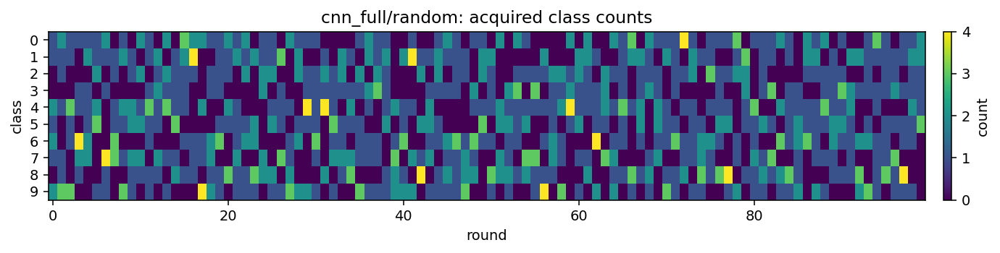

r=000 new=[2, 1, 0, 1, 0, 1, 0, 3, 0, 2] cum=[2, 1, 0, 1, 0, 1, 0, 3, 0, 2]
r=010 new=[0, 1, 1, 0, 2, 1, 3, 1, 1, 0] cum=[10, 11, 7, 10, 13, 16, 9, 10, 10, 14]
r=020 new=[0, 1, 3, 1, 1, 0, 0, 0, 2, 2] cum=[18, 21, 23, 19, 24, 18, 26, 14, 25, 22]
r=030 new=[2, 1, 0, 1, 1, 1, 2, 2, 0, 0] cum=[26, 32, 31, 27, 38, 27, 38, 35, 30, 26]
r=040 new=[1, 0, 1, 0, 2, 3, 0, 2, 0, 1] cum=[40, 44, 43, 32, 47, 40, 47, 45, 37, 35]
r=050 new=[1, 0, 1, 2, 2, 1, 1, 0, 1, 1] cum=[52, 51, 49, 47, 53, 56, 57, 54, 41, 50]
r=060 new=[1, 2, 0, 2, 1, 1, 1, 0, 1, 1] cum=[61, 64, 57, 59, 63, 66, 66, 60, 51, 63]
r=070 new=[2, 1, 1, 1, 1, 1, 1, 1, 0, 1] cum=[72, 75, 69, 70, 70, 73, 78, 72, 61, 70]
r=080 new=[2, 0, 1, 0, 2, 0, 0, 1, 3, 1] cum=[84, 92, 73, 81, 78, 79, 82, 86, 79, 76]
r=090 new=[0, 0, 2, 3, 2, 1, 1, 0, 0, 1] cum=[95, 99, 88, 89, 87, 87, 90, 101, 90, 84]


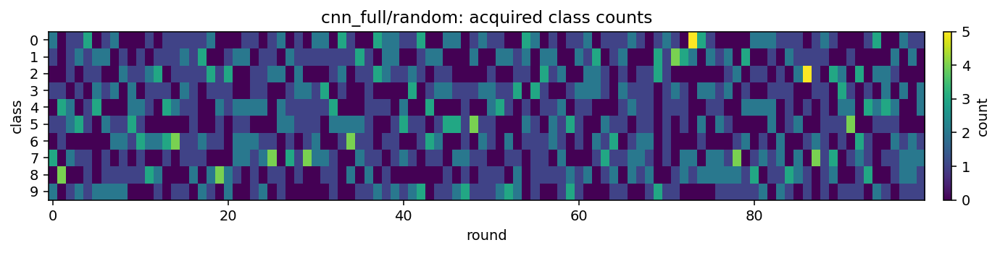

r=000 new=[2, 1, 0, 0, 2, 0, 1, 1, 0, 3] cum=[2, 1, 0, 0, 2, 0, 1, 1, 0, 3]
r=010 new=[0, 0, 2, 1, 1, 0, 1, 3, 1, 1] cum=[12, 8, 6, 9, 10, 13, 15, 15, 7, 15]
r=020 new=[1, 0, 3, 1, 0, 0, 3, 0, 2, 0] cum=[18, 14, 18, 20, 24, 23, 28, 23, 16, 26]
r=030 new=[2, 0, 0, 2, 1, 2, 1, 0, 0, 2] cum=[29, 30, 28, 28, 29, 33, 37, 30, 24, 42]
r=040 new=[0, 2, 0, 1, 0, 1, 1, 3, 1, 1] cum=[36, 41, 37, 39, 40, 43, 50, 42, 31, 51]
r=050 new=[1, 2, 1, 2, 1, 0, 0, 1, 1, 1] cum=[40, 55, 46, 50, 48, 50, 61, 53, 45, 62]
r=060 new=[0, 1, 2, 1, 0, 1, 3, 2, 0, 0] cum=[48, 64, 56, 62, 56, 56, 80, 65, 52, 71]
r=070 new=[1, 1, 1, 1, 0, 1, 1, 2, 1, 1] cum=[53, 73, 65, 73, 72, 66, 88, 77, 64, 79]
r=080 new=[1, 1, 0, 1, 1, 0, 2, 0, 2, 2] cum=[62, 88, 76, 83, 85, 70, 98, 87, 72, 89]
r=090 new=[0, 3, 0, 1, 1, 1, 1, 0, 0, 3] cum=[69, 102, 85, 93, 95, 78, 112, 98, 77, 101]


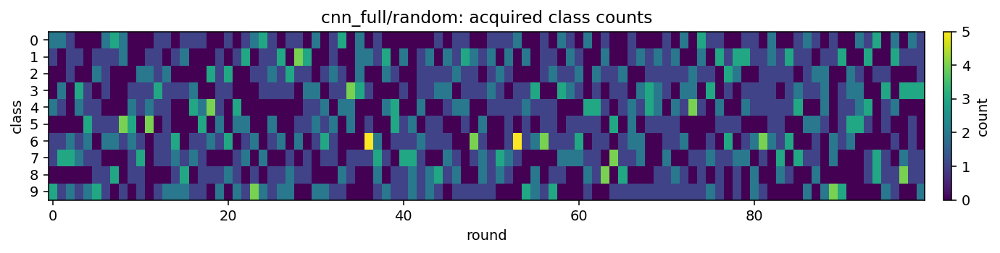

r=000 new=[1, 1, 0, 0, 2, 1, 2, 1, 0, 2] cum=[1, 1, 0, 0, 2, 1, 2, 1, 0, 2]
r=010 new=[2, 0, 2, 0, 1, 2, 0, 2, 1, 0] cum=[12, 11, 7, 3, 16, 12, 12, 18, 5, 14]
r=020 new=[2, 1, 1, 0, 2, 1, 0, 0, 3, 0] cum=[26, 23, 16, 11, 29, 19, 21, 26, 16, 23]
r=030 new=[1, 0, 1, 1, 1, 1, 3, 1, 0, 1] cum=[36, 35, 26, 16, 38, 29, 32, 35, 27, 36]
r=040 new=[0, 2, 0, 0, 1, 1, 3, 0, 1, 2] cum=[41, 46, 36, 27, 50, 38, 41, 47, 37, 47]
r=050 new=[0, 2, 1, 1, 1, 0, 1, 0, 3, 1] cum=[48, 61, 45, 34, 56, 46, 54, 57, 52, 57]
r=060 new=[0, 2, 2, 1, 1, 2, 0, 1, 0, 1] cum=[55, 65, 56, 47, 71, 57, 60, 70, 62, 67]
r=070 new=[1, 2, 0, 0, 1, 1, 1, 0, 1, 3] cum=[67, 76, 64, 56, 85, 65, 69, 79, 73, 76]
r=080 new=[1, 0, 0, 0, 3, 1, 1, 2, 1, 1] cum=[80, 85, 77, 60, 94, 74, 81, 87, 89, 83]
r=090 new=[1, 0, 1, 3, 1, 2, 1, 0, 1, 0] cum=[91, 93, 83, 71, 105, 87, 94, 95, 100, 91]


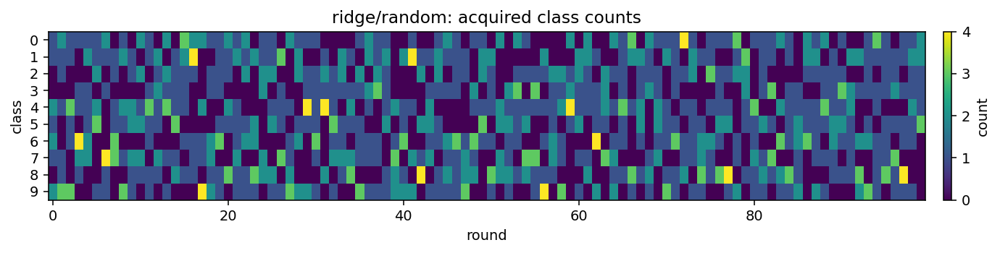

r=000 new=[2, 1, 0, 1, 0, 1, 0, 3, 0, 2] cum=[2, 1, 0, 1, 0, 1, 0, 3, 0, 2]
r=010 new=[0, 1, 1, 0, 2, 1, 3, 1, 1, 0] cum=[10, 11, 7, 10, 13, 16, 9, 10, 10, 14]
r=020 new=[0, 1, 3, 1, 1, 0, 0, 0, 2, 2] cum=[18, 21, 23, 19, 24, 18, 26, 14, 25, 22]
r=030 new=[2, 1, 0, 1, 1, 1, 2, 2, 0, 0] cum=[26, 32, 31, 27, 38, 27, 38, 35, 30, 26]
r=040 new=[1, 0, 1, 0, 2, 3, 0, 2, 0, 1] cum=[40, 44, 43, 32, 47, 40, 47, 45, 37, 35]
r=050 new=[1, 0, 1, 2, 2, 1, 1, 0, 1, 1] cum=[52, 51, 49, 47, 53, 56, 57, 54, 41, 50]
r=060 new=[1, 2, 0, 2, 1, 1, 1, 0, 1, 1] cum=[61, 64, 57, 59, 63, 66, 66, 60, 51, 63]
r=070 new=[2, 1, 1, 1, 1, 1, 1, 1, 0, 1] cum=[72, 75, 69, 70, 70, 73, 78, 72, 61, 70]
r=080 new=[2, 0, 1, 0, 2, 0, 0, 1, 3, 1] cum=[84, 92, 73, 81, 78, 79, 82, 86, 79, 76]
r=090 new=[0, 0, 2, 3, 2, 1, 1, 0, 0, 1] cum=[95, 99, 88, 89, 87, 87, 90, 101, 90, 84]


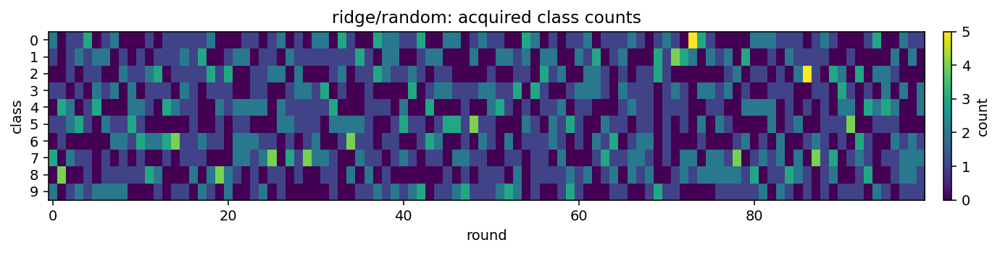

r=000 new=[2, 1, 0, 0, 2, 0, 1, 1, 0, 3] cum=[2, 1, 0, 0, 2, 0, 1, 1, 0, 3]
r=010 new=[0, 0, 2, 1, 1, 0, 1, 3, 1, 1] cum=[12, 8, 6, 9, 10, 13, 15, 15, 7, 15]
r=020 new=[1, 0, 3, 1, 0, 0, 3, 0, 2, 0] cum=[18, 14, 18, 20, 24, 23, 28, 23, 16, 26]
r=030 new=[2, 0, 0, 2, 1, 2, 1, 0, 0, 2] cum=[29, 30, 28, 28, 29, 33, 37, 30, 24, 42]
r=040 new=[0, 2, 0, 1, 0, 1, 1, 3, 1, 1] cum=[36, 41, 37, 39, 40, 43, 50, 42, 31, 51]
r=050 new=[1, 2, 1, 2, 1, 0, 0, 1, 1, 1] cum=[40, 55, 46, 50, 48, 50, 61, 53, 45, 62]
r=060 new=[0, 1, 2, 1, 0, 1, 3, 2, 0, 0] cum=[48, 64, 56, 62, 56, 56, 80, 65, 52, 71]
r=070 new=[1, 1, 1, 1, 0, 1, 1, 2, 1, 1] cum=[53, 73, 65, 73, 72, 66, 88, 77, 64, 79]
r=080 new=[1, 1, 0, 1, 1, 0, 2, 0, 2, 2] cum=[62, 88, 76, 83, 85, 70, 98, 87, 72, 89]
r=090 new=[0, 3, 0, 1, 1, 1, 1, 0, 0, 3] cum=[69, 102, 85, 93, 95, 78, 112, 98, 77, 101]


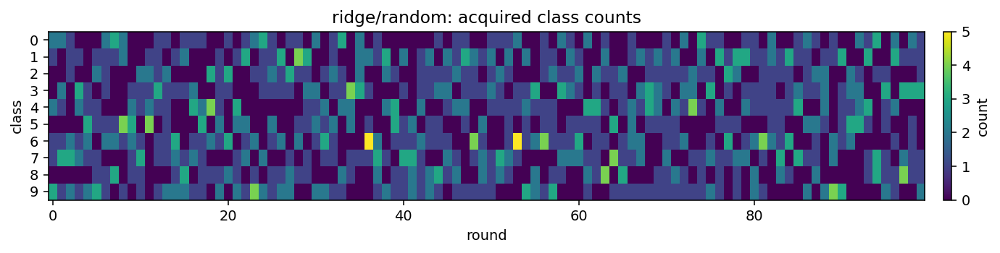

r=000 new=[1, 0, 1, 2, 1, 1, 1, 0, 2, 1] cum=[1, 0, 1, 2, 1, 1, 1, 0, 2, 1]
r=010 new=[1, 0, 2, 2, 0, 1, 0, 1, 2, 1] cum=[8, 2, 15, 15, 12, 14, 11, 8, 19, 6]
r=020 new=[0, 0, 2, 2, 1, 0, 0, 0, 0, 5] cum=[12, 8, 26, 26, 22, 26, 18, 16, 32, 24]
r=030 new=[0, 2, 2, 2, 1, 2, 0, 0, 0, 1] cum=[23, 16, 42, 40, 31, 37, 24, 23, 43, 31]
r=040 new=[0, 1, 1, 1, 0, 1, 1, 1, 4, 0] cum=[28, 21, 53, 54, 40, 52, 27, 34, 57, 44]
r=050 new=[2, 0, 1, 1, 0, 0, 1, 3, 1, 1] cum=[39, 25, 70, 64, 47, 66, 32, 43, 73, 51]
r=060 new=[0, 1, 2, 0, 0, 1, 0, 0, 6, 0] cum=[42, 31, 82, 74, 57, 76, 35, 55, 94, 64]
r=070 new=[3, 2, 2, 0, 1, 0, 0, 0, 1, 1] cum=[49, 40, 94, 86, 67, 82, 42, 67, 109, 74]
r=080 new=[0, 1, 1, 1, 2, 0, 0, 1, 2, 2] cum=[58, 46, 111, 95, 74, 91, 47, 75, 129, 84]
r=090 new=[2, 0, 2, 2, 0, 0, 1, 0, 2, 1] cum=[69, 49, 125, 107, 84, 100, 53, 84, 146, 93]


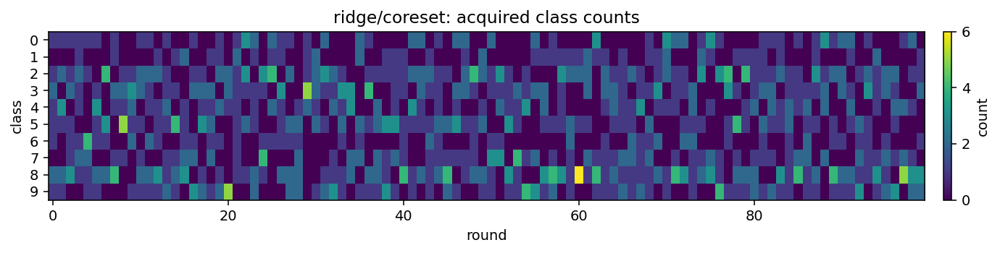

r=000 new=[0, 0, 0, 3, 2, 0, 2, 1, 1, 1] cum=[0, 0, 0, 3, 2, 0, 2, 1, 1, 1]
r=010 new=[1, 0, 2, 0, 0, 1, 2, 1, 3, 0] cum=[9, 4, 13, 14, 11, 13, 12, 7, 18, 9]
r=020 new=[0, 2, 1, 1, 1, 1, 0, 1, 2, 1] cum=[19, 9, 25, 20, 21, 27, 14, 17, 40, 18]
r=030 new=[2, 0, 3, 2, 0, 0, 0, 1, 1, 1] cum=[27, 12, 36, 32, 29, 41, 17, 26, 54, 36]
r=040 new=[1, 0, 2, 1, 1, 2, 0, 1, 2, 0] cum=[35, 16, 53, 44, 42, 55, 23, 32, 67, 43]
r=050 new=[1, 0, 2, 3, 0, 1, 0, 2, 1, 0] cum=[39, 18, 68, 61, 53, 62, 30, 48, 83, 48]
r=060 new=[0, 2, 1, 0, 1, 3, 0, 0, 2, 1] cum=[46, 24, 73, 72, 65, 76, 34, 59, 99, 62]
r=070 new=[1, 1, 0, 2, 0, 0, 1, 1, 3, 1] cum=[53, 30, 84, 83, 73, 92, 42, 65, 119, 69]
r=080 new=[1, 1, 1, 0, 1, 2, 1, 0, 0, 3] cum=[62, 37, 95, 96, 82, 102, 47, 72, 134, 83]
r=090 new=[0, 0, 2, 0, 2, 3, 1, 0, 2, 0] cum=[67, 41, 114, 108, 94, 115, 53, 76, 152, 90]


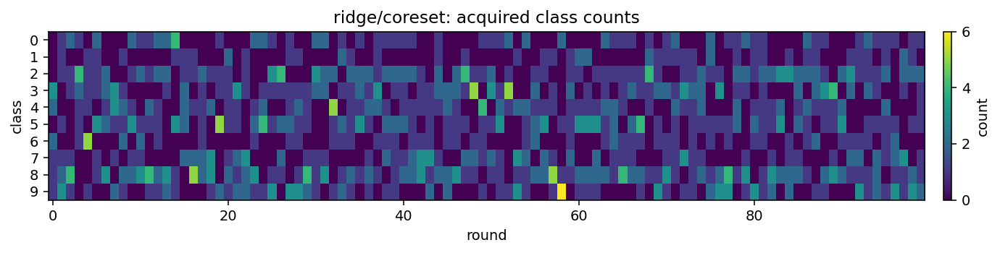

r=000 new=[1, 0, 2, 1, 0, 1, 1, 1, 3, 0] cum=[1, 0, 2, 1, 0, 1, 1, 1, 3, 0]
r=010 new=[0, 0, 4, 3, 1, 1, 0, 1, 0, 0] cum=[7, 4, 17, 19, 9, 15, 6, 10, 15, 8]
r=020 new=[2, 0, 4, 0, 1, 0, 0, 0, 2, 1] cum=[13, 10, 38, 26, 21, 24, 11, 17, 32, 18]
r=030 new=[1, 0, 1, 3, 0, 2, 0, 1, 2, 0] cum=[19, 15, 49, 39, 27, 37, 18, 28, 49, 29]
r=040 new=[1, 0, 0, 2, 0, 0, 0, 1, 4, 2] cum=[29, 19, 65, 58, 32, 46, 26, 34, 64, 37]
r=050 new=[0, 1, 0, 2, 1, 0, 1, 1, 1, 3] cum=[32, 26, 76, 71, 48, 53, 31, 47, 72, 54]
r=060 new=[1, 2, 0, 2, 1, 0, 0, 0, 4, 0] cum=[40, 36, 89, 87, 58, 62, 32, 56, 92, 58]
r=070 new=[3, 0, 0, 2, 1, 0, 0, 1, 2, 1] cum=[49, 43, 106, 97, 71, 73, 39, 61, 104, 67]
r=080 new=[1, 1, 0, 2, 0, 0, 1, 0, 4, 1] cum=[56, 51, 124, 112, 82, 79, 42, 65, 122, 77]
r=090 new=[0, 0, 1, 0, 3, 1, 0, 1, 0, 4] cum=[60, 54, 134, 122, 93, 87, 52, 80, 135, 93]


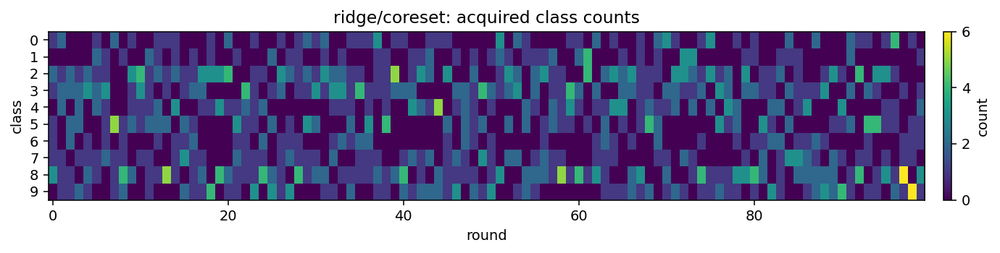

r=000 new=[1, 1, 0, 0, 2, 1, 2, 1, 0, 2] cum=[1, 1, 0, 0, 2, 1, 2, 1, 0, 2]
r=010 new=[2, 0, 2, 0, 1, 2, 0, 2, 1, 0] cum=[12, 11, 7, 3, 16, 12, 12, 18, 5, 14]
r=020 new=[2, 1, 1, 0, 2, 1, 0, 0, 3, 0] cum=[26, 23, 16, 11, 29, 19, 21, 26, 16, 23]
r=030 new=[1, 0, 1, 1, 1, 1, 3, 1, 0, 1] cum=[36, 35, 26, 16, 38, 29, 32, 35, 27, 36]
r=040 new=[0, 2, 0, 0, 1, 1, 3, 0, 1, 2] cum=[41, 46, 36, 27, 50, 38, 41, 47, 37, 47]
r=050 new=[0, 2, 1, 1, 1, 0, 1, 0, 3, 1] cum=[48, 61, 45, 34, 56, 46, 54, 57, 52, 57]
r=060 new=[0, 2, 2, 1, 1, 2, 0, 1, 0, 1] cum=[55, 65, 56, 47, 71, 57, 60, 70, 62, 67]
r=070 new=[1, 2, 0, 0, 1, 1, 1, 0, 1, 3] cum=[67, 76, 64, 56, 85, 65, 69, 79, 73, 76]
r=080 new=[1, 0, 0, 0, 3, 1, 1, 2, 1, 1] cum=[80, 85, 77, 60, 94, 74, 81, 87, 89, 83]
r=090 new=[1, 0, 1, 3, 1, 2, 1, 0, 1, 0] cum=[91, 93, 83, 71, 105, 87, 94, 95, 100, 91]


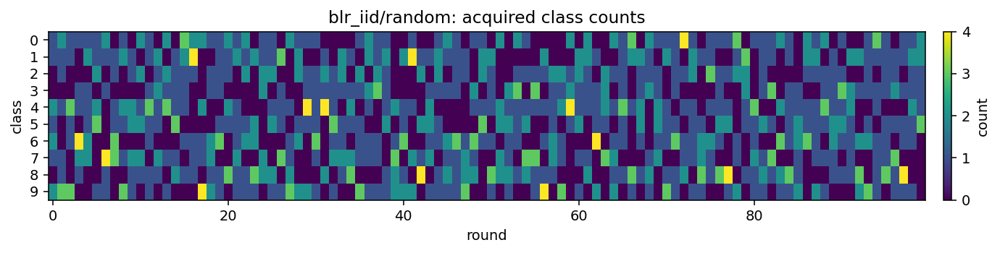

r=000 new=[2, 1, 0, 1, 0, 1, 0, 3, 0, 2] cum=[2, 1, 0, 1, 0, 1, 0, 3, 0, 2]
r=010 new=[0, 1, 1, 0, 2, 1, 3, 1, 1, 0] cum=[10, 11, 7, 10, 13, 16, 9, 10, 10, 14]
r=020 new=[0, 1, 3, 1, 1, 0, 0, 0, 2, 2] cum=[18, 21, 23, 19, 24, 18, 26, 14, 25, 22]
r=030 new=[2, 1, 0, 1, 1, 1, 2, 2, 0, 0] cum=[26, 32, 31, 27, 38, 27, 38, 35, 30, 26]
r=040 new=[1, 0, 1, 0, 2, 3, 0, 2, 0, 1] cum=[40, 44, 43, 32, 47, 40, 47, 45, 37, 35]
r=050 new=[1, 0, 1, 2, 2, 1, 1, 0, 1, 1] cum=[52, 51, 49, 47, 53, 56, 57, 54, 41, 50]
r=060 new=[1, 2, 0, 2, 1, 1, 1, 0, 1, 1] cum=[61, 64, 57, 59, 63, 66, 66, 60, 51, 63]
r=070 new=[2, 1, 1, 1, 1, 1, 1, 1, 0, 1] cum=[72, 75, 69, 70, 70, 73, 78, 72, 61, 70]
r=080 new=[2, 0, 1, 0, 2, 0, 0, 1, 3, 1] cum=[84, 92, 73, 81, 78, 79, 82, 86, 79, 76]
r=090 new=[0, 0, 2, 3, 2, 1, 1, 0, 0, 1] cum=[95, 99, 88, 89, 87, 87, 90, 101, 90, 84]


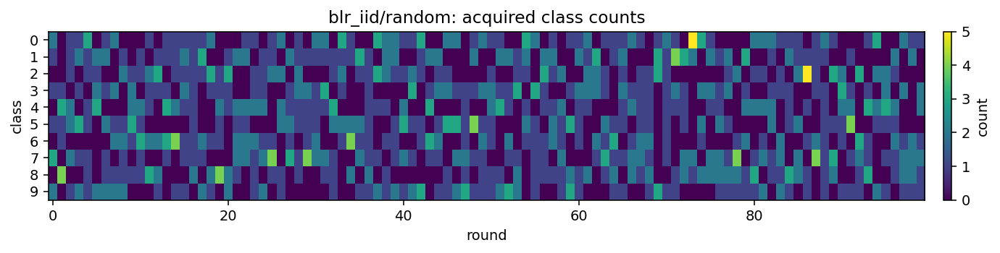

r=000 new=[2, 1, 0, 0, 2, 0, 1, 1, 0, 3] cum=[2, 1, 0, 0, 2, 0, 1, 1, 0, 3]
r=010 new=[0, 0, 2, 1, 1, 0, 1, 3, 1, 1] cum=[12, 8, 6, 9, 10, 13, 15, 15, 7, 15]
r=020 new=[1, 0, 3, 1, 0, 0, 3, 0, 2, 0] cum=[18, 14, 18, 20, 24, 23, 28, 23, 16, 26]
r=030 new=[2, 0, 0, 2, 1, 2, 1, 0, 0, 2] cum=[29, 30, 28, 28, 29, 33, 37, 30, 24, 42]
r=040 new=[0, 2, 0, 1, 0, 1, 1, 3, 1, 1] cum=[36, 41, 37, 39, 40, 43, 50, 42, 31, 51]
r=050 new=[1, 2, 1, 2, 1, 0, 0, 1, 1, 1] cum=[40, 55, 46, 50, 48, 50, 61, 53, 45, 62]
r=060 new=[0, 1, 2, 1, 0, 1, 3, 2, 0, 0] cum=[48, 64, 56, 62, 56, 56, 80, 65, 52, 71]
r=070 new=[1, 1, 1, 1, 0, 1, 1, 2, 1, 1] cum=[53, 73, 65, 73, 72, 66, 88, 77, 64, 79]
r=080 new=[1, 1, 0, 1, 1, 0, 2, 0, 2, 2] cum=[62, 88, 76, 83, 85, 70, 98, 87, 72, 89]
r=090 new=[0, 3, 0, 1, 1, 1, 1, 0, 0, 3] cum=[69, 102, 85, 93, 95, 78, 112, 98, 77, 101]


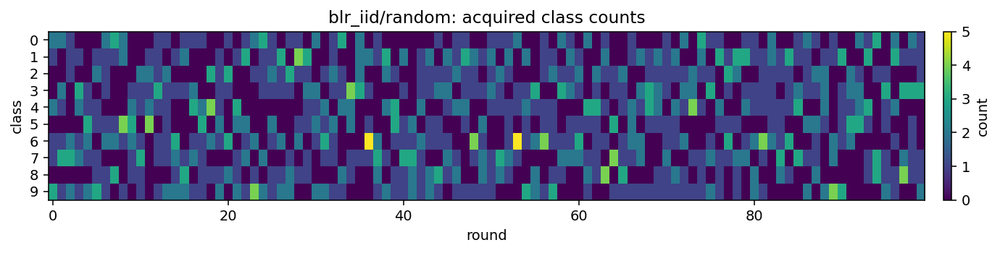

[acq dbg] r=000 blr_iid std=4.46 q10=3.3 q50=8.84 q90=14.7 min=0.26 max=25.6 p90/p10=4.46 uniq~=2000/2000
r=000 new=[1, 0, 2, 0, 0, 5, 2, 0, 0, 0] cum=[1, 0, 2, 0, 0, 5, 2, 0, 0, 0]
[acq dbg] r=005 blr_iid std=0.175 q10=0.107 q50=0.266 q90=0.538 min=0.0247 max=1.37 p90/p10=5.02 uniq~=2000/2000
[acq dbg] r=010 blr_iid std=0.0104 q10=0.00775 q50=0.0156 q90=0.0324 min=0.00321 max=0.0741 p90/p10=4.18 uniq~=2000/2000
r=010 new=[1, 1, 0, 2, 0, 1, 0, 2, 3, 0] cum=[9, 4, 18, 12, 12, 18, 10, 10, 11, 6]
[acq dbg] r=015 blr_iid std=0.0118 q10=0.00205 q50=0.0036 q90=0.00657 min=0.00106 max=0.311 p90/p10=3.2 uniq~=2000/2000
[acq dbg] r=020 blr_iid std=0.00197 q10=0.00178 q50=0.00333 q90=0.00639 min=0.00101 max=0.0155 p90/p10=3.59 uniq~=2000/2000
r=020 new=[0, 0, 2, 0, 1, 1, 0, 2, 2, 2] cum=[18, 15, 28, 25, 20, 28, 14, 22, 25, 15]
[acq dbg] r=025 blr_iid std=0.00202 q10=0.00188 q50=0.0033 q90=0.0064 min=0.000959 max=0.0164 p90/p10=3.41 uniq~=2000/2000
[acq dbg] r=030 blr_iid std=0.00297 q10=0.00137 

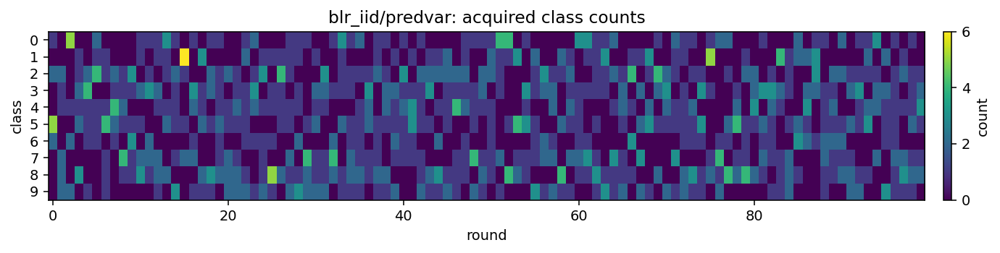

[acq dbg] r=000 blr_iid std=4.34 q10=3.82 q50=8.81 q90=15 min=0.495 max=25 p90/p10=3.93 uniq~=2000/2000
r=000 new=[4, 0, 0, 0, 2, 1, 1, 1, 0, 1] cum=[4, 0, 0, 0, 2, 1, 1, 1, 0, 1]
[acq dbg] r=005 blr_iid std=0.0226 q10=0.0155 q50=0.0354 q90=0.0672 min=0.00555 max=0.24 p90/p10=4.34 uniq~=2000/2000
[acq dbg] r=010 blr_iid std=0.0152 q10=0.00992 q50=0.0217 q90=0.0465 min=0.00431 max=0.109 p90/p10=4.68 uniq~=2000/2000
r=010 new=[1, 0, 1, 1, 0, 0, 1, 1, 3, 2] cum=[13, 3, 12, 9, 12, 15, 9, 13, 15, 9]
[acq dbg] r=015 blr_iid std=0.00711 q10=0.00532 q50=0.0105 q90=0.0208 min=0.0018 max=0.0679 p90/p10=3.91 uniq~=2000/2000
[acq dbg] r=020 blr_iid std=0.0012 q10=0.00131 q50=0.00218 q90=0.00397 min=0.000675 max=0.0112 p90/p10=3.03 uniq~=2000/2000
r=020 new=[0, 1, 1, 0, 1, 4, 2, 0, 1, 0] cum=[16, 14, 25, 17, 24, 28, 17, 25, 30, 14]
[acq dbg] r=025 blr_iid std=0.0529 q10=0.000968 q50=0.00158 q90=0.00305 min=0.000502 max=1.71 p90/p10=3.15 uniq~=2000/2000
[acq dbg] r=030 blr_iid std=0.0019 q10=0.00162

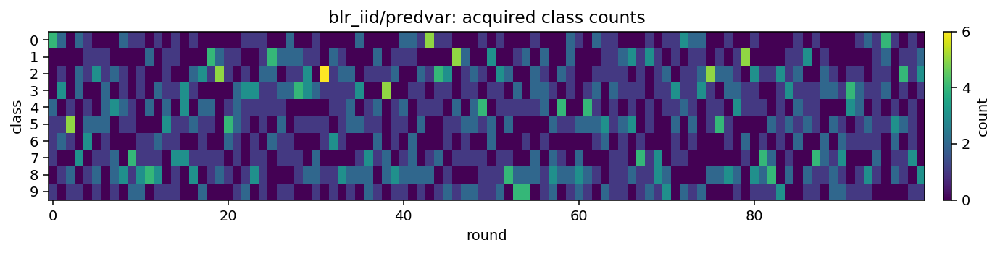

[acq dbg] r=000 blr_iid std=4.7 q10=3.19 q50=9.23 q90=15.7 min=0.175 max=24.5 p90/p10=4.92 uniq~=2000/2000
r=000 new=[0, 6, 1, 0, 0, 1, 0, 1, 1, 0] cum=[0, 6, 1, 0, 0, 1, 0, 1, 1, 0]
[acq dbg] r=005 blr_iid std=0.104 q10=0.0423 q50=0.136 q90=0.292 min=0.00721 max=0.806 p90/p10=6.88 uniq~=2000/2000
[acq dbg] r=010 blr_iid std=0.00813 q10=0.00778 q50=0.0147 q90=0.0275 min=0.0038 max=0.0547 p90/p10=3.54 uniq~=2000/2000
r=010 new=[0, 0, 1, 1, 2, 0, 3, 0, 1, 2] cum=[11, 7, 16, 16, 9, 10, 12, 8, 13, 8]
[acq dbg] r=015 blr_iid std=0.00533 q10=0.00382 q50=0.00728 q90=0.0154 min=0.00211 max=0.0376 p90/p10=4.04 uniq~=2000/2000
[acq dbg] r=020 blr_iid std=0.00281 q10=0.00156 q50=0.00268 q90=0.0051 min=0.000866 max=0.0722 p90/p10=3.27 uniq~=2000/2000
r=020 new=[2, 3, 1, 1, 1, 1, 0, 0, 0, 1] cum=[21, 14, 32, 27, 20, 27, 18, 11, 25, 15]
[acq dbg] r=025 blr_iid std=0.00137 q10=0.00133 q50=0.00227 q90=0.00427 min=0.000668 max=0.0136 p90/p10=3.22 uniq~=2000/2000
[acq dbg] r=030 blr_iid std=0.00195 q10=

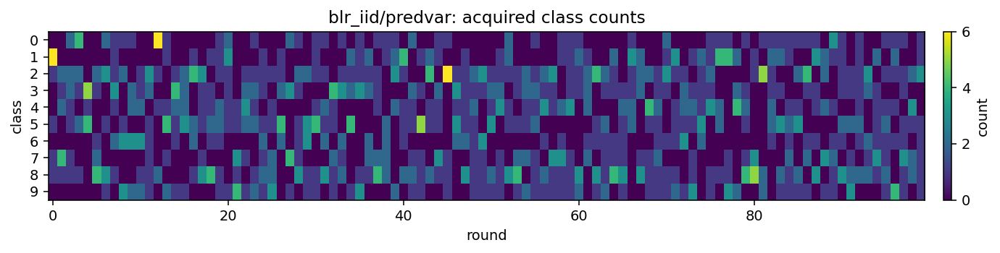

[acq dbg] r=000 blr_iid std=4.47 q10=3.28 q50=8.89 q90=14.8 min=0.258 max=25.6 p90/p10=4.5 uniq~=2000/2000
r=000 new=[0, 1, 1, 1, 2, 2, 3, 0, 0, 0] cum=[0, 1, 1, 1, 2, 2, 3, 0, 0, 0]
[acq dbg] r=005 blr_iid std=0.122 q10=0.0855 q50=0.185 q90=0.369 min=0.0159 max=1.12 p90/p10=4.31 uniq~=2000/2000
[acq dbg] r=010 blr_iid std=0.0045 q10=0.00653 q50=0.0108 q90=0.0172 min=0.00295 max=0.0435 p90/p10=2.63 uniq~=2000/2000
r=010 new=[0, 0, 1, 1, 1, 3, 1, 0, 3, 0] cum=[9, 2, 14, 14, 9, 19, 11, 8, 17, 7]
[acq dbg] r=015 blr_iid std=0.00149 q10=0.002 q50=0.0032 q90=0.00512 min=0.00109 max=0.0187 p90/p10=2.56 uniq~=2000/2000
[acq dbg] r=020 blr_iid std=0.00183 q10=0.00213 q50=0.00352 q90=0.00659 min=0.00123 max=0.0149 p90/p10=3.09 uniq~=2000/2000
r=020 new=[1, 0, 0, 2, 3, 1, 0, 1, 2, 0] cum=[21, 6, 25, 27, 20, 31, 15, 17, 33, 15]
[acq dbg] r=025 blr_iid std=0.00186 q10=0.00292 q50=0.00455 q90=0.00736 min=0.00155 max=0.0142 p90/p10=2.52 uniq~=2000/2000
[acq dbg] r=030 blr_iid std=0.000987 q10=0.0012

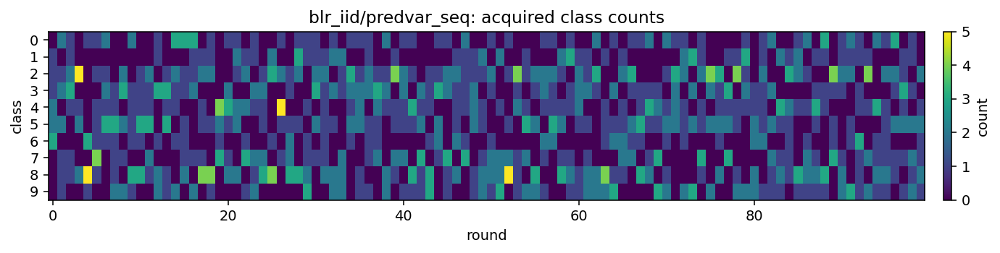

[acq dbg] r=000 blr_iid std=4.34 q10=3.82 q50=8.81 q90=15 min=0.493 max=25.3 p90/p10=3.93 uniq~=2000/2000
r=000 new=[1, 0, 1, 2, 1, 4, 1, 0, 0, 0] cum=[1, 0, 1, 2, 1, 4, 1, 0, 0, 0]
[acq dbg] r=005 blr_iid std=0.217 q10=0.125 q50=0.3 q90=0.63 min=0.0259 max=1.56 p90/p10=5.05 uniq~=2000/2000
[acq dbg] r=010 blr_iid std=0.00932 q10=0.00879 q50=0.0167 q90=0.0312 min=0.00453 max=0.0736 p90/p10=3.54 uniq~=2000/2000
r=010 new=[1, 0, 0, 0, 1, 1, 0, 0, 4, 3] cum=[8, 4, 15, 14, 10, 21, 8, 6, 12, 12]
[acq dbg] r=015 blr_iid std=0.00398 q10=0.00476 q50=0.0083 q90=0.0143 min=0.00246 max=0.0574 p90/p10=3.02 uniq~=2000/2000
[acq dbg] r=020 blr_iid std=0.00107 q10=0.00202 q50=0.00301 q90=0.00454 min=0.00101 max=0.00839 p90/p10=2.25 uniq~=2000/2000
r=020 new=[3, 0, 0, 2, 0, 0, 2, 1, 2, 0] cum=[18, 7, 25, 23, 20, 29, 17, 19, 35, 17]
[acq dbg] r=025 blr_iid std=0.464 q10=0.00122 q50=0.00188 q90=0.00304 min=0.0007 max=20.4 p90/p10=2.5 uniq~=2000/2000
[acq dbg] r=030 blr_iid std=0.00133 q10=0.00136 q50=0.

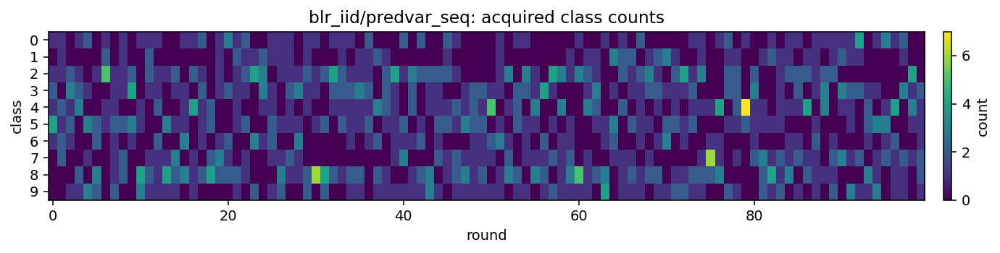

[acq dbg] r=000 blr_iid std=4.71 q10=3.19 q50=9.21 q90=15.7 min=0.174 max=24.8 p90/p10=4.93 uniq~=2000/2000
r=000 new=[1, 1, 1, 1, 0, 2, 0, 0, 2, 2] cum=[1, 1, 1, 1, 0, 2, 0, 0, 2, 2]
[acq dbg] r=005 blr_iid std=3.32 q10=1.47 q50=3.96 q90=8.84 min=0.197 max=30.8 p90/p10=6.02 uniq~=2000/2000
[acq dbg] r=010 blr_iid std=0.011 q10=0.00596 q50=0.0097 q90=0.0199 min=0.00275 max=0.17 p90/p10=3.34 uniq~=2000/2000
r=010 new=[0, 2, 0, 1, 0, 4, 1, 1, 0, 1] cum=[8, 7, 18, 15, 10, 18, 7, 6, 13, 8]
[acq dbg] r=015 blr_iid std=0.00331 q10=0.00315 q50=0.00583 q90=0.0112 min=0.00154 max=0.0246 p90/p10=3.56 uniq~=2000/2000
[acq dbg] r=020 blr_iid std=0.000999 q10=0.00189 q50=0.00265 q90=0.0041 min=0.00111 max=0.0138 p90/p10=2.17 uniq~=2000/2000
r=020 new=[2, 0, 0, 0, 3, 2, 0, 1, 1, 1] cum=[15, 11, 30, 25, 27, 30, 13, 15, 25, 19]
[acq dbg] r=025 blr_iid std=0.00116 q10=0.00129 q50=0.0022 q90=0.00375 min=0.000679 max=0.0199 p90/p10=2.91 uniq~=2000/2000
[acq dbg] r=030 blr_iid std=0.0014 q10=0.00164 q50=0

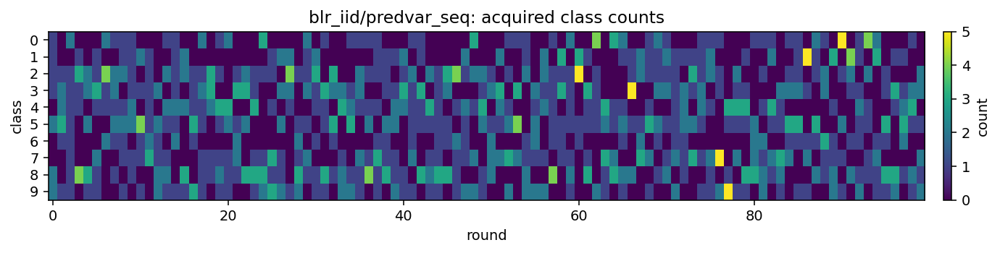

[acq dbg] r=000 blr_iid std=4.45 q10=3.26 q50=8.83 q90=14.7 min=0.248 max=25.3 p90/p10=4.5 uniq~=2000/2000
r=000 new=[0, 1, 1, 2, 1, 3, 2, 0, 0, 0] cum=[0, 1, 1, 2, 1, 3, 2, 0, 0, 0]
[acq dbg] r=005 blr_iid std=5.08 q10=2.73 q50=7.65 q90=15.6 min=0.179 max=32.3 p90/p10=5.7 uniq~=2000/2000
[acq dbg] r=010 blr_iid std=0.145 q10=0.0057 q50=0.00979 q90=0.0174 min=0.00194 max=3.6 p90/p10=3.06 uniq~=2000/2000
r=010 new=[0, 4, 0, 0, 2, 1, 0, 1, 2, 0] cum=[9, 7, 18, 9, 8, 13, 11, 9, 16, 10]
[acq dbg] r=015 blr_iid std=0.00302 q10=0.00401 q50=0.00657 q90=0.0112 min=0.00199 max=0.0235 p90/p10=2.78 uniq~=2000/2000
[acq dbg] r=020 blr_iid std=0.00121 q10=0.00187 q50=0.00299 q90=0.00473 min=0.000872 max=0.0109 p90/p10=2.53 uniq~=2000/2000
r=020 new=[1, 0, 2, 0, 1, 1, 1, 1, 0, 3] cum=[16, 12, 33, 24, 20, 23, 15, 13, 36, 18]
[acq dbg] r=025 blr_iid std=0.553 q10=0.00243 q50=0.00405 q90=0.00688 min=0.00125 max=24.6 p90/p10=2.83 uniq~=2000/2000
[acq dbg] r=030 blr_iid std=0.00131 q10=0.00121 q50=0.0021

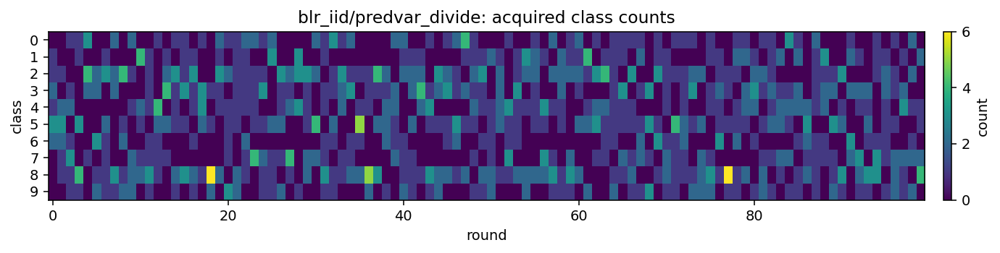

[acq dbg] r=000 blr_iid std=4.34 q10=3.83 q50=8.81 q90=15 min=0.496 max=25.2 p90/p10=3.93 uniq~=2000/2000
r=000 new=[1, 0, 1, 2, 1, 2, 2, 1, 0, 0] cum=[1, 0, 1, 2, 1, 2, 2, 1, 0, 0]
[acq dbg] r=005 blr_iid std=0.013 q10=0.0117 q50=0.0235 q90=0.0429 min=0.00419 max=0.0984 p90/p10=3.65 uniq~=2000/2000
[acq dbg] r=010 blr_iid std=0.0103 q10=0.00986 q50=0.0201 q90=0.0348 min=0.0046 max=0.0863 p90/p10=3.53 uniq~=2000/2000
r=010 new=[0, 0, 2, 3, 0, 0, 1, 3, 1, 0] cum=[9, 6, 15, 12, 12, 12, 10, 14, 12, 8]
[acq dbg] r=015 blr_iid std=0.00466 q10=0.00504 q50=0.00892 q90=0.0163 min=0.00221 max=0.035 p90/p10=3.23 uniq~=2000/2000
[acq dbg] r=020 blr_iid std=0.0013 q10=0.00149 q50=0.00245 q90=0.00407 min=0.000678 max=0.0312 p90/p10=2.74 uniq~=2000/2000
r=020 new=[0, 0, 2, 1, 0, 2, 0, 0, 4, 1] cum=[18, 8, 28, 28, 21, 25, 13, 18, 30, 21]
[acq dbg] r=025 blr_iid std=0.00164 q10=0.000915 q50=0.00146 q90=0.0024 min=0.000477 max=0.0458 p90/p10=2.62 uniq~=2000/2000
[acq dbg] r=030 blr_iid std=0.00154 q10=

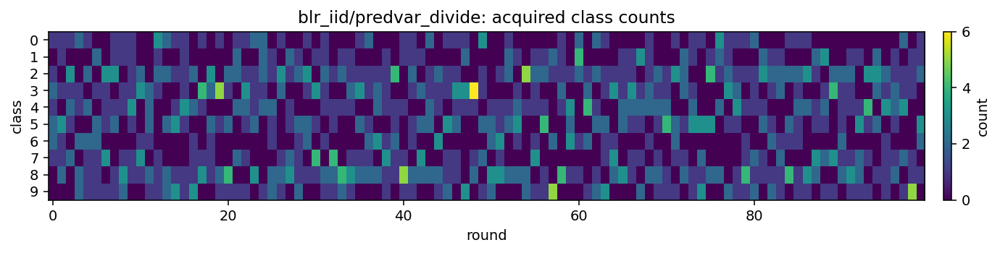

[acq dbg] r=000 blr_iid std=4.71 q10=3.19 q50=9.23 q90=15.7 min=0.174 max=24.8 p90/p10=4.93 uniq~=2000/2000
r=000 new=[1, 1, 1, 1, 0, 2, 0, 0, 2, 2] cum=[1, 1, 1, 1, 0, 2, 0, 0, 2, 2]
[acq dbg] r=005 blr_iid std=0.276 q10=0.114 q50=0.311 q90=0.723 min=0.0142 max=2.05 p90/p10=6.36 uniq~=2000/2000
[acq dbg] r=010 blr_iid std=0.0102 q10=0.0104 q50=0.018 q90=0.0318 min=0.00401 max=0.129 p90/p10=3.06 uniq~=2000/2000
r=010 new=[1, 1, 0, 0, 1, 3, 0, 1, 3, 0] cum=[9, 3, 15, 13, 13, 15, 8, 7, 18, 9]
[acq dbg] r=015 blr_iid std=0.00461 q10=0.00489 q50=0.00931 q90=0.0161 min=0.00249 max=0.0379 p90/p10=3.3 uniq~=2000/2000
[acq dbg] r=020 blr_iid std=0.0156 q10=0.00279 q50=0.00448 q90=0.0078 min=0.00148 max=0.438 p90/p10=2.79 uniq~=2000/2000
r=020 new=[1, 0, 0, 0, 0, 1, 1, 1, 4, 2] cum=[17, 9, 24, 19, 24, 28, 14, 22, 37, 16]
[acq dbg] r=025 blr_iid std=0.0254 q10=0.00138 q50=0.00216 q90=0.00345 min=0.000924 max=0.77 p90/p10=2.51 uniq~=2000/2000
[acq dbg] r=030 blr_iid std=0.00149 q10=0.00155 q50=0.

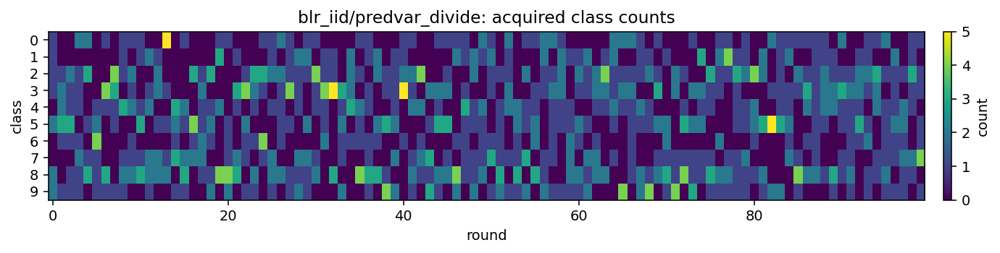

r=000 new=[0, 1, 1, 3, 2, 1, 1, 0, 1, 0] cum=[0, 1, 1, 3, 2, 1, 1, 0, 1, 0]
r=010 new=[1, 1, 2, 1, 1, 0, 1, 0, 0, 3] cum=[8, 4, 18, 11, 11, 16, 6, 10, 16, 10]
r=020 new=[1, 0, 0, 3, 1, 1, 1, 0, 3, 0] cum=[16, 6, 28, 30, 24, 26, 13, 16, 31, 20]
r=030 new=[2, 0, 0, 1, 1, 3, 1, 0, 2, 0] cum=[24, 12, 38, 38, 36, 38, 25, 21, 48, 30]
r=040 new=[0, 0, 2, 2, 1, 0, 0, 2, 2, 1] cum=[33, 16, 48, 50, 39, 50, 29, 37, 66, 42]
r=050 new=[0, 0, 3, 0, 1, 1, 1, 2, 1, 1] cum=[39, 21, 70, 60, 46, 64, 32, 45, 78, 55]
r=060 new=[0, 1, 2, 2, 1, 0, 1, 2, 1, 0] cum=[45, 29, 82, 77, 53, 78, 39, 56, 90, 61]
r=070 new=[1, 0, 1, 2, 2, 0, 0, 0, 0, 4] cum=[56, 34, 91, 87, 67, 83, 42, 64, 102, 84]
r=080 new=[0, 1, 2, 2, 0, 0, 2, 0, 1, 2] cum=[58, 41, 107, 103, 72, 88, 51, 74, 122, 94]
r=090 new=[1, 1, 0, 4, 0, 0, 1, 0, 3, 0] cum=[69, 46, 117, 110, 83, 103, 57, 81, 139, 105]


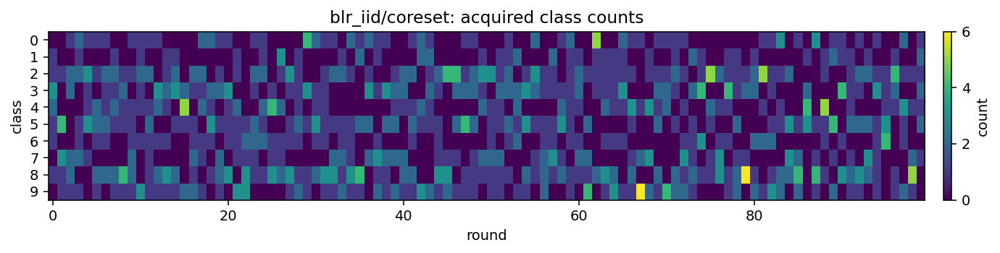

r=000 new=[0, 0, 0, 2, 2, 1, 2, 1, 2, 0] cum=[0, 0, 0, 2, 2, 1, 2, 1, 2, 0]
r=010 new=[0, 0, 1, 0, 0, 3, 0, 1, 4, 1] cum=[12, 3, 14, 14, 7, 14, 7, 8, 20, 11]
r=020 new=[0, 0, 0, 0, 2, 0, 1, 1, 5, 1] cum=[19, 6, 31, 24, 21, 22, 12, 19, 34, 22]
r=030 new=[0, 0, 1, 3, 0, 1, 1, 2, 0, 2] cum=[24, 13, 40, 41, 32, 37, 20, 25, 45, 33]
r=040 new=[1, 1, 1, 3, 0, 2, 0, 1, 1, 0] cum=[30, 17, 54, 62, 39, 48, 25, 34, 63, 38]
r=050 new=[0, 1, 0, 0, 0, 1, 0, 0, 3, 5] cum=[36, 22, 70, 68, 49, 62, 28, 45, 83, 47]
r=060 new=[0, 0, 3, 1, 3, 1, 0, 0, 1, 1] cum=[44, 28, 83, 77, 57, 78, 35, 52, 98, 58]
r=070 new=[1, 1, 1, 2, 0, 0, 2, 1, 1, 1] cum=[45, 43, 94, 95, 66, 86, 43, 61, 109, 68]
r=080 new=[0, 0, 3, 1, 1, 2, 1, 0, 0, 2] cum=[51, 48, 110, 109, 79, 98, 47, 71, 122, 75]
r=090 new=[0, 1, 0, 0, 2, 1, 0, 0, 3, 3] cum=[56, 53, 118, 113, 93, 105, 54, 87, 142, 89]


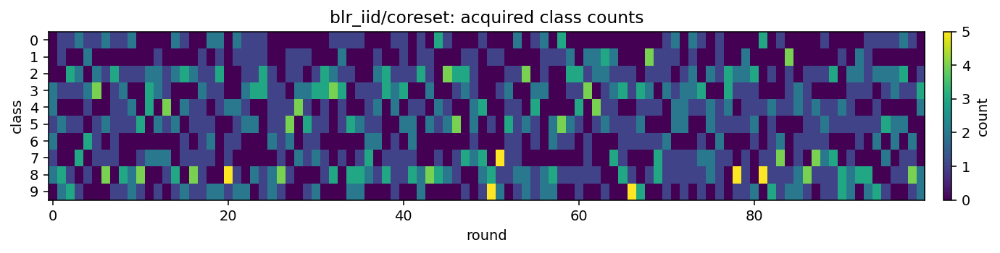

r=000 new=[0, 0, 2, 2, 0, 2, 0, 0, 2, 2] cum=[0, 0, 2, 2, 0, 2, 0, 0, 2, 2]
r=010 new=[1, 1, 0, 2, 1, 0, 1, 0, 1, 3] cum=[7, 4, 17, 14, 10, 18, 7, 11, 14, 8]
r=020 new=[0, 0, 0, 2, 0, 0, 1, 3, 2, 2] cum=[13, 10, 32, 27, 20, 30, 13, 22, 25, 18]
r=030 new=[0, 0, 2, 2, 0, 1, 0, 1, 2, 2] cum=[21, 15, 43, 44, 29, 43, 17, 28, 44, 26]
r=040 new=[0, 0, 0, 2, 1, 2, 1, 1, 2, 1] cum=[31, 19, 53, 55, 39, 56, 23, 33, 65, 36]
r=050 new=[1, 0, 2, 3, 1, 0, 2, 0, 1, 0] cum=[36, 24, 70, 62, 51, 62, 36, 37, 86, 46]
r=060 new=[1, 0, 2, 1, 0, 0, 0, 1, 3, 2] cum=[46, 26, 78, 79, 54, 75, 41, 48, 105, 58]
r=070 new=[2, 0, 0, 1, 2, 0, 1, 2, 1, 1] cum=[51, 31, 95, 91, 63, 87, 47, 52, 123, 70]
r=080 new=[0, 0, 1, 2, 1, 2, 0, 1, 2, 1] cum=[55, 42, 105, 104, 75, 97, 53, 62, 134, 83]
r=090 new=[1, 0, 0, 1, 1, 2, 0, 3, 1, 1] cum=[64, 49, 116, 118, 82, 108, 58, 70, 150, 95]


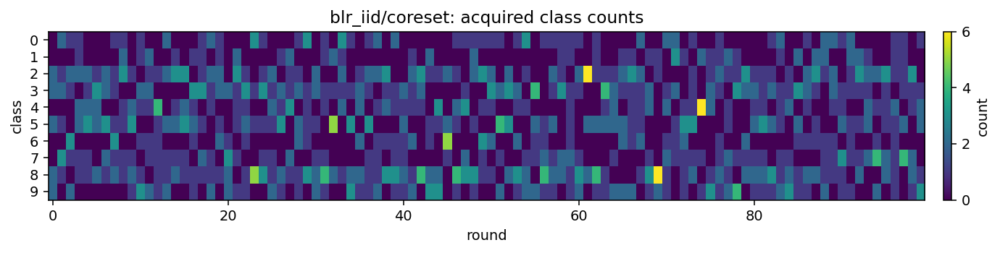

r=000 new=[1, 1, 0, 0, 2, 1, 2, 1, 0, 2] cum=[1, 1, 0, 0, 2, 1, 2, 1, 0, 2]
r=010 new=[2, 0, 2, 0, 1, 2, 0, 2, 1, 0] cum=[12, 11, 7, 3, 16, 12, 12, 18, 5, 14]
r=020 new=[2, 1, 1, 0, 2, 1, 0, 0, 3, 0] cum=[26, 23, 16, 11, 29, 19, 21, 26, 16, 23]
r=030 new=[1, 0, 1, 1, 1, 1, 3, 1, 0, 1] cum=[36, 35, 26, 16, 38, 29, 32, 35, 27, 36]
r=040 new=[0, 2, 0, 0, 1, 1, 3, 0, 1, 2] cum=[41, 46, 36, 27, 50, 38, 41, 47, 37, 47]
r=050 new=[0, 2, 1, 1, 1, 0, 1, 0, 3, 1] cum=[48, 61, 45, 34, 56, 46, 54, 57, 52, 57]
r=060 new=[0, 2, 2, 1, 1, 2, 0, 1, 0, 1] cum=[55, 65, 56, 47, 71, 57, 60, 70, 62, 67]
r=070 new=[1, 2, 0, 0, 1, 1, 1, 0, 1, 3] cum=[67, 76, 64, 56, 85, 65, 69, 79, 73, 76]
r=080 new=[1, 0, 0, 0, 3, 1, 1, 2, 1, 1] cum=[80, 85, 77, 60, 94, 74, 81, 87, 89, 83]
r=090 new=[1, 0, 1, 3, 1, 2, 1, 0, 1, 0] cum=[91, 93, 83, 71, 105, 87, 94, 95, 100, 91]


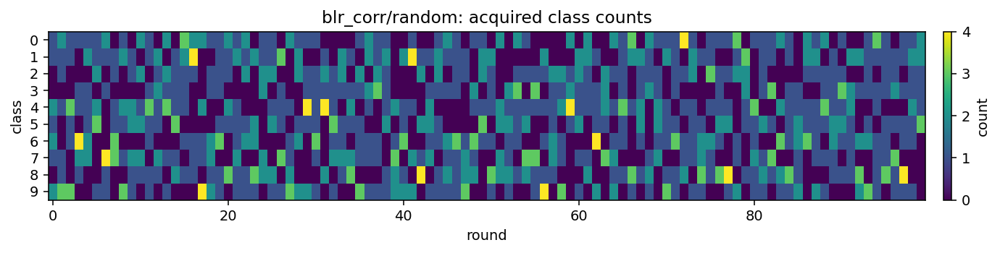

r=000 new=[2, 1, 0, 1, 0, 1, 0, 3, 0, 2] cum=[2, 1, 0, 1, 0, 1, 0, 3, 0, 2]
r=010 new=[0, 1, 1, 0, 2, 1, 3, 1, 1, 0] cum=[10, 11, 7, 10, 13, 16, 9, 10, 10, 14]
r=020 new=[0, 1, 3, 1, 1, 0, 0, 0, 2, 2] cum=[18, 21, 23, 19, 24, 18, 26, 14, 25, 22]
r=030 new=[2, 1, 0, 1, 1, 1, 2, 2, 0, 0] cum=[26, 32, 31, 27, 38, 27, 38, 35, 30, 26]
r=040 new=[1, 0, 1, 0, 2, 3, 0, 2, 0, 1] cum=[40, 44, 43, 32, 47, 40, 47, 45, 37, 35]
r=050 new=[1, 0, 1, 2, 2, 1, 1, 0, 1, 1] cum=[52, 51, 49, 47, 53, 56, 57, 54, 41, 50]
r=060 new=[1, 2, 0, 2, 1, 1, 1, 0, 1, 1] cum=[61, 64, 57, 59, 63, 66, 66, 60, 51, 63]
r=070 new=[2, 1, 1, 1, 1, 1, 1, 1, 0, 1] cum=[72, 75, 69, 70, 70, 73, 78, 72, 61, 70]
r=080 new=[2, 0, 1, 0, 2, 0, 0, 1, 3, 1] cum=[84, 92, 73, 81, 78, 79, 82, 86, 79, 76]
r=090 new=[0, 0, 2, 3, 2, 1, 1, 0, 0, 1] cum=[95, 99, 88, 89, 87, 87, 90, 101, 90, 84]


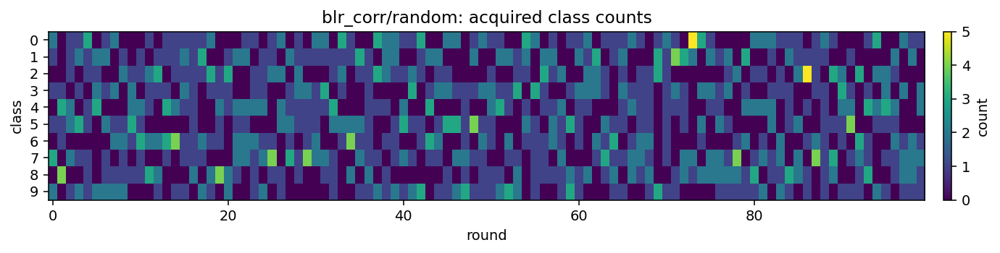

r=000 new=[2, 1, 0, 0, 2, 0, 1, 1, 0, 3] cum=[2, 1, 0, 0, 2, 0, 1, 1, 0, 3]
r=010 new=[0, 0, 2, 1, 1, 0, 1, 3, 1, 1] cum=[12, 8, 6, 9, 10, 13, 15, 15, 7, 15]
r=020 new=[1, 0, 3, 1, 0, 0, 3, 0, 2, 0] cum=[18, 14, 18, 20, 24, 23, 28, 23, 16, 26]
r=030 new=[2, 0, 0, 2, 1, 2, 1, 0, 0, 2] cum=[29, 30, 28, 28, 29, 33, 37, 30, 24, 42]
r=040 new=[0, 2, 0, 1, 0, 1, 1, 3, 1, 1] cum=[36, 41, 37, 39, 40, 43, 50, 42, 31, 51]
r=050 new=[1, 2, 1, 2, 1, 0, 0, 1, 1, 1] cum=[40, 55, 46, 50, 48, 50, 61, 53, 45, 62]
r=060 new=[0, 1, 2, 1, 0, 1, 3, 2, 0, 0] cum=[48, 64, 56, 62, 56, 56, 80, 65, 52, 71]
r=070 new=[1, 1, 1, 1, 0, 1, 1, 2, 1, 1] cum=[53, 73, 65, 73, 72, 66, 88, 77, 64, 79]
r=080 new=[1, 1, 0, 1, 1, 0, 2, 0, 2, 2] cum=[62, 88, 76, 83, 85, 70, 98, 87, 72, 89]
r=090 new=[0, 3, 0, 1, 1, 1, 1, 0, 0, 3] cum=[69, 102, 85, 93, 95, 78, 112, 98, 77, 101]


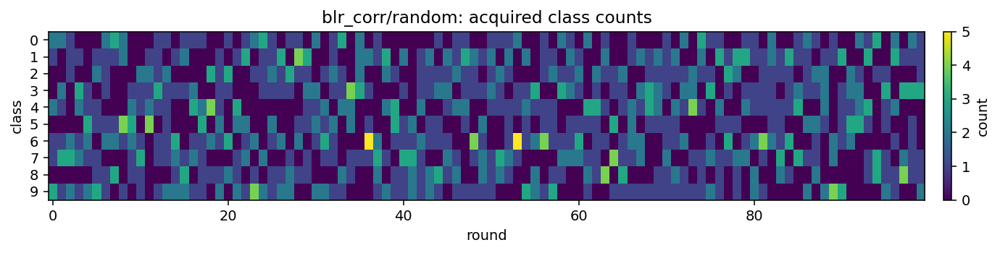

[acq dbg] r=000 blr_corr std=15.1 q10=11 q50=30 q90=49.9 min=0.876 max=86.7 p90/p10=4.54 uniq~=2000/2000
r=000 new=[1, 0, 2, 2, 0, 2, 1, 0, 0, 2] cum=[1, 0, 2, 2, 0, 2, 1, 0, 0, 2]
[acq dbg] r=005 blr_corr std=1.64 q10=0.921 q50=2.33 q90=4.86 min=0.133 max=12.5 p90/p10=5.28 uniq~=2000/2000
[acq dbg] r=010 blr_corr std=0.0645 q10=0.0577 q50=0.109 q90=0.212 min=0.0253 max=0.635 p90/p10=3.67 uniq~=2000/2000
r=010 new=[0, 1, 1, 1, 0, 3, 0, 0, 3, 1] cum=[11, 4, 11, 13, 11, 16, 7, 12, 13, 12]
[acq dbg] r=015 blr_corr std=2.95 q10=0.0372 q50=0.0613 q90=0.119 min=0.0176 max=78.2 p90/p10=3.2 uniq~=2000/2000
[acq dbg] r=020 blr_corr std=0.0155 q10=0.0191 q50=0.033 q90=0.0554 min=0.0112 max=0.14 p90/p10=2.9 uniq~=2000/2000
r=020 new=[2, 0, 1, 3, 1, 0, 1, 1, 1, 0] cum=[23, 5, 32, 25, 24, 24, 13, 19, 25, 20]
[acq dbg] r=025 blr_corr std=0.0237 q10=0.0218 q50=0.0374 q90=0.0768 min=0.0124 max=0.212 p90/p10=3.52 uniq~=2000/2000
[acq dbg] r=030 blr_corr std=0.0117 q10=0.0124 q50=0.0212 q90=0.0386 min=0

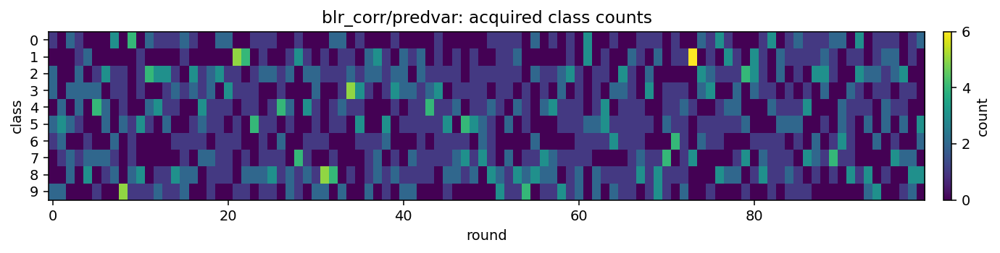

[acq dbg] r=000 blr_corr std=8.49 q10=7.49 q50=17.2 q90=29.4 min=0.982 max=49.4 p90/p10=3.93 uniq~=2000/2000
r=000 new=[4, 0, 0, 0, 1, 3, 2, 0, 0, 0] cum=[4, 0, 0, 0, 1, 3, 2, 0, 0, 0]
[acq dbg] r=005 blr_corr std=0.125 q10=0.0865 q50=0.192 q90=0.383 min=0.0257 max=1.04 p90/p10=4.42 uniq~=2000/2000
[acq dbg] r=010 blr_corr std=0.0875 q10=0.0683 q50=0.149 q90=0.28 min=0.0198 max=0.609 p90/p10=4.11 uniq~=2000/2000
r=010 new=[0, 0, 2, 0, 1, 1, 0, 2, 3, 1] cum=[13, 9, 14, 12, 12, 19, 10, 6, 10, 5]
[acq dbg] r=015 blr_corr std=0.0537 q10=0.0441 q50=0.0849 q90=0.169 min=0.0237 max=0.432 p90/p10=3.83 uniq~=2000/2000
[acq dbg] r=020 blr_corr std=0.0486 q10=0.021 q50=0.036 q90=0.0656 min=0.0118 max=2.02 p90/p10=3.12 uniq~=2000/2000
r=020 new=[0, 0, 2, 1, 0, 2, 0, 1, 4, 0] cum=[18, 13, 33, 25, 19, 27, 15, 16, 27, 17]
[acq dbg] r=025 blr_corr std=0.0109 q10=0.0131 q50=0.021 q90=0.0386 min=0.007 max=0.0937 p90/p10=2.94 uniq~=2000/2000
[acq dbg] r=030 blr_corr std=0.017 q10=0.0126 q50=0.0232 q90=0.

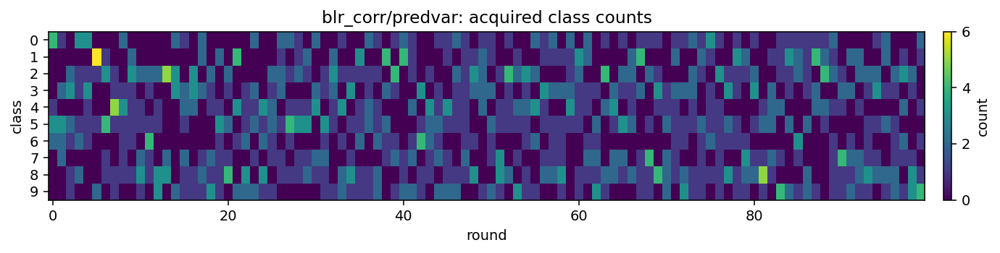

[acq dbg] r=000 blr_corr std=15.7 q10=10.7 q50=30.9 q90=52.5 min=0.582 max=83 p90/p10=4.92 uniq~=2000/2000
r=000 new=[0, 4, 3, 0, 1, 1, 0, 0, 1, 0] cum=[0, 4, 3, 0, 1, 1, 0, 0, 1, 0]
[acq dbg] r=005 blr_corr std=0.219 q10=0.0803 q50=0.294 q90=0.62 min=0.0156 max=1.42 p90/p10=7.72 uniq~=2000/2000
[acq dbg] r=010 blr_corr std=0.0696 q10=0.0757 q50=0.135 q90=0.236 min=0.0321 max=0.719 p90/p10=3.12 uniq~=2000/2000
r=010 new=[0, 1, 1, 3, 1, 0, 1, 0, 3, 0] cum=[8, 7, 19, 12, 12, 17, 6, 9, 13, 7]
[acq dbg] r=015 blr_corr std=0.0431 q10=0.0316 q50=0.0624 q90=0.13 min=0.015 max=0.349 p90/p10=4.11 uniq~=2000/2000
[acq dbg] r=020 blr_corr std=0.0228 q10=0.0246 q50=0.0411 q90=0.076 min=0.0108 max=0.267 p90/p10=3.09 uniq~=2000/2000
r=020 new=[0, 1, 3, 2, 1, 3, 0, 0, 0, 0] cum=[14, 11, 37, 26, 22, 27, 12, 15, 31, 15]
[acq dbg] r=025 blr_corr std=0.014 q10=0.0149 q50=0.0255 q90=0.0472 min=0.00508 max=0.122 p90/p10=3.16 uniq~=2000/2000
[acq dbg] r=030 blr_corr std=0.0129 q10=0.0107 q50=0.0196 q90=0.04

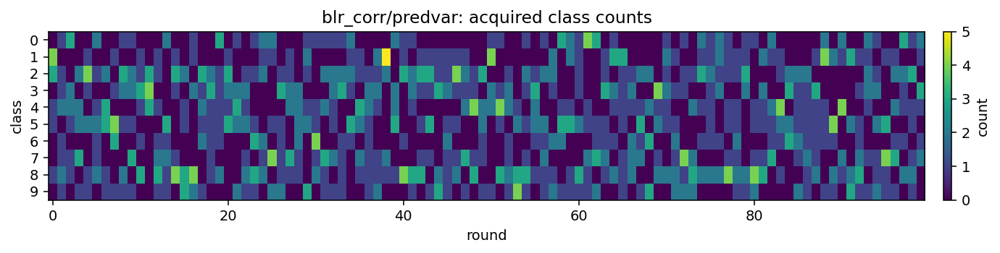

[acq dbg] r=000 blr_corr std=15 q10=10.9 q50=29.5 q90=49.2 min=0.834 max=85.3 p90/p10=4.49 uniq~=2000/2000
r=000 new=[0, 1, 1, 2, 1, 3, 2, 0, 0, 0] cum=[0, 1, 1, 2, 1, 3, 2, 0, 0, 0]
[acq dbg] r=005 blr_corr std=6.41 q10=3.45 q50=9.58 q90=19.6 min=0.232 max=40.7 p90/p10=5.67 uniq~=2000/2000
[acq dbg] r=010 blr_corr std=0.0533 q10=0.0599 q50=0.109 q90=0.19 min=0.0252 max=0.402 p90/p10=3.16 uniq~=2000/2000
r=010 new=[1, 0, 2, 2, 0, 1, 0, 1, 0, 3] cum=[11, 3, 16, 11, 10, 14, 12, 9, 14, 10]
[acq dbg] r=015 blr_corr std=0.0275 q10=0.0269 q50=0.0495 q90=0.0887 min=0.0116 max=0.284 p90/p10=3.3 uniq~=2000/2000
[acq dbg] r=020 blr_corr std=0.0164 q10=0.0216 q50=0.037 q90=0.0615 min=0.0071 max=0.131 p90/p10=2.85 uniq~=2000/2000
r=020 new=[1, 0, 1, 1, 1, 3, 1, 1, 1, 0] cum=[16, 5, 33, 26, 20, 32, 18, 18, 26, 16]
[acq dbg] r=025 blr_corr std=0.0202 q10=0.0253 q50=0.0417 q90=0.0732 min=0.0131 max=0.156 p90/p10=2.89 uniq~=2000/2000
[acq dbg] r=030 blr_corr std=0.00807 q10=0.0105 q50=0.017 q90=0.0289

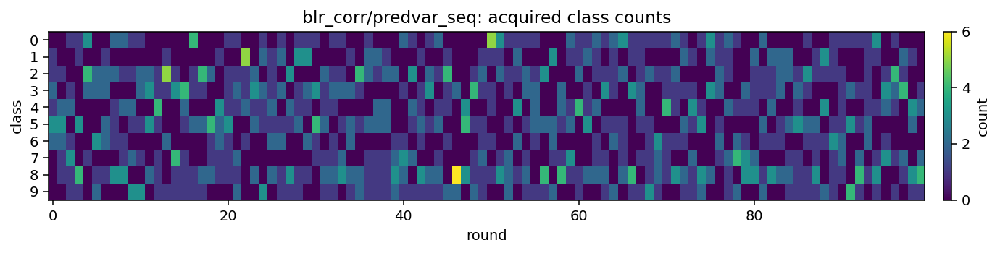

[acq dbg] r=000 blr_corr std=4.98 q10=4.4 q50=10.1 q90=17.2 min=0.603 max=28.9 p90/p10=3.91 uniq~=2000/2000
r=000 new=[1, 0, 1, 2, 1, 4, 1, 0, 0, 0] cum=[1, 0, 1, 2, 1, 4, 1, 0, 0, 0]
[acq dbg] r=005 blr_corr std=0.137 q10=0.0957 q50=0.198 q90=0.406 min=0.0324 max=1.35 p90/p10=4.24 uniq~=2000/2000
[acq dbg] r=010 blr_corr std=0.0615 q10=0.0788 q50=0.134 q90=0.225 min=0.0382 max=0.62 p90/p10=2.86 uniq~=2000/2000
r=010 new=[2, 1, 1, 0, 4, 1, 0, 0, 1, 0] cum=[8, 4, 15, 12, 13, 20, 10, 7, 14, 7]
[acq dbg] r=015 blr_corr std=0.0332 q10=0.0459 q50=0.0759 q90=0.127 min=0.0242 max=0.352 p90/p10=2.76 uniq~=2000/2000
[acq dbg] r=020 blr_corr std=0.0169 q10=0.0294 q50=0.0434 q90=0.0675 min=0.0128 max=0.156 p90/p10=2.29 uniq~=2000/2000
r=020 new=[3, 1, 1, 1, 0, 0, 0, 1, 1, 2] cum=[17, 12, 29, 24, 20, 26, 18, 13, 33, 18]
[acq dbg] r=025 blr_corr std=0.106 q10=0.0103 q50=0.0158 q90=0.0267 min=0.0054 max=2.98 p90/p10=2.6 uniq~=2000/2000
[acq dbg] r=030 blr_corr std=0.0132 q10=0.0158 q50=0.0267 q90=0.

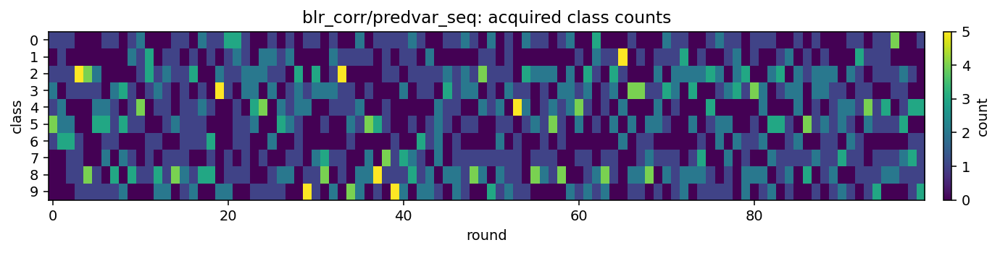

[acq dbg] r=000 blr_corr std=15.7 q10=10.6 q50=30.8 q90=52.5 min=0.583 max=83 p90/p10=4.93 uniq~=2000/2000
r=000 new=[1, 1, 1, 1, 0, 2, 0, 0, 2, 2] cum=[1, 1, 1, 1, 0, 2, 0, 0, 2, 2]
[acq dbg] r=005 blr_corr std=3.54 q10=1.34 q50=4.03 q90=9.63 min=0.207 max=27.7 p90/p10=7.2 uniq~=2000/2000
[acq dbg] r=010 blr_corr std=0.151 q10=0.0841 q50=0.166 q90=0.322 min=0.0334 max=4 p90/p10=3.83 uniq~=2000/2000
r=010 new=[0, 5, 1, 0, 1, 0, 0, 1, 1, 1] cum=[6, 9, 15, 12, 17, 13, 7, 7, 14, 10]
[acq dbg] r=015 blr_corr std=0.44 q10=0.0304 q50=0.0527 q90=0.0954 min=0.0152 max=15.6 p90/p10=3.14 uniq~=2000/2000
[acq dbg] r=020 blr_corr std=0.049 q10=0.0167 q50=0.0261 q90=0.0458 min=0.00929 max=1.22 p90/p10=2.74 uniq~=2000/2000
r=020 new=[0, 1, 1, 1, 1, 0, 0, 2, 1, 3] cum=[14, 15, 31, 26, 28, 21, 12, 17, 28, 18]
[acq dbg] r=025 blr_corr std=0.0118 q10=0.0124 q50=0.0205 q90=0.0375 min=0.00726 max=0.152 p90/p10=3.03 uniq~=2000/2000
[acq dbg] r=030 blr_corr std=0.0142 q10=0.0153 q50=0.0273 q90=0.0498 min=0.

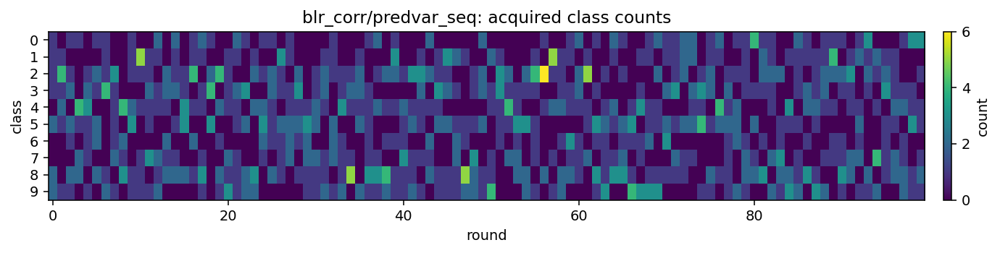

[acq dbg] r=000 blr_corr std=15.1 q10=11 q50=30 q90=49.9 min=0.871 max=86.8 p90/p10=4.53 uniq~=2000/2000
r=000 new=[0, 1, 1, 2, 2, 2, 2, 0, 0, 0] cum=[0, 1, 1, 2, 2, 2, 2, 0, 0, 0]
[acq dbg] r=005 blr_corr std=4.62 q10=2.54 q50=6.27 q90=13.3 min=0.386 max=33.8 p90/p10=5.21 uniq~=2000/2000
[acq dbg] r=010 blr_corr std=0.265 q10=0.0824 q50=0.158 q90=0.298 min=0.0294 max=4.61 p90/p10=3.62 uniq~=2000/2000
r=010 new=[0, 1, 4, 2, 0, 0, 0, 1, 1, 1] cum=[16, 6, 14, 13, 10, 15, 9, 8, 10, 9]
[acq dbg] r=015 blr_corr std=0.104 q10=0.0315 q50=0.0574 q90=0.109 min=0.0145 max=4.29 p90/p10=3.46 uniq~=2000/2000
[acq dbg] r=020 blr_corr std=0.0133 q10=0.0182 q50=0.0301 q90=0.0482 min=0.0106 max=0.149 p90/p10=2.65 uniq~=2000/2000
r=020 new=[0, 0, 1, 1, 0, 3, 0, 2, 3, 0] cum=[24, 12, 31, 25, 22, 27, 12, 18, 25, 14]
[acq dbg] r=025 blr_corr std=38.1 q10=0.0212 q50=0.0359 q90=0.0619 min=0.0111 max=1.7e+03 p90/p10=2.91 uniq~=2000/2000
[acq dbg] r=030 blr_corr std=12.3 q10=0.0111 q50=0.0171 q90=0.0289 min=0.

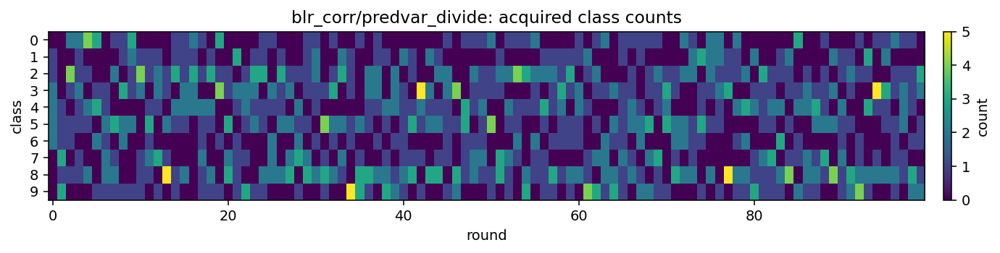

[acq dbg] r=000 blr_corr std=14.5 q10=12.8 q50=29.5 q90=50.2 min=1.71 max=84.3 p90/p10=3.92 uniq~=2000/2000
r=000 new=[1, 0, 1, 3, 0, 2, 1, 2, 0, 0] cum=[1, 0, 1, 3, 0, 2, 1, 2, 0, 0]
[acq dbg] r=005 blr_corr std=0.181 q10=0.125 q50=0.275 q90=0.56 min=0.0443 max=1.6 p90/p10=4.47 uniq~=2000/2000
[acq dbg] r=010 blr_corr std=0.0726 q10=0.0677 q50=0.135 q90=0.245 min=0.0293 max=0.655 p90/p10=3.62 uniq~=2000/2000
r=010 new=[2, 0, 1, 0, 0, 1, 0, 4, 0, 2] cum=[11, 6, 16, 15, 13, 11, 8, 11, 8, 11]
[acq dbg] r=015 blr_corr std=0.0454 q10=0.054 q50=0.0902 q90=0.158 min=0.0263 max=0.388 p90/p10=2.93 uniq~=2000/2000
[acq dbg] r=020 blr_corr std=0.00847 q10=0.0138 q50=0.0206 q90=0.0332 min=0.00745 max=0.0906 p90/p10=2.41 uniq~=2000/2000
r=020 new=[1, 0, 0, 2, 2, 2, 1, 1, 1, 0] cum=[20, 10, 34, 25, 22, 24, 14, 17, 27, 17]
[acq dbg] r=025 blr_corr std=0.00812 q10=0.0133 q50=0.0206 q90=0.0327 min=0.00652 max=0.0684 p90/p10=2.46 uniq~=2000/2000
[acq dbg] r=030 blr_corr std=0.0111 q10=0.014 q50=0.0224 

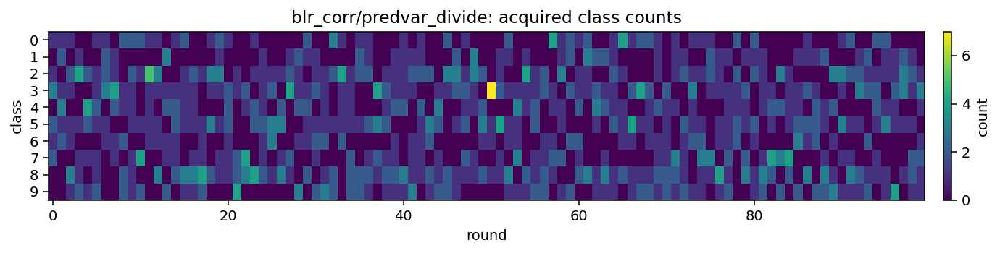

[acq dbg] r=000 blr_corr std=15.7 q10=10.7 q50=30.9 q90=52.4 min=0.578 max=81.8 p90/p10=4.91 uniq~=2000/2000
r=000 new=[1, 2, 1, 0, 0, 3, 0, 0, 1, 2] cum=[1, 2, 1, 0, 0, 3, 0, 0, 1, 2]
[acq dbg] r=005 blr_corr std=1.82 q10=0.437 q50=1.54 q90=4.4 min=0.0258 max=16.4 p90/p10=10.1 uniq~=2000/2000
[acq dbg] r=010 blr_corr std=0.31 q10=0.0633 q50=0.108 q90=0.183 min=0.0344 max=6.69 p90/p10=2.88 uniq~=2000/2000
r=010 new=[4, 1, 2, 0, 0, 0, 1, 1, 1, 0] cum=[11, 6, 18, 12, 13, 11, 8, 9, 13, 9]
[acq dbg] r=015 blr_corr std=0.0443 q10=0.0501 q50=0.0883 q90=0.157 min=0.0193 max=0.395 p90/p10=3.12 uniq~=2000/2000
[acq dbg] r=020 blr_corr std=0.342 q10=0.0203 q50=0.0314 q90=0.0531 min=0.0113 max=15.3 p90/p10=2.61 uniq~=2000/2000
r=020 new=[1, 0, 3, 1, 0, 2, 1, 0, 1, 1] cum=[17, 11, 30, 26, 23, 32, 16, 18, 22, 15]
[acq dbg] r=025 blr_corr std=15.1 q10=0.0116 q50=0.0186 q90=0.0311 min=0.00702 max=677 p90/p10=2.68 uniq~=2000/2000
[acq dbg] r=030 blr_corr std=0.0135 q10=0.0156 q50=0.0261 q90=0.0478 min

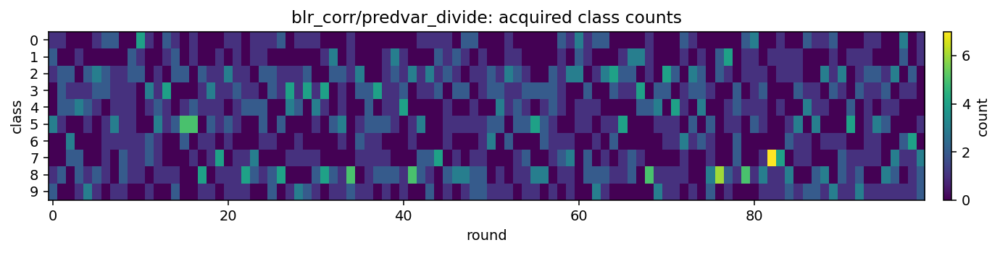

r=000 new=[0, 1, 0, 2, 2, 2, 1, 1, 1, 0] cum=[0, 1, 0, 2, 2, 2, 1, 1, 1, 0]
r=010 new=[1, 1, 0, 1, 0, 2, 0, 1, 2, 2] cum=[12, 4, 13, 15, 9, 15, 6, 9, 19, 8]
r=020 new=[1, 2, 2, 0, 1, 0, 0, 0, 4, 0] cum=[20, 8, 28, 24, 22, 31, 11, 15, 32, 19]
r=030 new=[1, 0, 1, 1, 1, 2, 0, 3, 0, 1] cum=[26, 15, 44, 38, 31, 35, 22, 25, 42, 32]
r=040 new=[1, 1, 2, 2, 0, 0, 0, 2, 1, 1] cum=[32, 19, 58, 48, 42, 47, 25, 33, 66, 40]
r=050 new=[0, 4, 1, 0, 1, 1, 0, 1, 2, 0] cum=[40, 26, 70, 63, 54, 62, 28, 41, 82, 44]
r=060 new=[0, 1, 4, 3, 0, 2, 0, 0, 0, 0] cum=[42, 36, 88, 78, 62, 71, 34, 46, 98, 55]
r=070 new=[1, 0, 0, 1, 0, 1, 1, 3, 2, 1] cum=[47, 40, 94, 91, 72, 82, 41, 56, 117, 70]
r=080 new=[2, 0, 3, 0, 0, 1, 1, 1, 2, 0] cum=[54, 44, 117, 102, 78, 97, 48, 60, 132, 78]
r=090 new=[0, 0, 1, 1, 0, 1, 0, 0, 5, 2] cum=[59, 53, 127, 110, 88, 103, 56, 72, 150, 92]


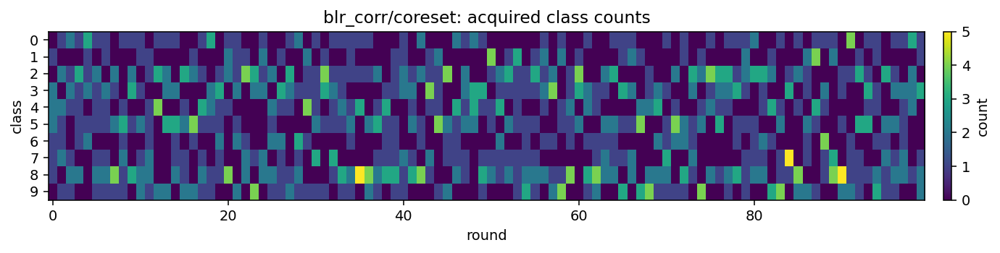

r=000 new=[0, 0, 0, 2, 2, 1, 2, 1, 1, 1] cum=[0, 0, 0, 2, 2, 1, 2, 1, 1, 1]
r=010 new=[1, 0, 1, 0, 1, 2, 1, 1, 3, 0] cum=[9, 3, 17, 12, 8, 16, 14, 6, 16, 9]
r=020 new=[0, 1, 0, 0, 1, 3, 0, 1, 2, 2] cum=[16, 8, 30, 23, 19, 27, 20, 17, 29, 21]
r=030 new=[0, 0, 3, 1, 3, 0, 0, 1, 1, 1] cum=[22, 12, 41, 31, 36, 33, 25, 37, 39, 34]
r=040 new=[0, 0, 0, 0, 0, 4, 0, 1, 3, 2] cum=[31, 16, 54, 47, 47, 45, 28, 42, 57, 43]
r=050 new=[0, 0, 2, 2, 1, 2, 0, 0, 2, 1] cum=[36, 21, 66, 63, 50, 56, 35, 53, 81, 49]
r=060 new=[0, 4, 1, 1, 1, 0, 0, 2, 1, 0] cum=[41, 29, 82, 80, 59, 62, 36, 65, 97, 59]
r=070 new=[4, 0, 0, 2, 3, 0, 0, 0, 0, 1] cum=[50, 38, 92, 95, 72, 73, 38, 71, 110, 71]
r=080 new=[0, 0, 4, 1, 0, 1, 0, 0, 2, 2] cum=[55, 43, 108, 109, 77, 86, 43, 76, 126, 87]
r=090 new=[0, 2, 2, 0, 0, 1, 2, 0, 3, 0] cum=[63, 49, 116, 118, 82, 96, 55, 85, 148, 98]


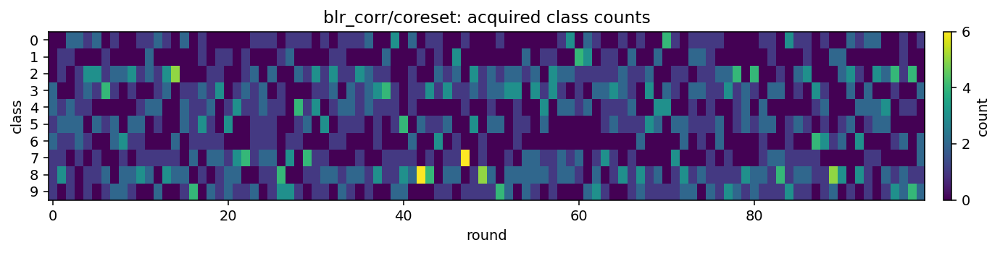

r=000 new=[0, 0, 3, 1, 2, 2, 0, 0, 2, 0] cum=[0, 0, 3, 1, 2, 2, 0, 0, 2, 0]
r=010 new=[0, 0, 1, 3, 2, 0, 1, 0, 1, 2] cum=[9, 4, 19, 18, 9, 13, 7, 6, 15, 10]
r=020 new=[1, 1, 1, 2, 2, 1, 0, 0, 1, 1] cum=[15, 9, 33, 30, 26, 24, 13, 18, 26, 16]
r=030 new=[0, 1, 0, 2, 2, 1, 1, 0, 0, 3] cum=[21, 12, 51, 43, 37, 31, 16, 30, 41, 28]
r=040 new=[2, 1, 0, 0, 0, 5, 1, 0, 1, 0] cum=[24, 17, 60, 52, 43, 49, 24, 39, 61, 41]
r=050 new=[1, 1, 0, 0, 0, 1, 1, 1, 2, 3] cum=[29, 23, 73, 68, 52, 59, 28, 52, 77, 49]
r=060 new=[2, 2, 2, 1, 0, 0, 0, 2, 1, 0] cum=[40, 28, 89, 76, 62, 63, 31, 62, 97, 62]
r=070 new=[1, 1, 1, 1, 2, 0, 2, 1, 0, 1] cum=[51, 35, 102, 88, 74, 73, 36, 72, 109, 70]
r=080 new=[0, 1, 0, 0, 1, 1, 2, 1, 4, 0] cum=[57, 39, 113, 101, 86, 85, 43, 84, 123, 79]
r=090 new=[0, 1, 3, 0, 2, 1, 0, 1, 2, 0] cum=[60, 49, 126, 111, 95, 94, 48, 92, 142, 93]


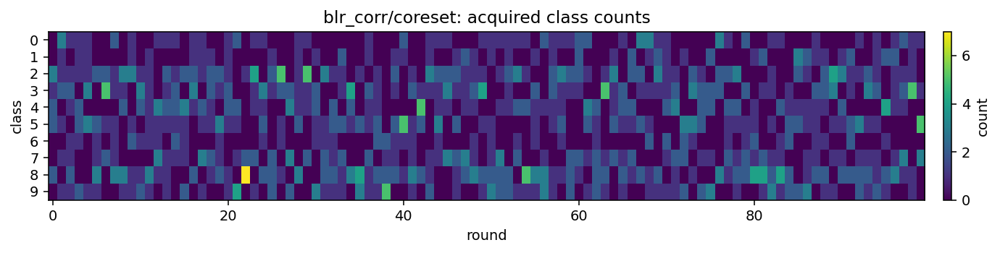

r=000 new=[1, 1, 0, 0, 2, 1, 2, 1, 0, 2] cum=[1, 1, 0, 0, 2, 1, 2, 1, 0, 2]
r=010 new=[2, 0, 2, 0, 1, 2, 0, 2, 1, 0] cum=[12, 11, 7, 3, 16, 12, 12, 18, 5, 14]
r=020 new=[2, 1, 1, 0, 2, 1, 0, 0, 3, 0] cum=[26, 23, 16, 11, 29, 19, 21, 26, 16, 23]
r=030 new=[1, 0, 1, 1, 1, 1, 3, 1, 0, 1] cum=[36, 35, 26, 16, 38, 29, 32, 35, 27, 36]
r=040 new=[0, 2, 0, 0, 1, 1, 3, 0, 1, 2] cum=[41, 46, 36, 27, 50, 38, 41, 47, 37, 47]
r=050 new=[0, 2, 1, 1, 1, 0, 1, 0, 3, 1] cum=[48, 61, 45, 34, 56, 46, 54, 57, 52, 57]
r=060 new=[0, 2, 2, 1, 1, 2, 0, 1, 0, 1] cum=[55, 65, 56, 47, 71, 57, 60, 70, 62, 67]
r=070 new=[1, 2, 0, 0, 1, 1, 1, 0, 1, 3] cum=[67, 76, 64, 56, 85, 65, 69, 79, 73, 76]
r=080 new=[1, 0, 0, 0, 3, 1, 1, 2, 1, 1] cum=[80, 85, 77, 60, 94, 74, 81, 87, 89, 83]
r=090 new=[1, 0, 1, 3, 1, 2, 1, 0, 1, 0] cum=[91, 93, 83, 71, 105, 87, 94, 95, 100, 91]


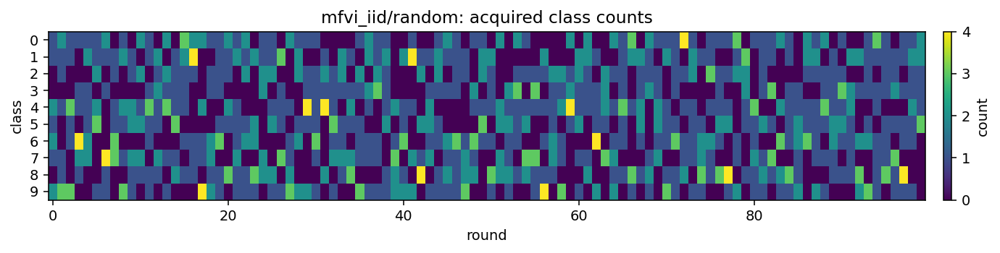

r=000 new=[2, 1, 0, 1, 0, 1, 0, 3, 0, 2] cum=[2, 1, 0, 1, 0, 1, 0, 3, 0, 2]
r=010 new=[0, 1, 1, 0, 2, 1, 3, 1, 1, 0] cum=[10, 11, 7, 10, 13, 16, 9, 10, 10, 14]
r=020 new=[0, 1, 3, 1, 1, 0, 0, 0, 2, 2] cum=[18, 21, 23, 19, 24, 18, 26, 14, 25, 22]
r=030 new=[2, 1, 0, 1, 1, 1, 2, 2, 0, 0] cum=[26, 32, 31, 27, 38, 27, 38, 35, 30, 26]
r=040 new=[1, 0, 1, 0, 2, 3, 0, 2, 0, 1] cum=[40, 44, 43, 32, 47, 40, 47, 45, 37, 35]
r=050 new=[1, 0, 1, 2, 2, 1, 1, 0, 1, 1] cum=[52, 51, 49, 47, 53, 56, 57, 54, 41, 50]
r=060 new=[1, 2, 0, 2, 1, 1, 1, 0, 1, 1] cum=[61, 64, 57, 59, 63, 66, 66, 60, 51, 63]
r=070 new=[2, 1, 1, 1, 1, 1, 1, 1, 0, 1] cum=[72, 75, 69, 70, 70, 73, 78, 72, 61, 70]
r=080 new=[2, 0, 1, 0, 2, 0, 0, 1, 3, 1] cum=[84, 92, 73, 81, 78, 79, 82, 86, 79, 76]
r=090 new=[0, 0, 2, 3, 2, 1, 1, 0, 0, 1] cum=[95, 99, 88, 89, 87, 87, 90, 101, 90, 84]


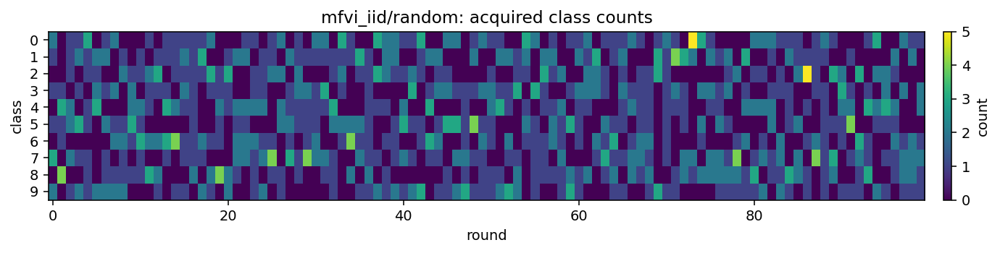

r=000 new=[2, 1, 0, 0, 2, 0, 1, 1, 0, 3] cum=[2, 1, 0, 0, 2, 0, 1, 1, 0, 3]
r=010 new=[0, 0, 2, 1, 1, 0, 1, 3, 1, 1] cum=[12, 8, 6, 9, 10, 13, 15, 15, 7, 15]
r=020 new=[1, 0, 3, 1, 0, 0, 3, 0, 2, 0] cum=[18, 14, 18, 20, 24, 23, 28, 23, 16, 26]
r=030 new=[2, 0, 0, 2, 1, 2, 1, 0, 0, 2] cum=[29, 30, 28, 28, 29, 33, 37, 30, 24, 42]
r=040 new=[0, 2, 0, 1, 0, 1, 1, 3, 1, 1] cum=[36, 41, 37, 39, 40, 43, 50, 42, 31, 51]
r=050 new=[1, 2, 1, 2, 1, 0, 0, 1, 1, 1] cum=[40, 55, 46, 50, 48, 50, 61, 53, 45, 62]
r=060 new=[0, 1, 2, 1, 0, 1, 3, 2, 0, 0] cum=[48, 64, 56, 62, 56, 56, 80, 65, 52, 71]
r=070 new=[1, 1, 1, 1, 0, 1, 1, 2, 1, 1] cum=[53, 73, 65, 73, 72, 66, 88, 77, 64, 79]
r=080 new=[1, 1, 0, 1, 1, 0, 2, 0, 2, 2] cum=[62, 88, 76, 83, 85, 70, 98, 87, 72, 89]
r=090 new=[0, 3, 0, 1, 1, 1, 1, 0, 0, 3] cum=[69, 102, 85, 93, 95, 78, 112, 98, 77, 101]


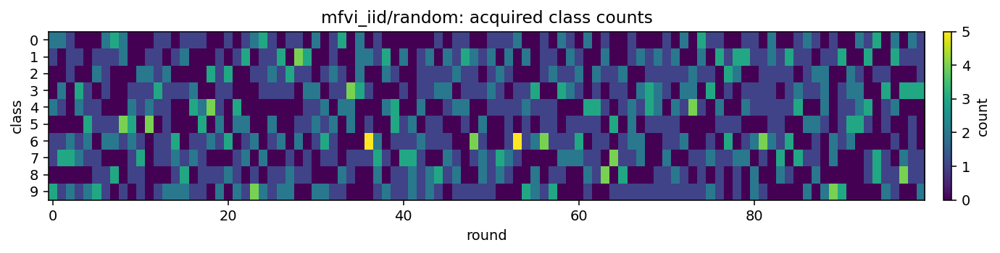

[acq dbg] r=000 mfvi_iid std=1.17 q10=46 q50=47.6 q90=49.1 min=43.6 max=50.8 p90/p10=1.07 uniq~=2000/2000
r=000 new=[0, 0, 1, 0, 1, 0, 4, 4, 0, 0] cum=[0, 0, 1, 0, 1, 0, 4, 4, 0, 0]
[acq dbg] r=005 mfvi_iid std=8.06 q10=85 q50=94.9 q90=106 min=73.4 max=118 p90/p10=1.25 uniq~=2000/2000
[acq dbg] r=010 mfvi_iid std=0.88 q10=3.59 q50=4.57 q90=5.95 min=2.75 max=7.87 p90/p10=1.66 uniq~=2000/2000
r=010 new=[0, 8, 0, 0, 0, 1, 0, 1, 0, 0] cum=[5, 28, 15, 12, 5, 5, 10, 17, 5, 8]
[acq dbg] r=015 mfvi_iid std=0.000869 q10=0.0069 q50=0.00796 q90=0.00911 min=0.00564 max=0.0111 p90/p10=1.32 uniq~=2000/2000
[acq dbg] r=020 mfvi_iid std=0.00096 q10=0.00431 q50=0.00589 q90=0.00678 min=0.00279 max=0.00883 p90/p10=1.57 uniq~=1999/2000
r=020 new=[2, 2, 1, 0, 0, 1, 1, 0, 3, 0] cum=[20, 50, 20, 17, 10, 15, 18, 28, 21, 11]
[acq dbg] r=025 mfvi_iid std=0.000629 q10=0.00384 q50=0.00477 q90=0.0055 min=0.00304 max=0.00717 p90/p10=1.43 uniq~=2000/2000
[acq dbg] r=030 mfvi_iid std=0.000578 q10=0.00324 q50=0.004 q9

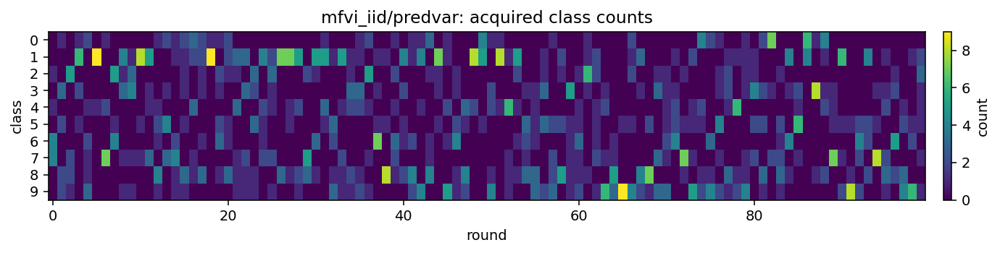

[acq dbg] r=000 mfvi_iid std=1.72 q10=45.1 q50=48 q90=49.5 min=40.7 max=51.1 p90/p10=1.1 uniq~=2000/2000
r=000 new=[0, 3, 0, 3, 0, 2, 0, 1, 0, 1] cum=[0, 3, 0, 3, 0, 2, 0, 1, 0, 1]
[acq dbg] r=005 mfvi_iid std=5.94 q10=56.6 q50=63.8 q90=71.6 min=48.3 max=84.7 p90/p10=1.27 uniq~=2000/2000
[acq dbg] r=010 mfvi_iid std=0.392 q10=3.73 q50=4.21 q90=4.74 min=3.02 max=5.99 p90/p10=1.27 uniq~=2000/2000
r=010 new=[0, 0, 1, 0, 1, 0, 1, 6, 0, 1] cum=[14, 12, 10, 8, 9, 6, 11, 23, 9, 8]
[acq dbg] r=015 mfvi_iid std=0.000901 q10=0.0067 q50=0.0078 q90=0.00895 min=0.00546 max=0.0134 p90/p10=1.34 uniq~=2000/2000
[acq dbg] r=020 mfvi_iid std=0.000869 q10=0.00468 q50=0.00573 q90=0.00693 min=0.00369 max=0.00882 p90/p10=1.48 uniq~=2000/2000
r=020 new=[1, 0, 1, 0, 1, 3, 0, 1, 2, 1] cum=[21, 33, 17, 11, 19, 20, 16, 35, 24, 14]
[acq dbg] r=025 mfvi_iid std=0.00144 q10=0.0049 q50=0.00645 q90=0.0087 min=0.00372 max=0.0119 p90/p10=1.78 uniq~=2000/2000
[acq dbg] r=030 mfvi_iid std=0.000515 q10=0.00345 q50=0.00411

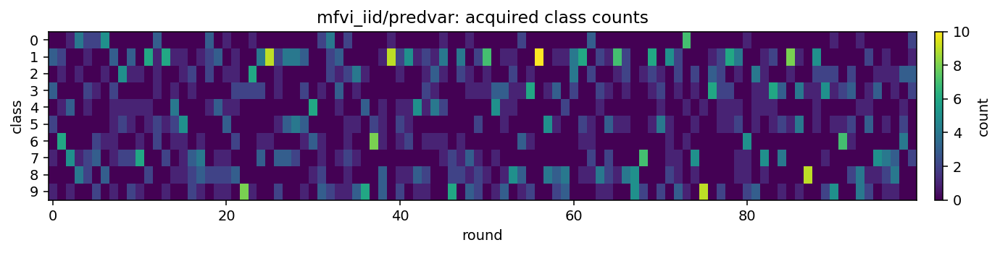

[acq dbg] r=000 mfvi_iid std=1.66 q10=44.9 q50=47.2 q90=49.5 min=42.5 max=51 p90/p10=1.1 uniq~=2000/2000
r=000 new=[0, 5, 1, 0, 0, 0, 0, 3, 1, 0] cum=[0, 5, 1, 0, 0, 0, 0, 3, 1, 0]
[acq dbg] r=005 mfvi_iid std=5.92 q10=83.6 q50=91.5 q90=99.2 min=76.5 max=112 p90/p10=1.19 uniq~=2000/2000
[acq dbg] r=010 mfvi_iid std=0.565 q10=4.51 q50=5.27 q90=5.94 min=3.62 max=7.61 p90/p10=1.32 uniq~=2000/2000
r=010 new=[0, 2, 1, 0, 0, 2, 3, 0, 2, 0] cum=[9, 24, 9, 7, 5, 12, 11, 13, 8, 12]
[acq dbg] r=015 mfvi_iid std=0.000819 q10=0.00662 q50=0.00761 q90=0.00872 min=0.00532 max=0.0106 p90/p10=1.32 uniq~=2000/2000
[acq dbg] r=020 mfvi_iid std=0.000767 q10=0.00495 q50=0.00582 q90=0.00677 min=0.00338 max=0.00887 p90/p10=1.37 uniq~=2000/2000
r=020 new=[1, 1, 0, 3, 0, 3, 1, 0, 0, 1] cum=[16, 65, 10, 14, 15, 24, 18, 15, 15, 18]
[acq dbg] r=025 mfvi_iid std=0.0008 q10=0.00353 q50=0.00446 q90=0.0056 min=0.00288 max=0.00826 p90/p10=1.59 uniq~=2000/2000
[acq dbg] r=030 mfvi_iid std=0.000418 q10=0.00356 q50=0.004

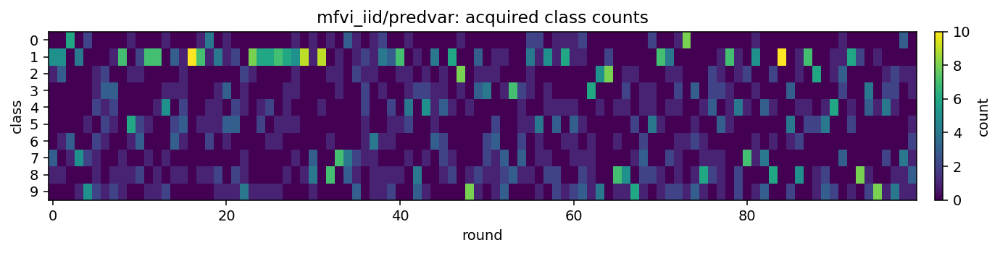

[acq dbg] r=000 mfvi_iid std=1.2 q10=45.9 q50=47.6 q90=49.1 min=43.4 max=50.8 p90/p10=1.07 uniq~=2000/2000
r=000 new=[0, 0, 0, 4, 2, 1, 3, 0, 0, 0] cum=[0, 0, 0, 4, 2, 1, 3, 0, 0, 0]
[acq dbg] r=005 mfvi_iid std=5.42 q10=82.7 q50=89 q90=97.1 min=74.5 max=107 p90/p10=1.17 uniq~=2000/2000
[acq dbg] r=010 mfvi_iid std=0.838 q10=4.39 q50=5.46 q90=6.51 min=3.42 max=9.38 p90/p10=1.48 uniq~=2000/2000
r=010 new=[0, 3, 0, 2, 0, 1, 0, 0, 2, 2] cum=[10, 8, 15, 13, 6, 16, 9, 10, 14, 9]
[acq dbg] r=015 mfvi_iid std=0.00145 q10=0.0072 q50=0.00888 q90=0.0111 min=0.00562 max=0.0143 p90/p10=1.54 uniq~=2000/2000
[acq dbg] r=020 mfvi_iid std=0.000973 q10=0.00495 q50=0.0064 q90=0.00751 min=0.00369 max=0.00959 p90/p10=1.52 uniq~=2000/2000
r=020 new=[0, 2, 0, 0, 2, 0, 1, 1, 1, 3] cum=[14, 25, 23, 23, 18, 24, 16, 16, 29, 22]
[acq dbg] r=025 mfvi_iid std=0.000563 q10=0.00407 q50=0.0047 q90=0.00551 min=0.00333 max=0.00695 p90/p10=1.35 uniq~=1999/2000
[acq dbg] r=030 mfvi_iid std=0.00123 q10=0.00412 q50=0.00555

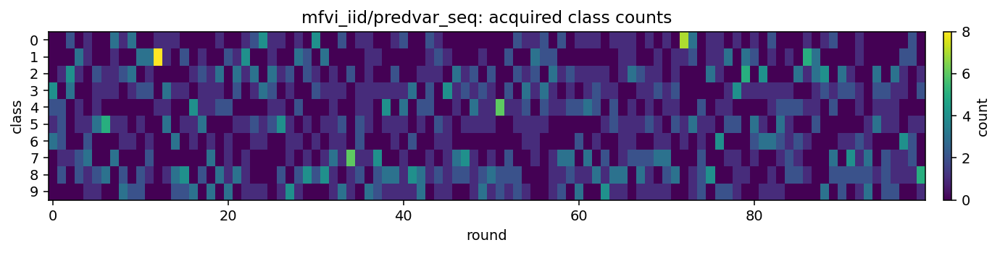

[acq dbg] r=000 mfvi_iid std=1.71 q10=45.2 q50=47.9 q90=49.5 min=40.8 max=51.1 p90/p10=1.1 uniq~=2000/2000
r=000 new=[0, 0, 0, 1, 0, 4, 4, 1, 0, 0] cum=[0, 0, 0, 1, 0, 4, 4, 1, 0, 0]
[acq dbg] r=005 mfvi_iid std=5.67 q10=55.6 q50=63 q90=69.8 min=47.9 max=84.4 p90/p10=1.26 uniq~=2000/2000
[acq dbg] r=010 mfvi_iid std=0.735 q10=4.84 q50=5.84 q90=6.71 min=3.3 max=7.81 p90/p10=1.39 uniq~=2000/2000
r=010 new=[0, 0, 1, 4, 2, 1, 0, 0, 0, 2] cum=[9, 8, 8, 11, 9, 16, 10, 11, 17, 11]
[acq dbg] r=015 mfvi_iid std=0.00123 q10=0.00623 q50=0.00768 q90=0.00965 min=0.00504 max=0.0111 p90/p10=1.55 uniq~=1999/2000
[acq dbg] r=020 mfvi_iid std=0.00115 q10=0.00644 q50=0.0077 q90=0.00935 min=0.00499 max=0.0125 p90/p10=1.45 uniq~=2000/2000
r=020 new=[0, 0, 1, 0, 3, 1, 1, 3, 1, 0] cum=[13, 16, 22, 23, 22, 28, 18, 27, 25, 16]
[acq dbg] r=025 mfvi_iid std=0.00169 q10=0.00568 q50=0.00788 q90=0.0102 min=0.00417 max=0.014 p90/p10=1.8 uniq~=1999/2000
[acq dbg] r=030 mfvi_iid std=0.000932 q10=0.00285 q50=0.00392 q9

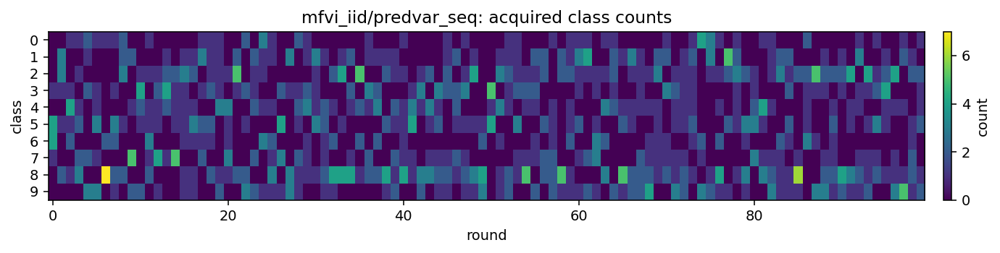

[acq dbg] r=000 mfvi_iid std=1.66 q10=45 q50=47.2 q90=49.5 min=42.5 max=51 p90/p10=1.1 uniq~=2000/2000
r=000 new=[0, 6, 0, 1, 0, 0, 1, 1, 0, 1] cum=[0, 6, 0, 1, 0, 0, 1, 1, 0, 1]
[acq dbg] r=005 mfvi_iid std=5.9 q10=84.8 q50=92.2 q90=99.9 min=73.1 max=109 p90/p10=1.18 uniq~=2000/2000
[acq dbg] r=010 mfvi_iid std=0.68 q10=4.32 q50=5.02 q90=6.09 min=3.34 max=8.23 p90/p10=1.41 uniq~=2000/2000
r=010 new=[1, 1, 1, 0, 0, 0, 1, 3, 2, 1] cum=[7, 14, 16, 16, 9, 7, 8, 14, 10, 9]
[acq dbg] r=015 mfvi_iid std=0.000978 q10=0.00633 q50=0.00756 q90=0.0089 min=0.00482 max=0.011 p90/p10=1.41 uniq~=2000/2000
[acq dbg] r=020 mfvi_iid std=0.00196 q10=0.00704 q50=0.00907 q90=0.0117 min=0.00528 max=0.0235 p90/p10=1.66 uniq~=2000/2000
r=020 new=[0, 1, 1, 1, 1, 1, 1, 0, 2, 2] cum=[13, 26, 32, 20, 19, 19, 12, 22, 31, 16]
[acq dbg] r=025 mfvi_iid std=0.00118 q10=0.00566 q50=0.00715 q90=0.00886 min=0.00324 max=0.0109 p90/p10=1.57 uniq~=2000/2000
[acq dbg] r=030 mfvi_iid std=0.000417 q10=0.00362 q50=0.00414 q90=0

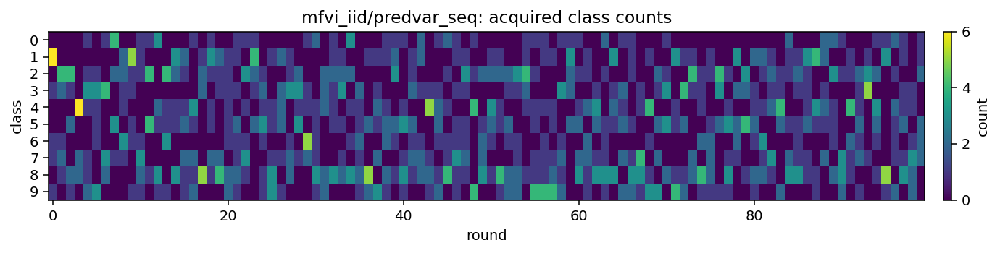

[acq dbg] r=000 mfvi_iid std=1.16 q10=46 q50=47.6 q90=49.1 min=43.6 max=50.7 p90/p10=1.07 uniq~=2000/2000
r=000 new=[0, 0, 0, 4, 1, 2, 3, 0, 0, 0] cum=[0, 0, 0, 4, 1, 2, 3, 0, 0, 0]
[acq dbg] r=005 mfvi_iid std=7 q10=90.9 q50=102 q90=108 min=72.6 max=118 p90/p10=1.19 uniq~=2000/2000
[acq dbg] r=010 mfvi_iid std=0.698 q10=4.75 q50=5.58 q90=6.6 min=4.08 max=8.12 p90/p10=1.39 uniq~=2000/2000
r=010 new=[2, 2, 0, 2, 0, 0, 1, 0, 2, 1] cum=[8, 6, 21, 19, 7, 10, 6, 12, 14, 7]
[acq dbg] r=015 mfvi_iid std=0.00204 q10=0.0104 q50=0.0127 q90=0.0156 min=0.00805 max=0.0244 p90/p10=1.5 uniq~=2000/2000
[acq dbg] r=020 mfvi_iid std=0.00138 q10=0.00805 q50=0.00996 q90=0.0117 min=0.00659 max=0.0151 p90/p10=1.45 uniq~=2000/2000
r=020 new=[0, 1, 3, 0, 2, 1, 0, 0, 3, 0] cum=[11, 16, 30, 23, 20, 20, 11, 29, 28, 22]
[acq dbg] r=025 mfvi_iid std=0.000687 q10=0.00396 q50=0.00466 q90=0.00561 min=0.00308 max=0.00837 p90/p10=1.42 uniq~=2000/2000
[acq dbg] r=030 mfvi_iid std=0.000862 q10=0.0035 q50=0.0048 q90=0.005

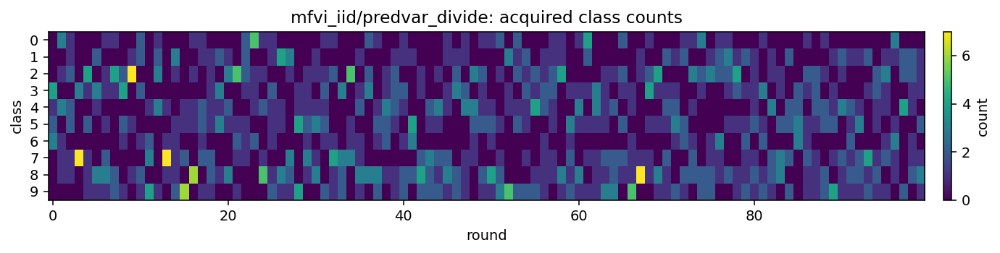

[acq dbg] r=000 mfvi_iid std=1.72 q10=45.2 q50=47.9 q90=49.5 min=40.8 max=51.1 p90/p10=1.1 uniq~=2000/2000
r=000 new=[0, 0, 0, 0, 0, 4, 4, 1, 0, 1] cum=[0, 0, 0, 0, 0, 4, 4, 1, 0, 1]
[acq dbg] r=005 mfvi_iid std=5.29 q10=48.8 q50=55.2 q90=62.5 min=41.4 max=75 p90/p10=1.28 uniq~=2000/2000
[acq dbg] r=010 mfvi_iid std=0.656 q10=4.79 q50=5.78 q90=6.48 min=3.49 max=8.31 p90/p10=1.35 uniq~=2000/2000
r=010 new=[0, 3, 0, 0, 2, 2, 0, 1, 1, 1] cum=[8, 5, 11, 8, 13, 21, 11, 12, 10, 11]
[acq dbg] r=015 mfvi_iid std=0.00186 q10=0.00985 q50=0.0123 q90=0.0147 min=0.0076 max=0.0187 p90/p10=1.5 uniq~=2000/2000
[acq dbg] r=020 mfvi_iid std=0.00342 q10=0.017 q50=0.021 q90=0.0257 min=0.0125 max=0.0364 p90/p10=1.52 uniq~=2000/2000
r=020 new=[2, 0, 0, 0, 1, 1, 0, 1, 5, 0] cum=[15, 9, 17, 23, 21, 34, 16, 21, 34, 20]
[acq dbg] r=025 mfvi_iid std=0.00244 q10=0.00738 q50=0.0102 q90=0.0137 min=0.00544 max=0.0185 p90/p10=1.85 uniq~=2000/2000
[acq dbg] r=030 mfvi_iid std=0.000977 q10=0.0032 q50=0.00404 q90=0.0058

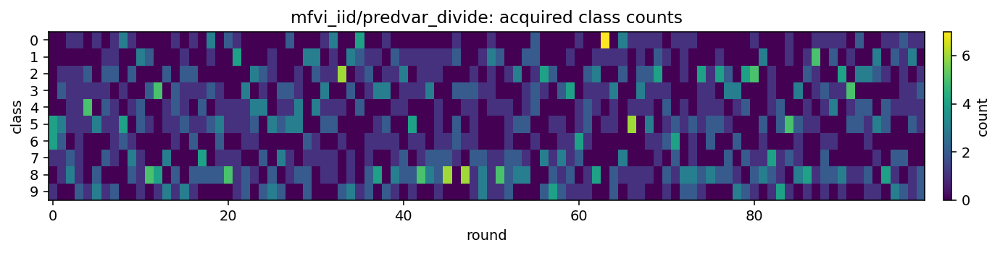

[acq dbg] r=000 mfvi_iid std=1.66 q10=45 q50=47.2 q90=49.5 min=42.5 max=51 p90/p10=1.1 uniq~=2000/2000
r=000 new=[0, 6, 0, 1, 0, 0, 1, 1, 0, 1] cum=[0, 6, 0, 1, 0, 0, 1, 1, 0, 1]
[acq dbg] r=005 mfvi_iid std=6.47 q10=82 q50=90.9 q90=98.9 min=69.8 max=109 p90/p10=1.21 uniq~=2000/2000
[acq dbg] r=010 mfvi_iid std=0.581 q10=4.13 q50=4.84 q90=5.64 min=3.17 max=7.24 p90/p10=1.37 uniq~=2000/2000
r=010 new=[1, 0, 3, 0, 2, 0, 1, 0, 3, 0] cum=[5, 10, 21, 12, 10, 13, 7, 12, 14, 6]
[acq dbg] r=015 mfvi_iid std=0.00146 q10=0.00752 q50=0.00924 q90=0.0113 min=0.00549 max=0.0156 p90/p10=1.51 uniq~=2000/2000
[acq dbg] r=020 mfvi_iid std=0.00317 q10=0.0149 q50=0.0186 q90=0.023 min=0.00903 max=0.0308 p90/p10=1.55 uniq~=2000/2000
r=020 new=[2, 1, 3, 0, 0, 1, 0, 3, 0, 0] cum=[13, 16, 30, 25, 22, 21, 14, 23, 21, 25]
[acq dbg] r=025 mfvi_iid std=0.000911 q10=0.00368 q50=0.00451 q90=0.00612 min=0.00249 max=0.0076 p90/p10=1.66 uniq~=2000/2000
[acq dbg] r=030 mfvi_iid std=0.000517 q10=0.0034 q50=0.00406 q90=0.

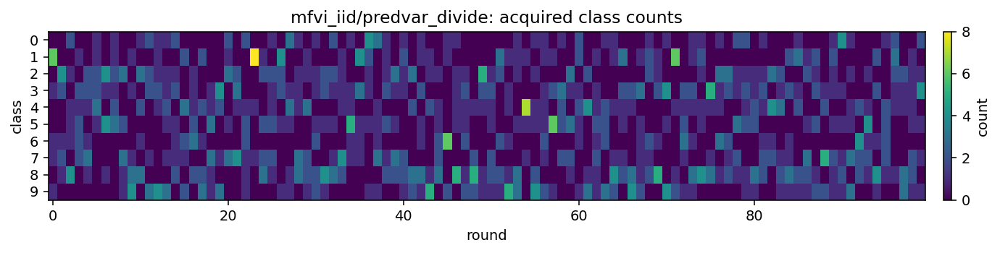

r=000 new=[0, 0, 1, 3, 0, 2, 1, 0, 2, 1] cum=[0, 0, 1, 3, 0, 2, 1, 0, 2, 1]
r=010 new=[1, 0, 1, 2, 0, 1, 1, 1, 2, 1] cum=[10, 3, 16, 19, 6, 11, 7, 10, 17, 11]
r=020 new=[1, 0, 2, 1, 0, 0, 3, 1, 2, 0] cum=[18, 7, 32, 35, 17, 21, 19, 16, 29, 16]
r=030 new=[2, 0, 1, 0, 3, 2, 1, 0, 1, 0] cum=[29, 9, 42, 42, 31, 35, 25, 25, 45, 27]
r=040 new=[0, 0, 0, 1, 2, 3, 0, 1, 1, 2] cum=[38, 15, 52, 53, 41, 45, 29, 33, 62, 42]
r=050 new=[1, 0, 2, 1, 0, 0, 1, 1, 3, 1] cum=[43, 19, 62, 67, 58, 53, 33, 47, 78, 50]
r=060 new=[0, 1, 1, 1, 2, 0, 0, 3, 2, 0] cum=[47, 26, 69, 71, 72, 66, 37, 60, 96, 66]
r=070 new=[2, 1, 0, 2, 0, 2, 0, 1, 0, 2] cum=[55, 34, 85, 82, 80, 79, 42, 70, 110, 73]
r=080 new=[2, 0, 3, 1, 1, 0, 0, 1, 2, 0] cum=[66, 37, 102, 95, 91, 87, 46, 80, 128, 78]
r=090 new=[0, 2, 2, 1, 1, 0, 0, 1, 1, 2] cum=[69, 45, 112, 100, 101, 98, 53, 91, 143, 98]


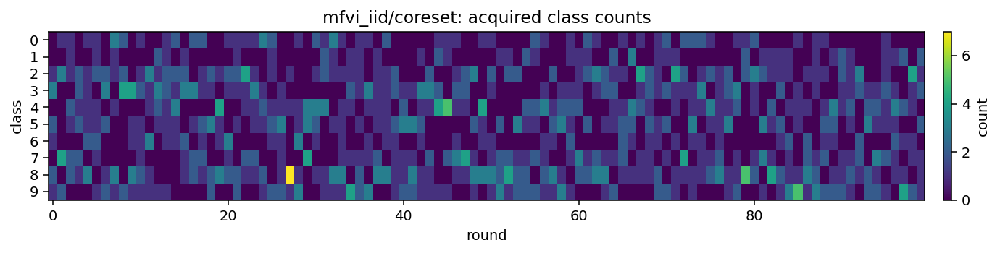

r=000 new=[1, 0, 1, 0, 2, 3, 0, 1, 2, 0] cum=[1, 0, 1, 0, 2, 3, 0, 1, 2, 0]
r=010 new=[1, 0, 1, 0, 0, 4, 1, 0, 3, 0] cum=[9, 5, 14, 10, 8, 20, 8, 6, 17, 13]
r=020 new=[0, 1, 3, 0, 1, 0, 1, 1, 1, 2] cum=[18, 7, 32, 25, 17, 31, 15, 13, 32, 20]
r=030 new=[0, 0, 1, 4, 1, 2, 0, 0, 1, 1] cum=[28, 12, 45, 44, 29, 39, 21, 23, 42, 27]
r=040 new=[0, 0, 0, 2, 1, 3, 0, 2, 1, 1] cum=[34, 15, 57, 57, 35, 58, 28, 35, 58, 33]
r=050 new=[0, 0, 0, 0, 1, 1, 1, 2, 3, 2] cum=[38, 25, 72, 66, 44, 68, 34, 47, 72, 44]
r=060 new=[2, 1, 0, 0, 0, 1, 2, 0, 1, 3] cum=[45, 30, 83, 74, 58, 77, 38, 51, 89, 65]
r=070 new=[0, 1, 2, 2, 2, 0, 0, 0, 1, 2] cum=[49, 33, 99, 85, 71, 91, 43, 62, 104, 73]
r=080 new=[0, 1, 1, 2, 2, 2, 1, 0, 1, 0] cum=[63, 41, 116, 98, 78, 100, 48, 70, 114, 82]
r=090 new=[0, 2, 0, 0, 1, 1, 1, 1, 2, 2] cum=[67, 52, 131, 110, 86, 114, 51, 79, 131, 89]


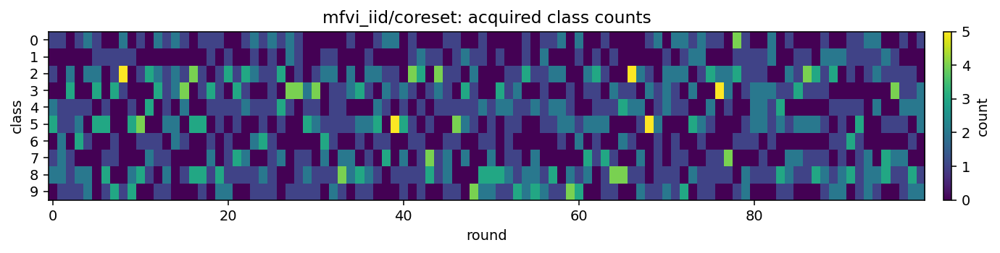

r=000 new=[0, 0, 2, 2, 0, 2, 0, 1, 2, 1] cum=[0, 0, 2, 2, 0, 2, 0, 1, 2, 1]
r=010 new=[2, 0, 0, 0, 1, 1, 0, 3, 2, 1] cum=[7, 4, 15, 14, 15, 15, 9, 10, 14, 7]
r=020 new=[1, 0, 3, 2, 0, 0, 0, 1, 0, 3] cum=[19, 12, 24, 26, 25, 28, 16, 15, 26, 19]
r=030 new=[0, 1, 2, 2, 0, 2, 0, 0, 3, 0] cum=[23, 15, 41, 40, 30, 37, 19, 31, 47, 27]
r=040 new=[0, 1, 0, 2, 0, 3, 2, 1, 0, 1] cum=[32, 18, 52, 49, 38, 52, 28, 43, 61, 37]
r=050 new=[0, 1, 1, 1, 1, 1, 0, 0, 4, 1] cum=[36, 23, 64, 59, 50, 63, 32, 47, 82, 54]
r=060 new=[0, 1, 2, 1, 1, 1, 0, 1, 2, 1] cum=[38, 27, 76, 76, 66, 71, 39, 52, 101, 64]
r=070 new=[2, 0, 1, 0, 3, 0, 0, 1, 2, 1] cum=[47, 33, 94, 83, 78, 77, 52, 63, 111, 72]
r=080 new=[1, 1, 0, 0, 2, 1, 1, 0, 2, 2] cum=[54, 40, 106, 97, 83, 88, 59, 76, 126, 81]
r=090 new=[1, 0, 2, 1, 0, 2, 0, 0, 3, 1] cum=[61, 45, 122, 103, 93, 101, 62, 81, 144, 98]


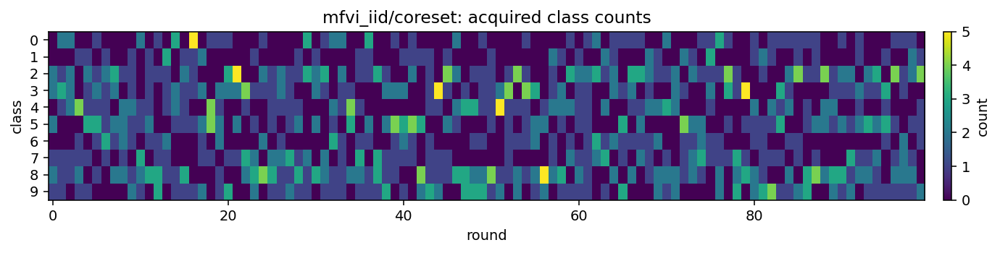

r=000 new=[1, 1, 0, 0, 2, 1, 2, 1, 0, 2] cum=[1, 1, 0, 0, 2, 1, 2, 1, 0, 2]
r=010 new=[2, 0, 2, 0, 1, 2, 0, 2, 1, 0] cum=[12, 11, 7, 3, 16, 12, 12, 18, 5, 14]
r=020 new=[2, 1, 1, 0, 2, 1, 0, 0, 3, 0] cum=[26, 23, 16, 11, 29, 19, 21, 26, 16, 23]
r=030 new=[1, 0, 1, 1, 1, 1, 3, 1, 0, 1] cum=[36, 35, 26, 16, 38, 29, 32, 35, 27, 36]
r=040 new=[0, 2, 0, 0, 1, 1, 3, 0, 1, 2] cum=[41, 46, 36, 27, 50, 38, 41, 47, 37, 47]
r=050 new=[0, 2, 1, 1, 1, 0, 1, 0, 3, 1] cum=[48, 61, 45, 34, 56, 46, 54, 57, 52, 57]
r=060 new=[0, 2, 2, 1, 1, 2, 0, 1, 0, 1] cum=[55, 65, 56, 47, 71, 57, 60, 70, 62, 67]
r=070 new=[1, 2, 0, 0, 1, 1, 1, 0, 1, 3] cum=[67, 76, 64, 56, 85, 65, 69, 79, 73, 76]
r=080 new=[1, 0, 0, 0, 3, 1, 1, 2, 1, 1] cum=[80, 85, 77, 60, 94, 74, 81, 87, 89, 83]
r=090 new=[1, 0, 1, 3, 1, 2, 1, 0, 1, 0] cum=[91, 93, 83, 71, 105, 87, 94, 95, 100, 91]


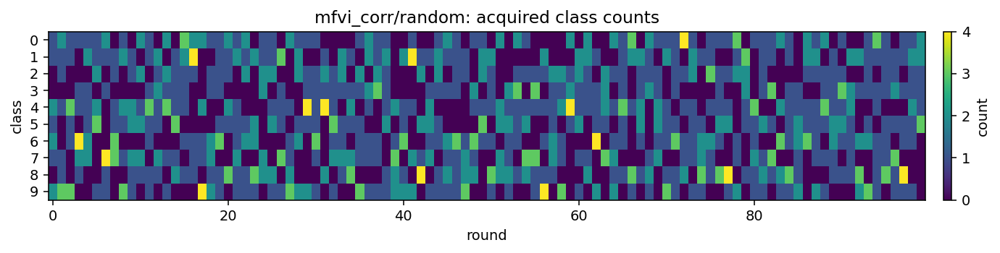

r=000 new=[2, 1, 0, 1, 0, 1, 0, 3, 0, 2] cum=[2, 1, 0, 1, 0, 1, 0, 3, 0, 2]
r=010 new=[0, 1, 1, 0, 2, 1, 3, 1, 1, 0] cum=[10, 11, 7, 10, 13, 16, 9, 10, 10, 14]
r=020 new=[0, 1, 3, 1, 1, 0, 0, 0, 2, 2] cum=[18, 21, 23, 19, 24, 18, 26, 14, 25, 22]
r=030 new=[2, 1, 0, 1, 1, 1, 2, 2, 0, 0] cum=[26, 32, 31, 27, 38, 27, 38, 35, 30, 26]
r=040 new=[1, 0, 1, 0, 2, 3, 0, 2, 0, 1] cum=[40, 44, 43, 32, 47, 40, 47, 45, 37, 35]
r=050 new=[1, 0, 1, 2, 2, 1, 1, 0, 1, 1] cum=[52, 51, 49, 47, 53, 56, 57, 54, 41, 50]
r=060 new=[1, 2, 0, 2, 1, 1, 1, 0, 1, 1] cum=[61, 64, 57, 59, 63, 66, 66, 60, 51, 63]
r=070 new=[2, 1, 1, 1, 1, 1, 1, 1, 0, 1] cum=[72, 75, 69, 70, 70, 73, 78, 72, 61, 70]
r=080 new=[2, 0, 1, 0, 2, 0, 0, 1, 3, 1] cum=[84, 92, 73, 81, 78, 79, 82, 86, 79, 76]
r=090 new=[0, 0, 2, 3, 2, 1, 1, 0, 0, 1] cum=[95, 99, 88, 89, 87, 87, 90, 101, 90, 84]


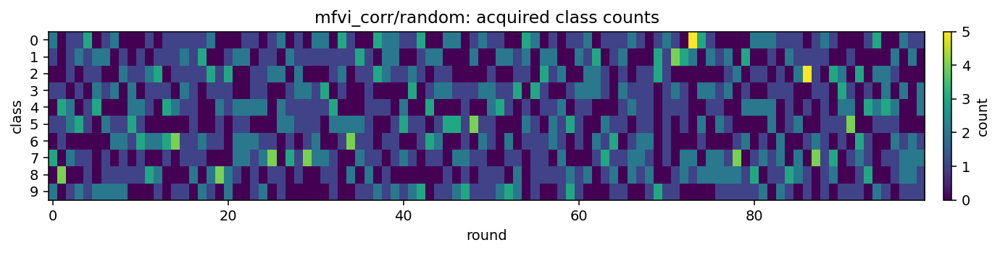

r=000 new=[2, 1, 0, 0, 2, 0, 1, 1, 0, 3] cum=[2, 1, 0, 0, 2, 0, 1, 1, 0, 3]
r=010 new=[0, 0, 2, 1, 1, 0, 1, 3, 1, 1] cum=[12, 8, 6, 9, 10, 13, 15, 15, 7, 15]
r=020 new=[1, 0, 3, 1, 0, 0, 3, 0, 2, 0] cum=[18, 14, 18, 20, 24, 23, 28, 23, 16, 26]
r=030 new=[2, 0, 0, 2, 1, 2, 1, 0, 0, 2] cum=[29, 30, 28, 28, 29, 33, 37, 30, 24, 42]
r=040 new=[0, 2, 0, 1, 0, 1, 1, 3, 1, 1] cum=[36, 41, 37, 39, 40, 43, 50, 42, 31, 51]
r=050 new=[1, 2, 1, 2, 1, 0, 0, 1, 1, 1] cum=[40, 55, 46, 50, 48, 50, 61, 53, 45, 62]
r=060 new=[0, 1, 2, 1, 0, 1, 3, 2, 0, 0] cum=[48, 64, 56, 62, 56, 56, 80, 65, 52, 71]
r=070 new=[1, 1, 1, 1, 0, 1, 1, 2, 1, 1] cum=[53, 73, 65, 73, 72, 66, 88, 77, 64, 79]
r=080 new=[1, 1, 0, 1, 1, 0, 2, 0, 2, 2] cum=[62, 88, 76, 83, 85, 70, 98, 87, 72, 89]
r=090 new=[0, 3, 0, 1, 1, 1, 1, 0, 0, 3] cum=[69, 102, 85, 93, 95, 78, 112, 98, 77, 101]


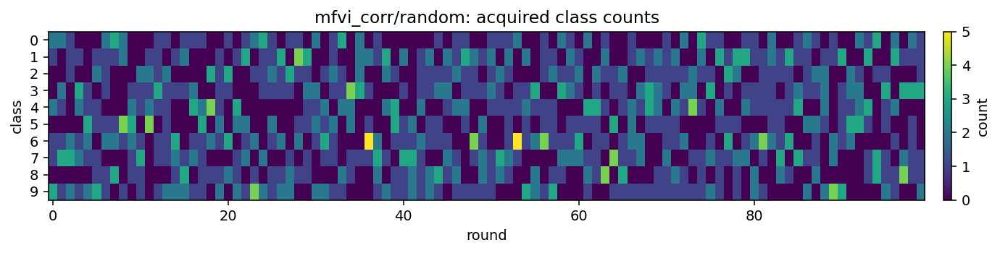

[acq dbg] r=000 mfvi_corr std=11.9 q10=460 q50=477 q90=492 min=436 max=508 p90/p10=1.07 uniq~=2000/2000
r=000 new=[0, 0, 0, 0, 3, 1, 4, 2, 0, 0] cum=[0, 0, 0, 0, 3, 1, 4, 2, 0, 0]
[acq dbg] r=005 mfvi_corr std=69.1 q10=922 q50=1e+03 q90=1.1e+03 min=806 max=1.2e+03 p90/p10=1.19 uniq~=2000/2000
[acq dbg] r=010 mfvi_corr std=8.32 q10=40.7 q50=49.5 q90=63.1 min=32 max=80 p90/p10=1.55 uniq~=2000/2000
r=010 new=[0, 1, 0, 0, 2, 0, 0, 4, 0, 3] cum=[4, 13, 12, 16, 7, 3, 4, 30, 10, 11]
[acq dbg] r=015 mfvi_corr std=0.00838 q10=0.0621 q50=0.072 q90=0.0832 min=0.0457 max=0.115 p90/p10=1.34 uniq~=2000/2000
[acq dbg] r=020 mfvi_corr std=0.00829 q10=0.0484 q50=0.0581 q90=0.0689 min=0.0284 max=0.0919 p90/p10=1.42 uniq~=2000/2000
r=020 new=[0, 0, 0, 1, 1, 1, 2, 2, 3, 0] cum=[12, 35, 18, 20, 22, 6, 10, 48, 18, 21]
[acq dbg] r=025 mfvi_corr std=0.00421 q10=0.0395 q50=0.0447 q90=0.05 min=0.0306 max=0.0656 p90/p10=1.27 uniq~=2000/2000
[acq dbg] r=030 mfvi_corr std=0.00647 q10=0.0341 q50=0.0408 q90=0.0506 m

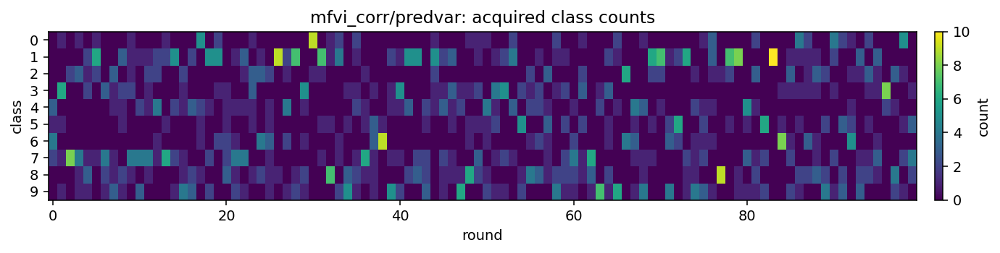

[acq dbg] r=000 mfvi_corr std=17.1 q10=452 q50=480 q90=496 min=408 max=512 p90/p10=1.1 uniq~=2000/2000
r=000 new=[1, 1, 0, 1, 0, 0, 0, 2, 1, 4] cum=[1, 1, 0, 1, 0, 0, 0, 2, 1, 4]
[acq dbg] r=005 mfvi_corr std=57 q10=513 q50=578 q90=659 min=417 max=768 p90/p10=1.28 uniq~=2000/2000
[acq dbg] r=010 mfvi_corr std=2.9 q10=22.9 q50=27.5 q90=30.5 min=18.5 max=38.3 p90/p10=1.34 uniq~=2000/2000
r=010 new=[0, 1, 0, 3, 2, 0, 2, 1, 0, 1] cum=[8, 21, 7, 14, 10, 8, 9, 10, 9, 14]
[acq dbg] r=015 mfvi_corr std=0.00616 q10=0.0453 q50=0.0529 q90=0.0608 min=0.0342 max=0.0752 p90/p10=1.34 uniq~=2000/2000
[acq dbg] r=020 mfvi_corr std=0.00855 q10=0.047 q50=0.0584 q90=0.0693 min=0.0341 max=0.0895 p90/p10=1.47 uniq~=2000/2000
r=020 new=[0, 4, 1, 0, 0, 1, 0, 2, 1, 1] cum=[12, 46, 13, 19, 21, 21, 15, 22, 19, 22]
[acq dbg] r=025 mfvi_corr std=0.0104 q10=0.0336 q50=0.0435 q90=0.0614 min=0.0264 max=0.077 p90/p10=1.83 uniq~=2000/2000
[acq dbg] r=030 mfvi_corr std=0.00527 q10=0.0272 q50=0.0341 q90=0.0406 min=0.0176

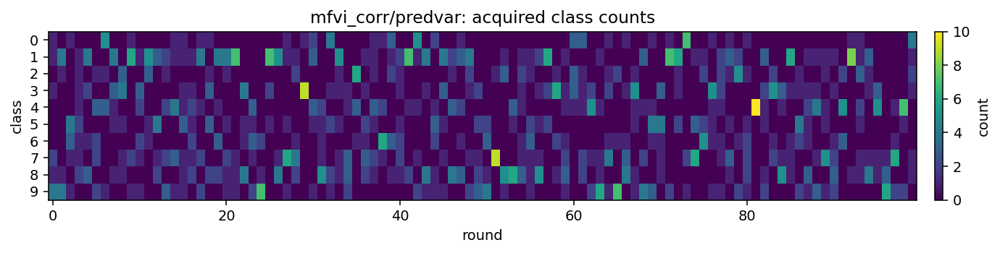

[acq dbg] r=000 mfvi_corr std=16.6 q10=450 q50=472 q90=495 min=425 max=510 p90/p10=1.1 uniq~=2000/2000
r=000 new=[0, 6, 2, 0, 0, 0, 0, 2, 0, 0] cum=[0, 6, 2, 0, 0, 0, 0, 2, 0, 0]
[acq dbg] r=005 mfvi_corr std=60.3 q10=664 q50=742 q90=817 min=531 max=934 p90/p10=1.23 uniq~=2000/2000
[acq dbg] r=010 mfvi_corr std=8.25 q10=42.2 q50=52.6 q90=63.3 min=30.3 max=81.2 p90/p10=1.5 uniq~=2000/2000
r=010 new=[0, 5, 0, 1, 0, 0, 0, 0, 3, 1] cum=[12, 18, 21, 12, 4, 5, 3, 15, 13, 7]
[acq dbg] r=015 mfvi_corr std=0.0073 q10=0.0466 q50=0.0572 q90=0.0656 min=0.0369 max=0.0844 p90/p10=1.41 uniq~=2000/2000
[acq dbg] r=020 mfvi_corr std=0.00983 q10=0.0444 q50=0.0569 q90=0.0692 min=0.0297 max=0.102 p90/p10=1.56 uniq~=2000/2000
r=020 new=[0, 4, 1, 2, 0, 1, 0, 0, 1, 1] cum=[19, 56, 26, 17, 13, 10, 7, 24, 21, 17]
[acq dbg] r=025 mfvi_corr std=0.00755 q10=0.0362 q50=0.0452 q90=0.0557 min=0.025 max=0.0753 p90/p10=1.54 uniq~=2000/2000
[acq dbg] r=030 mfvi_corr std=0.00306 q10=0.0282 q50=0.0323 q90=0.0358 min=0.02

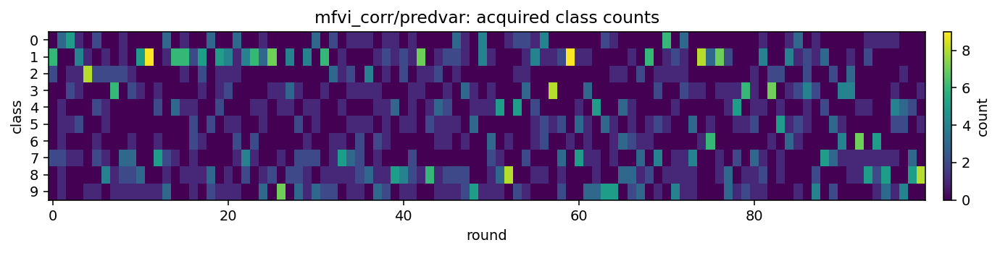

[acq dbg] r=000 mfvi_corr std=11.9 q10=460 q50=477 q90=491 min=436 max=508 p90/p10=1.07 uniq~=2000/2000
r=000 new=[0, 0, 0, 4, 1, 1, 4, 0, 0, 0] cum=[0, 0, 0, 4, 1, 1, 4, 0, 0, 0]
[acq dbg] r=005 mfvi_corr std=79.3 q10=802 q50=902 q90=1e+03 min=642 max=1.18e+03 p90/p10=1.25 uniq~=2000/2000
[acq dbg] r=010 mfvi_corr std=6.95 q10=37.1 q50=44.5 q90=55 min=28.2 max=72.8 p90/p10=1.48 uniq~=2000/2000
r=010 new=[1, 1, 1, 0, 2, 0, 1, 1, 1, 2] cum=[12, 4, 13, 10, 10, 15, 10, 9, 17, 10]
[acq dbg] r=015 mfvi_corr std=0.0169 q10=0.0679 q50=0.0881 q90=0.111 min=0.05 max=0.142 p90/p10=1.64 uniq~=2000/2000
[acq dbg] r=020 mfvi_corr std=0.00948 q10=0.0465 q50=0.0595 q90=0.071 min=0.0304 max=0.0876 p90/p10=1.53 uniq~=2000/2000
r=020 new=[0, 0, 1, 0, 1, 1, 1, 1, 1, 4] cum=[17, 13, 22, 24, 23, 30, 13, 12, 31, 25]
[acq dbg] r=025 mfvi_corr std=0.0057 q10=0.0406 q50=0.047 q90=0.0553 min=0.0352 max=0.0683 p90/p10=1.36 uniq~=2000/2000
[acq dbg] r=030 mfvi_corr std=0.00884 q10=0.0371 q50=0.0479 q90=0.0604 min

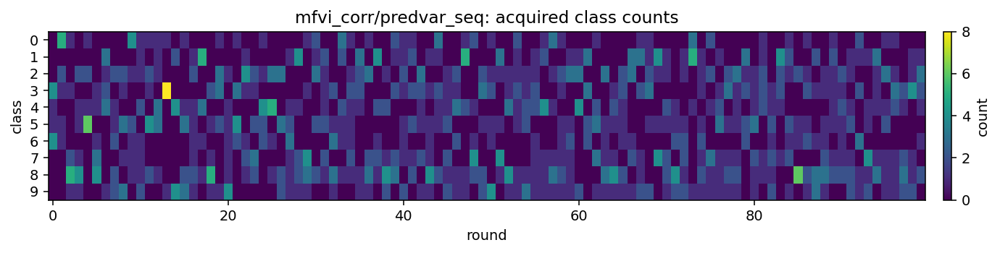

[acq dbg] r=000 mfvi_corr std=17.2 q10=452 q50=480 q90=496 min=408 max=512 p90/p10=1.1 uniq~=2000/2000
r=000 new=[0, 0, 0, 1, 0, 4, 4, 1, 0, 0] cum=[0, 0, 0, 1, 0, 4, 4, 1, 0, 0]
[acq dbg] r=005 mfvi_corr std=54.3 q10=557 q50=629 q90=700 min=447 max=830 p90/p10=1.26 uniq~=2000/2000
[acq dbg] r=010 mfvi_corr std=2.93 q10=28.8 q50=32.5 q90=36.2 min=23.3 max=45 p90/p10=1.26 uniq~=2000/2000
r=010 new=[2, 1, 0, 1, 1, 2, 1, 1, 1, 0] cum=[6, 10, 14, 10, 10, 20, 11, 9, 14, 6]
[acq dbg] r=015 mfvi_corr std=0.00984 q10=0.0627 q50=0.0726 q90=0.0887 min=0.0491 max=0.111 p90/p10=1.41 uniq~=2000/2000
[acq dbg] r=020 mfvi_corr std=0.0115 q10=0.0653 q50=0.0782 q90=0.0949 min=0.0466 max=0.124 p90/p10=1.45 uniq~=2000/2000
r=020 new=[1, 0, 0, 1, 1, 2, 1, 0, 1, 3] cum=[12, 20, 22, 21, 20, 31, 22, 12, 28, 22]
[acq dbg] r=025 mfvi_corr std=0.0193 q10=0.0609 q50=0.0811 q90=0.111 min=0.0338 max=0.155 p90/p10=1.81 uniq~=2000/2000
[acq dbg] r=030 mfvi_corr std=0.00605 q10=0.0318 q50=0.0401 q90=0.0474 min=0.0245

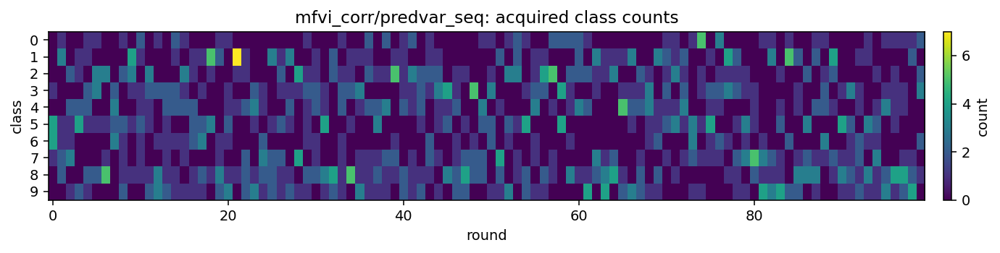

[acq dbg] r=000 mfvi_corr std=16.6 q10=450 q50=472 q90=495 min=425 max=510 p90/p10=1.1 uniq~=2000/2000
r=000 new=[0, 6, 0, 1, 0, 0, 1, 1, 0, 1] cum=[0, 6, 0, 1, 0, 0, 1, 1, 0, 1]
[acq dbg] r=005 mfvi_corr std=63.9 q10=701 q50=782 q90=862 min=576 max=1.01e+03 p90/p10=1.23 uniq~=2000/2000
[acq dbg] r=010 mfvi_corr std=2.08 q10=12.9 q50=15.9 q90=18.4 min=9.82 max=22.6 p90/p10=1.42 uniq~=2000/2000
r=010 new=[2, 0, 1, 1, 0, 1, 0, 3, 2, 0] cum=[7, 11, 16, 12, 9, 9, 7, 18, 16, 5]
[acq dbg] r=015 mfvi_corr std=0.0097 q10=0.0668 q50=0.0779 q90=0.0908 min=0.052 max=0.118 p90/p10=1.36 uniq~=2000/2000
[acq dbg] r=020 mfvi_corr std=0.0112 q10=0.044 q50=0.0565 q90=0.0742 min=0.035 max=0.113 p90/p10=1.69 uniq~=2000/2000
r=020 new=[1, 1, 0, 0, 1, 2, 2, 2, 0, 1] cum=[12, 21, 32, 24, 22, 17, 11, 29, 25, 17]
[acq dbg] r=025 mfvi_corr std=0.0145 q10=0.051 q50=0.0702 q90=0.0909 min=0.0345 max=0.114 p90/p10=1.78 uniq~=2000/2000
[acq dbg] r=030 mfvi_corr std=0.00602 q10=0.0325 q50=0.0396 q90=0.0479 min=0.023

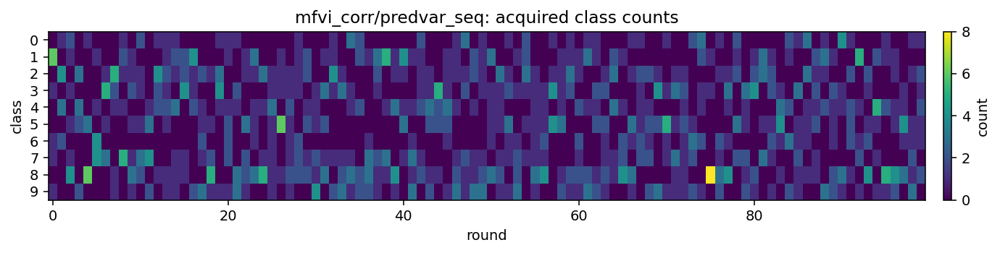

[acq dbg] r=000 mfvi_corr std=11.6 q10=460 q50=477 q90=492 min=436 max=507 p90/p10=1.07 uniq~=2000/2000
r=000 new=[0, 0, 0, 4, 1, 2, 3, 0, 0, 0] cum=[0, 0, 0, 4, 1, 2, 3, 0, 0, 0]
[acq dbg] r=005 mfvi_corr std=72 q10=860 q50=937 q90=1.05e+03 min=714 max=1.2e+03 p90/p10=1.22 uniq~=2000/2000
[acq dbg] r=010 mfvi_corr std=8.62 q10=45.5 q50=56.1 q90=67.3 min=33.7 max=93.4 p90/p10=1.48 uniq~=2000/2000
r=010 new=[0, 1, 1, 1, 1, 0, 0, 3, 1, 2] cum=[9, 5, 14, 14, 14, 13, 6, 9, 13, 13]
[acq dbg] r=015 mfvi_corr std=0.0115 q10=0.087 q50=0.1 q90=0.117 min=0.0688 max=0.15 p90/p10=1.34 uniq~=2000/2000
[acq dbg] r=020 mfvi_corr std=0.0135 q10=0.0588 q50=0.077 q90=0.0936 min=0.038 max=0.119 p90/p10=1.59 uniq~=2000/2000
r=020 new=[1, 1, 2, 0, 1, 0, 2, 0, 2, 1] cum=[15, 14, 30, 24, 20, 21, 24, 21, 25, 16]
[acq dbg] r=025 mfvi_corr std=0.00742 q10=0.0384 q50=0.0464 q90=0.0572 min=0.0315 max=0.072 p90/p10=1.49 uniq~=2000/2000
[acq dbg] r=030 mfvi_corr std=0.00662 q10=0.0318 q50=0.0403 q90=0.0488 min=0.02

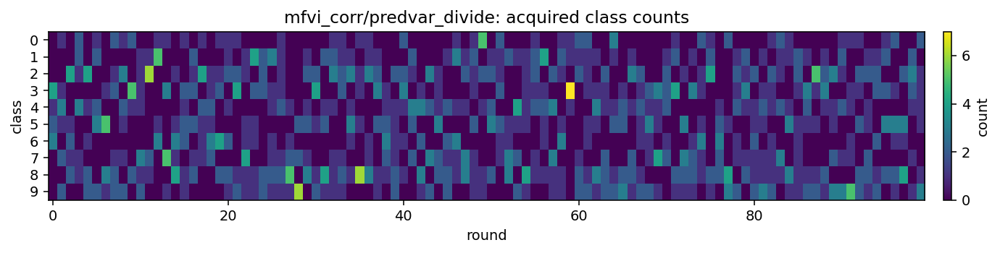

[acq dbg] r=000 mfvi_corr std=17.2 q10=452 q50=480 q90=496 min=407 max=512 p90/p10=1.1 uniq~=2000/2000
r=000 new=[0, 0, 0, 1, 0, 4, 4, 1, 0, 0] cum=[0, 0, 0, 1, 0, 4, 4, 1, 0, 0]
[acq dbg] r=005 mfvi_corr std=46.8 q10=368 q50=429 q90=490 min=320 max=580 p90/p10=1.33 uniq~=2000/2000
[acq dbg] r=010 mfvi_corr std=4.64 q10=37.8 q50=43.5 q90=49.5 min=31.8 max=61.3 p90/p10=1.31 uniq~=2000/2000
r=010 new=[2, 2, 0, 1, 0, 0, 3, 0, 0, 2] cum=[6, 13, 13, 11, 9, 16, 15, 3, 14, 10]
[acq dbg] r=015 mfvi_corr std=0.0108 q10=0.0653 q50=0.0751 q90=0.0925 min=0.0527 max=0.119 p90/p10=1.42 uniq~=2000/2000
[acq dbg] r=020 mfvi_corr std=0.0143 q10=0.0583 q50=0.076 q90=0.0958 min=0.0428 max=0.13 p90/p10=1.64 uniq~=2000/2000
r=020 new=[0, 0, 1, 0, 1, 0, 1, 0, 7, 0] cum=[14, 19, 27, 20, 17, 27, 20, 16, 35, 15]
[acq dbg] r=025 mfvi_corr std=0.00805 q10=0.0469 q50=0.056 q90=0.0683 min=0.0365 max=0.0812 p90/p10=1.46 uniq~=2000/2000
[acq dbg] r=030 mfvi_corr std=0.00661 q10=0.0327 q50=0.0412 q90=0.0502 min=0.022

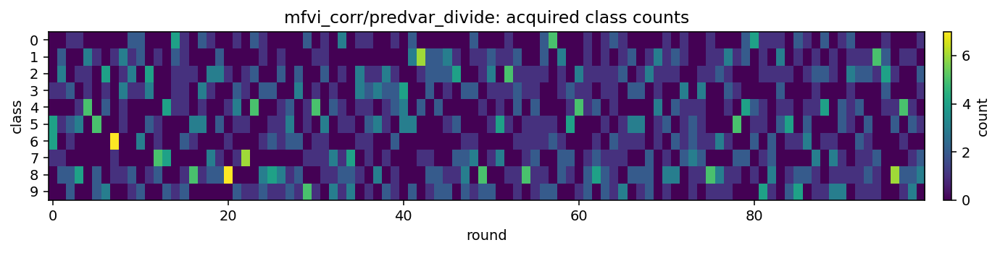

[acq dbg] r=000 mfvi_corr std=16.6 q10=450 q50=472 q90=495 min=425 max=510 p90/p10=1.1 uniq~=2000/2000
r=000 new=[0, 6, 1, 1, 0, 0, 1, 0, 0, 1] cum=[0, 6, 1, 1, 0, 0, 1, 0, 0, 1]
[acq dbg] r=005 mfvi_corr std=44.4 q10=711 q50=760 q90=824 min=626 max=921 p90/p10=1.16 uniq~=2000/2000
[acq dbg] r=010 mfvi_corr std=8.39 q10=41.3 q50=47.7 q90=62.1 min=32.2 max=87.1 p90/p10=1.5 uniq~=2000/2000
r=010 new=[0, 0, 4, 1, 0, 1, 0, 1, 2, 1] cum=[4, 12, 18, 13, 14, 10, 8, 8, 15, 8]
[acq dbg] r=015 mfvi_corr std=0.0112 q10=0.0624 q50=0.0763 q90=0.091 min=0.0475 max=0.119 p90/p10=1.46 uniq~=2000/2000
[acq dbg] r=020 mfvi_corr std=0.0484 q10=0.155 q50=0.214 q90=0.28 min=0.11 max=0.385 p90/p10=1.81 uniq~=2000/2000
r=020 new=[0, 1, 5, 1, 0, 1, 2, 0, 0, 0] cum=[12, 24, 32, 25, 18, 23, 15, 16, 29, 16]
[acq dbg] r=025 mfvi_corr std=0.0117 q10=0.0473 q50=0.0625 q90=0.0785 min=0.0306 max=0.103 p90/p10=1.66 uniq~=2000/2000
[acq dbg] r=030 mfvi_corr std=0.00464 q10=0.0345 q50=0.0401 q90=0.0468 min=0.027 max=0.0

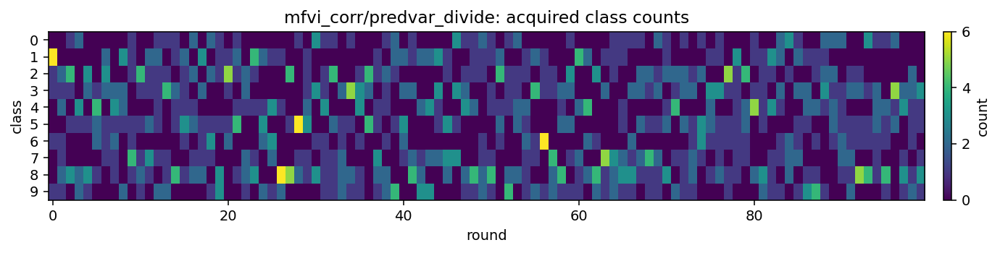

r=000 new=[0, 0, 0, 1, 2, 1, 2, 1, 2, 1] cum=[0, 0, 0, 1, 2, 1, 2, 1, 2, 1]
r=010 new=[1, 0, 1, 1, 1, 0, 1, 1, 4, 0] cum=[11, 1, 15, 13, 11, 10, 10, 13, 16, 10]
r=020 new=[0, 3, 2, 0, 2, 1, 0, 0, 2, 0] cum=[17, 8, 34, 23, 22, 27, 14, 20, 29, 16]
r=030 new=[1, 0, 1, 0, 1, 0, 0, 2, 1, 4] cum=[26, 11, 42, 37, 36, 36, 20, 31, 41, 30]
r=040 new=[0, 1, 2, 2, 0, 2, 0, 0, 2, 1] cum=[33, 17, 56, 54, 39, 52, 25, 40, 60, 34]
r=050 new=[0, 0, 3, 0, 2, 1, 1, 1, 2, 0] cum=[38, 21, 67, 65, 51, 59, 29, 55, 79, 46]
r=060 new=[1, 0, 2, 0, 0, 0, 0, 1, 4, 2] cum=[48, 27, 77, 74, 60, 68, 33, 57, 104, 62]
r=070 new=[0, 3, 3, 0, 0, 1, 0, 1, 1, 1] cum=[54, 36, 92, 85, 65, 85, 39, 64, 117, 73]
r=080 new=[0, 0, 1, 0, 4, 0, 1, 0, 4, 0] cum=[57, 42, 111, 93, 74, 92, 50, 68, 139, 84]
r=090 new=[2, 0, 3, 1, 1, 2, 0, 1, 0, 0] cum=[63, 48, 131, 102, 82, 104, 55, 76, 152, 97]


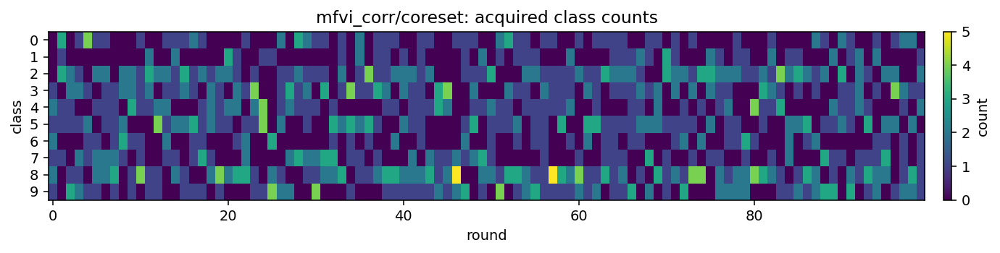

r=000 new=[1, 0, 1, 0, 2, 3, 0, 1, 2, 0] cum=[1, 0, 1, 0, 2, 3, 0, 1, 2, 0]
r=010 new=[1, 1, 1, 0, 1, 0, 2, 3, 1, 0] cum=[9, 4, 20, 9, 11, 16, 9, 10, 14, 8]
r=020 new=[1, 0, 2, 0, 1, 1, 2, 1, 1, 1] cum=[18, 9, 33, 24, 19, 28, 17, 18, 29, 15]
r=030 new=[0, 0, 1, 3, 0, 5, 0, 0, 0, 1] cum=[27, 16, 45, 37, 25, 43, 22, 23, 42, 30]
r=040 new=[2, 2, 0, 1, 1, 1, 0, 0, 1, 2] cum=[34, 23, 57, 52, 37, 57, 26, 26, 58, 40]
r=050 new=[0, 0, 0, 0, 3, 2, 0, 1, 3, 1] cum=[42, 29, 64, 64, 44, 67, 31, 40, 78, 51]
r=060 new=[0, 0, 3, 0, 2, 0, 0, 0, 1, 4] cum=[49, 33, 84, 82, 52, 72, 32, 45, 100, 61]
r=070 new=[1, 1, 1, 0, 1, 1, 2, 1, 1, 1] cum=[57, 36, 98, 97, 61, 89, 41, 55, 107, 69]
r=080 new=[0, 0, 5, 0, 1, 0, 1, 1, 1, 1] cum=[59, 38, 111, 109, 73, 99, 52, 65, 120, 84]
r=090 new=[0, 0, 0, 0, 0, 0, 1, 4, 4, 1] cum=[64, 48, 121, 117, 81, 113, 60, 76, 135, 95]


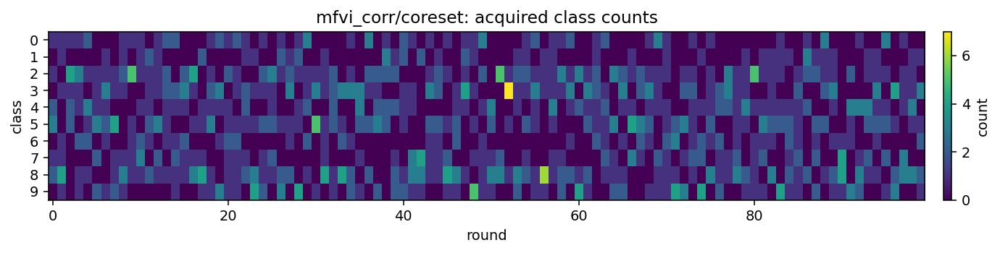

r=000 new=[0, 0, 3, 1, 2, 2, 0, 0, 2, 0] cum=[0, 0, 3, 1, 2, 2, 0, 0, 2, 0]
r=010 new=[3, 0, 1, 0, 2, 1, 0, 0, 3, 0] cum=[8, 3, 19, 15, 11, 17, 8, 8, 13, 8]
r=020 new=[1, 1, 2, 2, 0, 0, 1, 1, 1, 1] cum=[16, 7, 31, 27, 21, 25, 13, 17, 33, 20]
r=030 new=[3, 0, 0, 0, 1, 0, 0, 2, 4, 0] cum=[22, 15, 42, 42, 27, 37, 19, 27, 50, 29]
r=040 new=[2, 0, 2, 0, 1, 0, 0, 1, 2, 2] cum=[34, 21, 54, 52, 35, 45, 25, 31, 75, 38]
r=050 new=[0, 0, 3, 3, 0, 2, 1, 0, 0, 1] cum=[38, 25, 71, 70, 44, 55, 30, 40, 92, 45]
r=060 new=[1, 0, 1, 0, 2, 1, 0, 2, 2, 1] cum=[52, 30, 82, 85, 54, 70, 34, 45, 102, 56]
r=070 new=[0, 0, 3, 0, 1, 2, 1, 0, 1, 2] cum=[57, 36, 98, 95, 64, 80, 39, 55, 120, 66]
r=080 new=[0, 1, 0, 0, 1, 3, 1, 1, 2, 1] cum=[65, 39, 110, 105, 73, 90, 45, 67, 142, 74]
r=090 new=[1, 0, 3, 0, 0, 0, 1, 2, 0, 3] cum=[69, 46, 123, 119, 83, 100, 52, 78, 152, 88]


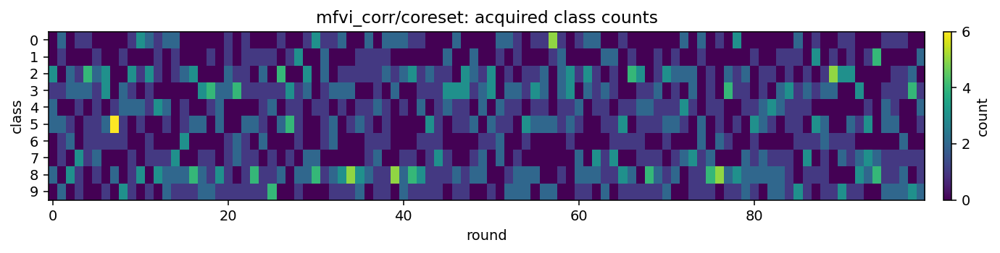

[acq dbg] r=000 blr_iid std=4.5 q10=3.29 q50=8.97 q90=14.9 min=0.262 max=25.9 p90/p10=4.54 uniq~=2000/2000
r=000 new=[1, 1, 2, 1, 0, 4, 1, 0, 0, 0] cum=[1, 1, 2, 1, 0, 4, 1, 0, 0, 0]
[acq dbg] r=005 blr_iid std=3.74 q10=1.77 q50=4.99 q90=10.7 min=0.191 max=33.2 p90/p10=6.04 uniq~=2000/2000
[acq dbg] r=010 blr_iid std=0.036 q10=0.00793 q50=0.0159 q90=0.0309 min=0.00322 max=1.04 p90/p10=3.9 uniq~=2000/2000
r=010 new=[0, 1, 2, 1, 1, 1, 0, 2, 1, 1] cum=[14, 3, 16, 13, 10, 15, 16, 6, 9, 8]
[acq dbg] r=015 blr_iid std=0.0041 q10=0.00415 q50=0.00717 q90=0.0133 min=0.00138 max=0.042 p90/p10=3.19 uniq~=2000/2000
[acq dbg] r=020 blr_iid std=0.00209 q10=0.00223 q50=0.00387 q90=0.00704 min=0.000997 max=0.0162 p90/p10=3.16 uniq~=2000/2000
r=020 new=[1, 0, 1, 1, 1, 2, 0, 2, 2, 0] cum=[20, 5, 29, 26, 16, 31, 22, 17, 30, 14]
[acq dbg] r=025 blr_iid std=0.00274 q10=0.00238 q50=0.00436 q90=0.00889 min=0.00123 max=0.0195 p90/p10=3.73 uniq~=2000/2000
[acq dbg] r=030 blr_iid std=0.00286 q10=0.00113 q50=0.0

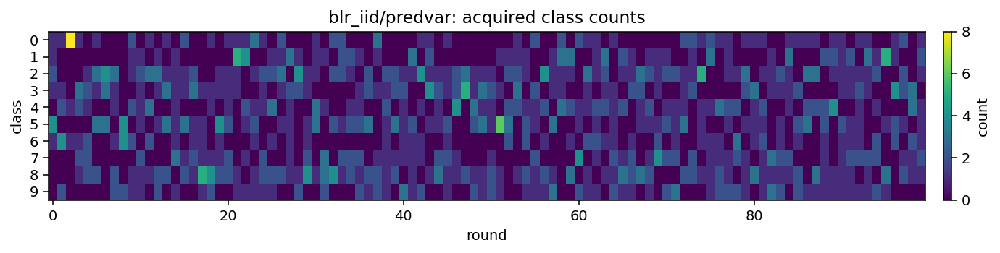

[acq dbg] r=000 blr_iid std=4.34 q10=3.82 q50=8.81 q90=15 min=0.496 max=25 p90/p10=3.93 uniq~=2000/2000
r=000 new=[3, 0, 0, 0, 2, 1, 1, 1, 1, 1] cum=[3, 0, 0, 0, 2, 1, 1, 1, 1, 1]
[acq dbg] r=005 blr_iid std=0.0495 q10=0.0178 q50=0.0537 q90=0.135 min=0.00534 max=0.384 p90/p10=7.57 uniq~=2000/2000
[acq dbg] r=010 blr_iid std=0.0112 q10=0.00858 q50=0.0183 q90=0.0357 min=0.00366 max=0.078 p90/p10=4.15 uniq~=2000/2000
r=010 new=[0, 1, 1, 3, 0, 0, 1, 0, 2, 2] cum=[10, 3, 12, 12, 13, 18, 8, 11, 12, 11]
[acq dbg] r=015 blr_iid std=0.00561 q10=0.00417 q50=0.00898 q90=0.0177 min=0.00176 max=0.041 p90/p10=4.23 uniq~=2000/2000
[acq dbg] r=020 blr_iid std=0.252 q10=0.00162 q50=0.00259 q90=0.00463 min=0.000826 max=8.8 p90/p10=2.86 uniq~=2000/2000
r=020 new=[0, 2, 2, 1, 1, 1, 1, 1, 0, 1] cum=[18, 16, 26, 21, 20, 30, 17, 17, 25, 20]
[acq dbg] r=025 blr_iid std=0.00299 q10=0.0016 q50=0.00256 q90=0.00465 min=0.000839 max=0.0852 p90/p10=2.91 uniq~=2000/2000
[acq dbg] r=030 blr_iid std=0.00231 q10=0.0018

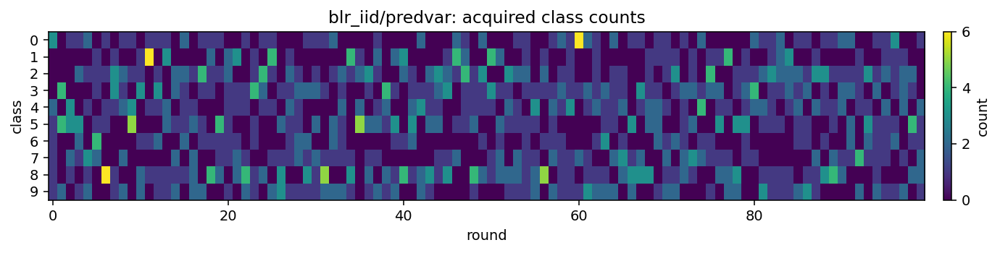

[acq dbg] r=000 blr_iid std=4.7 q10=3.2 q50=9.22 q90=15.7 min=0.174 max=24.8 p90/p10=4.9 uniq~=2000/2000
r=000 new=[1, 3, 2, 0, 0, 2, 0, 0, 1, 1] cum=[1, 3, 2, 0, 0, 2, 0, 0, 1, 1]
[acq dbg] r=005 blr_iid std=0.352 q10=0.121 q50=0.411 q90=0.975 min=0.0209 max=2.36 p90/p10=8.03 uniq~=2000/2000
[acq dbg] r=010 blr_iid std=0.0106 q10=0.00781 q50=0.017 q90=0.0326 min=0.00333 max=0.0908 p90/p10=4.17 uniq~=2000/2000
r=010 new=[1, 2, 1, 1, 1, 2, 0, 1, 0, 1] cum=[9, 9, 13, 15, 11, 16, 8, 7, 15, 7]
[acq dbg] r=015 blr_iid std=0.00607 q10=0.00411 q50=0.00925 q90=0.0187 min=0.0016 max=0.0438 p90/p10=4.55 uniq~=2000/2000
[acq dbg] r=020 blr_iid std=0.0021 q10=0.00207 q50=0.00368 q90=0.00691 min=0.00117 max=0.0274 p90/p10=3.34 uniq~=2000/2000
r=020 new=[2, 1, 0, 0, 1, 2, 0, 0, 1, 3] cum=[16, 13, 26, 24, 21, 30, 13, 20, 25, 22]
[acq dbg] r=025 blr_iid std=0.00171 q10=0.00157 q50=0.00257 q90=0.00526 min=0.000856 max=0.0185 p90/p10=3.35 uniq~=2000/2000
[acq dbg] r=030 blr_iid std=0.00207 q10=0.00141 q

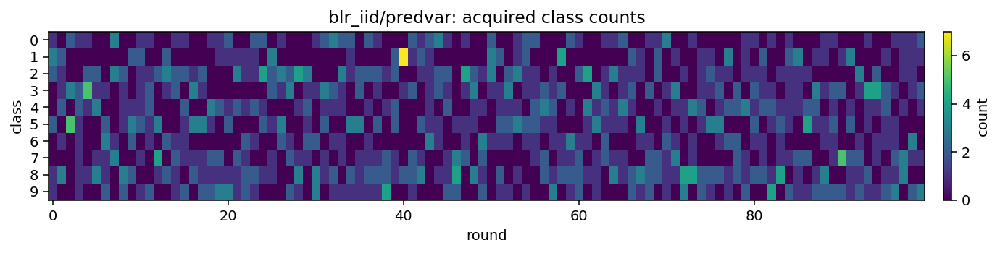

[acq dbg] r=000 blr_corr std=15.1 q10=11 q50=30 q90=49.9 min=0.873 max=86.8 p90/p10=4.52 uniq~=2000/2000
r=000 new=[1, 1, 1, 0, 1, 2, 2, 0, 1, 1] cum=[1, 1, 1, 0, 1, 2, 2, 0, 1, 1]
[acq dbg] r=005 blr_corr std=4.76 q10=1.88 q50=5.42 q90=13.3 min=0.244 max=34.4 p90/p10=7.06 uniq~=2000/2000
[acq dbg] r=010 blr_corr std=0.13 q10=0.0761 q50=0.178 q90=0.373 min=0.0204 max=1.1 p90/p10=4.9 uniq~=2000/2000
r=010 new=[0, 0, 2, 0, 1, 1, 3, 3, 0, 0] cum=[8, 14, 19, 8, 12, 10, 11, 11, 11, 6]
[acq dbg] r=015 blr_corr std=0.0451 q10=0.0306 q50=0.0692 q90=0.14 min=0.0139 max=0.288 p90/p10=4.58 uniq~=2000/2000
[acq dbg] r=020 blr_corr std=0.0628 q10=0.0135 q50=0.0233 q90=0.0418 min=0.00759 max=2.44 p90/p10=3.1 uniq~=2000/2000
r=020 new=[0, 0, 1, 0, 1, 3, 0, 2, 3, 0] cum=[18, 17, 33, 21, 23, 21, 19, 19, 25, 14]
[acq dbg] r=025 blr_corr std=0.0242 q10=0.0218 q50=0.0389 q90=0.0782 min=0.0113 max=0.189 p90/p10=3.58 uniq~=2000/2000
[acq dbg] r=030 blr_corr std=0.0111 q10=0.01 q50=0.0175 q90=0.0347 min=0.00

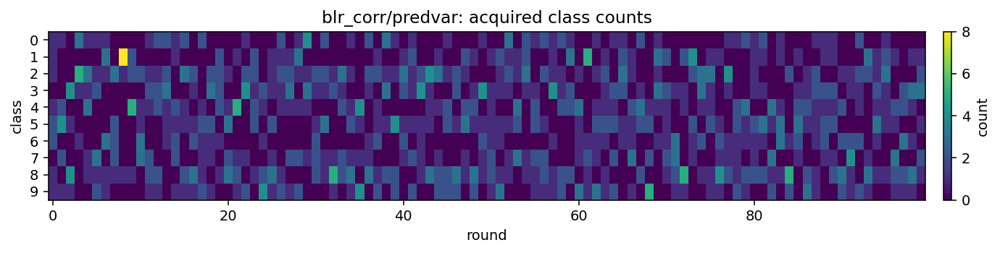

[acq dbg] r=000 blr_corr std=8.5 q10=7.48 q50=17.2 q90=29.4 min=0.976 max=49.6 p90/p10=3.93 uniq~=2000/2000
r=000 new=[3, 0, 0, 0, 0, 5, 2, 0, 0, 0] cum=[3, 0, 0, 0, 0, 5, 2, 0, 0, 0]
[acq dbg] r=005 blr_corr std=0.338 q10=0.164 q50=0.433 q90=0.92 min=0.0304 max=3.34 p90/p10=5.59 uniq~=2000/2000
[acq dbg] r=010 blr_corr std=0.0805 q10=0.0487 q50=0.127 q90=0.245 min=0.0144 max=0.527 p90/p10=5.03 uniq~=2000/2000
r=010 new=[0, 0, 1, 1, 1, 1, 3, 2, 1, 0] cum=[10, 11, 10, 12, 12, 12, 15, 7, 12, 9]
[acq dbg] r=015 blr_corr std=0.052 q10=0.0323 q50=0.077 q90=0.156 min=0.0142 max=0.378 p90/p10=4.83 uniq~=2000/2000
[acq dbg] r=020 blr_corr std=0.0606 q10=0.0159 q50=0.0263 q90=0.0472 min=0.00889 max=1.22 p90/p10=2.97 uniq~=2000/2000
r=020 new=[0, 0, 1, 2, 2, 2, 1, 2, 0, 0] cum=[17, 12, 22, 23, 29, 23, 18, 19, 29, 18]
[acq dbg] r=025 blr_corr std=0.00649 q10=0.00946 q50=0.0143 q90=0.0244 min=0.00597 max=0.0534 p90/p10=2.58 uniq~=2000/2000
[acq dbg] r=030 blr_corr std=0.0226 q10=0.0135 q50=0.0275 

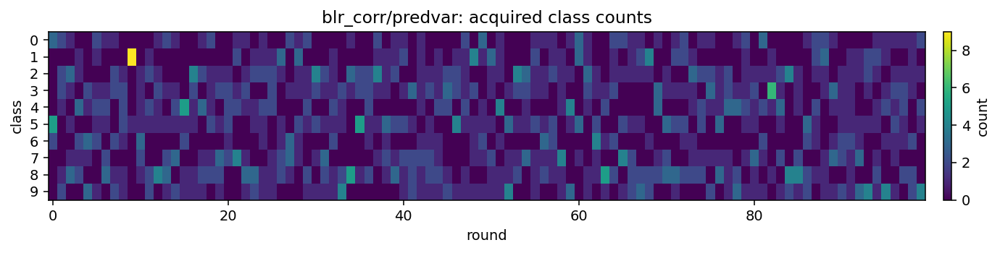

[acq dbg] r=000 blr_corr std=15.7 q10=10.7 q50=30.8 q90=52.6 min=0.583 max=83.2 p90/p10=4.93 uniq~=2000/2000
r=000 new=[0, 4, 3, 0, 0, 0, 0, 0, 1, 2] cum=[0, 4, 3, 0, 0, 0, 0, 0, 1, 2]
[acq dbg] r=005 blr_corr std=0.409 q10=0.134 q50=0.474 q90=1.07 min=0.0143 max=3.69 p90/p10=7.96 uniq~=2000/2000
[acq dbg] r=010 blr_corr std=0.159 q10=0.12 q50=0.245 q90=0.486 min=0.0381 max=1.33 p90/p10=4.05 uniq~=2000/2000
r=010 new=[2, 0, 2, 1, 1, 1, 0, 0, 3, 0] cum=[7, 7, 14, 9, 15, 16, 8, 7, 17, 10]
[acq dbg] r=015 blr_corr std=0.0548 q10=0.0452 q50=0.0829 q90=0.17 min=0.0216 max=0.418 p90/p10=3.75 uniq~=2000/2000
[acq dbg] r=020 blr_corr std=0.034 q10=0.0291 q50=0.0542 q90=0.105 min=0.0155 max=0.338 p90/p10=3.6 uniq~=2000/2000
r=020 new=[2, 0, 1, 2, 1, 0, 2, 0, 1, 1] cum=[21, 9, 30, 21, 19, 30, 16, 20, 26, 18]
[acq dbg] r=025 blr_corr std=0.0127 q10=0.00941 q50=0.0178 q90=0.035 min=0.00564 max=0.145 p90/p10=3.71 uniq~=2000/2000
[acq dbg] r=030 blr_corr std=0.017 q10=0.0121 q50=0.0231 q90=0.0497 mi

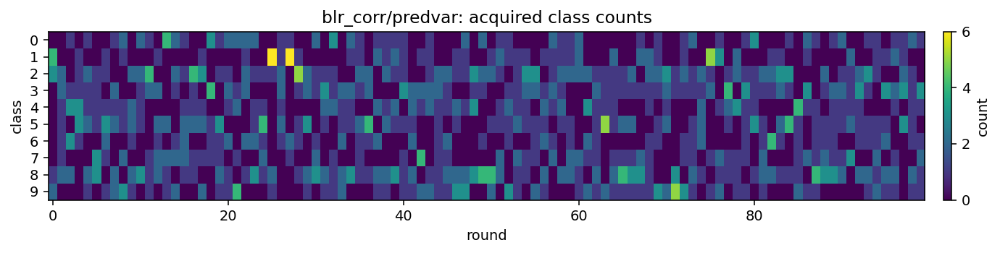

[acq dbg] r=000 mfvi_iid std=1.19 q10=45.9 q50=47.6 q90=49.1 min=43.6 max=50.8 p90/p10=1.07 uniq~=2000/2000
r=000 new=[0, 0, 0, 0, 2, 0, 1, 6, 0, 1] cum=[0, 0, 0, 0, 2, 0, 1, 6, 0, 1]
[acq dbg] r=005 mfvi_iid std=7.65 q10=84.7 q50=95.4 q90=105 min=72 max=114 p90/p10=1.24 uniq~=2000/2000
[acq dbg] r=010 mfvi_iid std=0.282 q10=1.68 q50=1.98 q90=2.4 min=1.31 max=3.3 p90/p10=1.43 uniq~=2000/2000
r=010 new=[0, 2, 0, 0, 2, 0, 0, 2, 1, 3] cum=[4, 22, 4, 3, 9, 4, 6, 28, 9, 21]
[acq dbg] r=015 mfvi_iid std=0.00126 q10=0.00609 q50=0.0081 q90=0.00936 min=0.00434 max=0.0128 p90/p10=1.54 uniq~=2000/2000
[acq dbg] r=020 mfvi_iid std=0.000847 q10=0.00468 q50=0.00596 q90=0.00689 min=0.0031 max=0.00863 p90/p10=1.47 uniq~=2000/2000
r=020 new=[2, 0, 0, 0, 1, 2, 2, 0, 3, 0] cum=[17, 48, 16, 7, 14, 11, 11, 37, 23, 26]
[acq dbg] r=025 mfvi_iid std=0.000513 q10=0.00404 q50=0.00463 q90=0.00532 min=0.00326 max=0.00708 p90/p10=1.32 uniq~=2000/2000
[acq dbg] r=030 mfvi_iid std=0.000458 q10=0.00358 q50=0.00412 q9

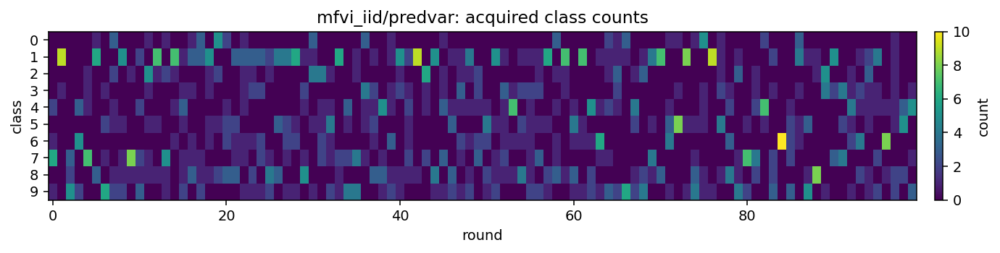

[acq dbg] r=000 mfvi_iid std=1.72 q10=45.1 q50=47.9 q90=49.5 min=40.7 max=51.1 p90/p10=1.1 uniq~=2000/2000
r=000 new=[0, 4, 0, 0, 0, 0, 1, 3, 0, 2] cum=[0, 4, 0, 0, 0, 0, 1, 3, 0, 2]
[acq dbg] r=005 mfvi_iid std=5.56 q10=58.1 q50=65.1 q90=72.3 min=48 max=83.5 p90/p10=1.24 uniq~=2000/2000
[acq dbg] r=010 mfvi_iid std=0.533 q10=5.15 q50=5.72 q90=6.45 min=4.12 max=7.69 p90/p10=1.25 uniq~=2000/2000
r=010 new=[0, 0, 6, 0, 0, 0, 3, 1, 0, 0] cum=[3, 16, 13, 10, 16, 5, 11, 16, 11, 9]
[acq dbg] r=015 mfvi_iid std=0.00094 q10=0.00663 q50=0.00774 q90=0.00905 min=0.00536 max=0.0115 p90/p10=1.36 uniq~=1999/2000
[acq dbg] r=020 mfvi_iid std=0.000801 q10=0.00495 q50=0.00577 q90=0.00698 min=0.00357 max=0.0091 p90/p10=1.41 uniq~=2000/2000
r=020 new=[0, 1, 0, 0, 0, 4, 2, 0, 3, 0] cum=[5, 55, 16, 14, 23, 14, 18, 22, 27, 16]
[acq dbg] r=025 mfvi_iid std=0.000829 q10=0.00358 q50=0.00463 q90=0.00581 min=0.00273 max=0.00756 p90/p10=1.63 uniq~=2000/2000
[acq dbg] r=030 mfvi_iid std=0.000553 q10=0.0032 q50=0.0

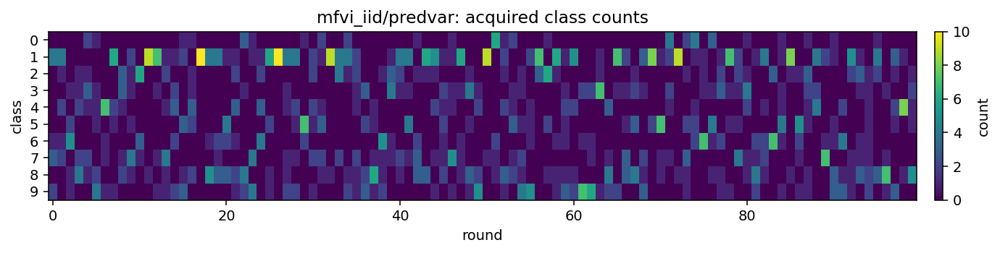

[acq dbg] r=000 mfvi_iid std=1.66 q10=45 q50=47.2 q90=49.5 min=42.5 max=51 p90/p10=1.1 uniq~=2000/2000
r=000 new=[0, 8, 1, 0, 1, 0, 0, 0, 0, 0] cum=[0, 8, 1, 0, 1, 0, 0, 0, 0, 0]
[acq dbg] r=005 mfvi_iid std=6.76 q10=81.9 q50=90.5 q90=99.8 min=74.4 max=111 p90/p10=1.22 uniq~=2000/2000
[acq dbg] r=010 mfvi_iid std=0.503 q10=4.86 q50=5.37 q90=6.13 min=4.16 max=7.74 p90/p10=1.26 uniq~=2000/2000
r=010 new=[0, 0, 1, 0, 0, 3, 1, 1, 2, 2] cum=[14, 16, 30, 4, 6, 3, 8, 10, 8, 11]
[acq dbg] r=015 mfvi_iid std=0.00105 q10=0.00665 q50=0.00804 q90=0.00938 min=0.00551 max=0.0118 p90/p10=1.41 uniq~=2000/2000
[acq dbg] r=020 mfvi_iid std=0.000948 q10=0.00469 q50=0.00567 q90=0.00715 min=0.00357 max=0.01 p90/p10=1.53 uniq~=2000/2000
r=020 new=[0, 8, 0, 1, 0, 0, 0, 1, 0, 0] cum=[17, 38, 35, 9, 21, 12, 17, 18, 17, 26]
[acq dbg] r=025 mfvi_iid std=0.000977 q10=0.00334 q50=0.00478 q90=0.00593 min=0.00238 max=0.00947 p90/p10=1.77 uniq~=2000/2000
[acq dbg] r=030 mfvi_iid std=0.000427 q10=0.0036 q50=0.00401 q9

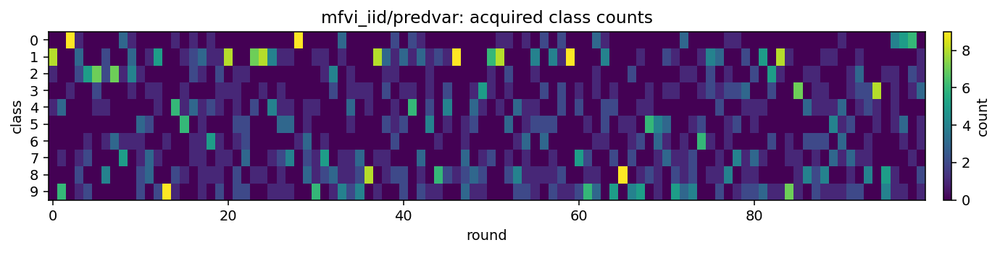

[acq dbg] r=000 mfvi_corr std=12 q10=460 q50=477 q90=491 min=435 max=508 p90/p10=1.07 uniq~=2000/2000
r=000 new=[0, 0, 0, 0, 4, 0, 3, 2, 0, 1] cum=[0, 0, 0, 0, 4, 0, 3, 2, 0, 1]
[acq dbg] r=005 mfvi_corr std=84.2 q10=910 q50=1.03e+03 q90=1.12e+03 min=742 max=1.34e+03 p90/p10=1.23 uniq~=2000/2000
[acq dbg] r=010 mfvi_corr std=9.83 q10=40 q50=50.6 q90=66.5 min=32.8 max=84 p90/p10=1.66 uniq~=2000/2000
r=010 new=[0, 3, 0, 1, 0, 0, 3, 2, 0, 1] cum=[8, 20, 9, 5, 8, 6, 9, 22, 11, 12]
[acq dbg] r=015 mfvi_corr std=0.00723 q10=0.0562 q50=0.064 q90=0.0738 min=0.0439 max=0.105 p90/p10=1.31 uniq~=2000/2000
[acq dbg] r=020 mfvi_corr std=0.00804 q10=0.0459 q50=0.0567 q90=0.0666 min=0.0326 max=0.0829 p90/p10=1.45 uniq~=2000/2000
r=020 new=[3, 0, 0, 0, 1, 0, 4, 1, 1, 0] cum=[13, 52, 12, 8, 17, 17, 22, 30, 23, 16]
[acq dbg] r=025 mfvi_corr std=0.0039 q10=0.0378 q50=0.0425 q90=0.0478 min=0.0322 max=0.0598 p90/p10=1.26 uniq~=2000/2000
[acq dbg] r=030 mfvi_corr std=0.00587 q10=0.0241 q50=0.0306 q90=0.0393

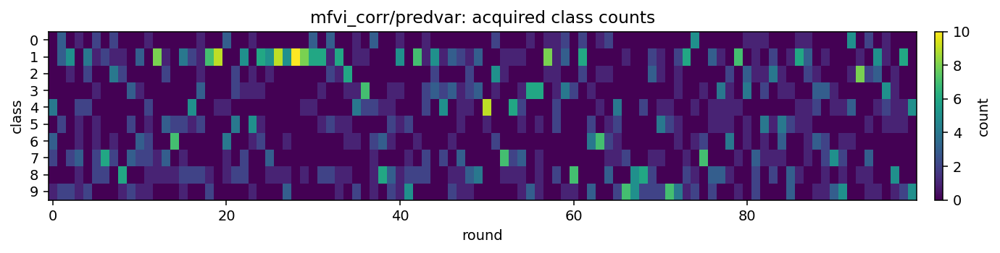

[acq dbg] r=000 mfvi_corr std=17.1 q10=452 q50=480 q90=496 min=408 max=512 p90/p10=1.1 uniq~=2000/2000
r=000 new=[0, 2, 0, 0, 0, 1, 0, 4, 1, 2] cum=[0, 2, 0, 0, 0, 1, 0, 4, 1, 2]
[acq dbg] r=005 mfvi_corr std=58.1 q10=557 q50=634 q90=706 min=505 max=838 p90/p10=1.27 uniq~=2000/2000
[acq dbg] r=010 mfvi_corr std=1.5 q10=15.7 q50=17.8 q90=19.6 min=13.1 max=23.3 p90/p10=1.25 uniq~=2000/2000
r=010 new=[1, 0, 3, 1, 2, 0, 2, 0, 1, 0] cum=[11, 22, 13, 13, 8, 10, 8, 11, 10, 4]
[acq dbg] r=015 mfvi_corr std=0.00601 q10=0.0469 q50=0.0532 q90=0.0625 min=0.0392 max=0.08 p90/p10=1.33 uniq~=2000/2000
[acq dbg] r=020 mfvi_corr std=0.00907 q10=0.0459 q50=0.0601 q90=0.0699 min=0.034 max=0.0917 p90/p10=1.52 uniq~=2000/2000
r=020 new=[0, 2, 0, 0, 0, 4, 0, 1, 2, 1] cum=[13, 42, 24, 17, 18, 20, 16, 30, 17, 13]
[acq dbg] r=025 mfvi_corr std=0.00791 q10=0.039 q50=0.046 q90=0.0584 min=0.0305 max=0.0828 p90/p10=1.5 uniq~=2000/2000
[acq dbg] r=030 mfvi_corr std=0.00493 q10=0.0308 q50=0.0367 q90=0.0434 min=0.024

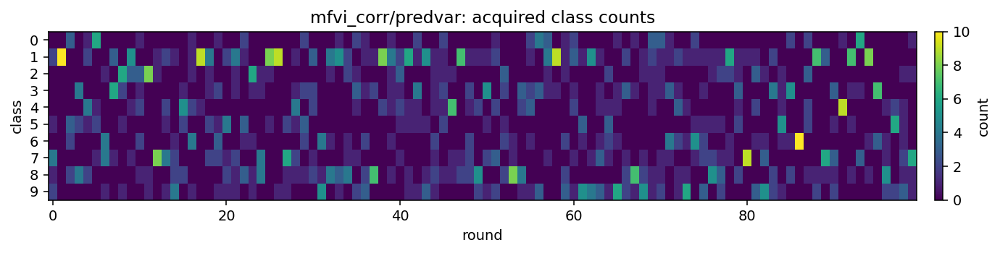

[acq dbg] r=000 mfvi_corr std=16.6 q10=450 q50=472 q90=495 min=425 max=510 p90/p10=1.1 uniq~=2000/2000
r=000 new=[0, 10, 0, 0, 0, 0, 0, 0, 0, 0] cum=[0, 10, 0, 0, 0, 0, 0, 0, 0, 0]
[acq dbg] r=005 mfvi_corr std=55.7 q10=634 q50=706 q90=780 min=548 max=855 p90/p10=1.23 uniq~=2000/2000
[acq dbg] r=010 mfvi_corr std=4.26 q10=27.5 q50=33.2 q90=38.3 min=21.6 max=49.1 p90/p10=1.39 uniq~=2000/2000
r=010 new=[0, 0, 2, 0, 1, 1, 1, 0, 3, 2] cum=[16, 17, 12, 5, 11, 4, 9, 11, 12, 13]
[acq dbg] r=015 mfvi_corr std=0.00757 q10=0.0475 q50=0.0565 q90=0.0667 min=0.0366 max=0.0833 p90/p10=1.41 uniq~=2000/2000
[acq dbg] r=020 mfvi_corr std=0.00706 q10=0.0495 q50=0.0572 q90=0.0671 min=0.042 max=0.0903 p90/p10=1.36 uniq~=2000/2000
r=020 new=[0, 1, 0, 3, 1, 1, 4, 0, 0, 0] cum=[23, 30, 13, 12, 24, 15, 23, 32, 17, 21]
[acq dbg] r=025 mfvi_corr std=0.00971 q10=0.032 q50=0.0426 q90=0.057 min=0.0183 max=0.0739 p90/p10=1.78 uniq~=2000/2000
[acq dbg] r=030 mfvi_corr std=0.00276 q10=0.0227 q50=0.0259 q90=0.0298 min

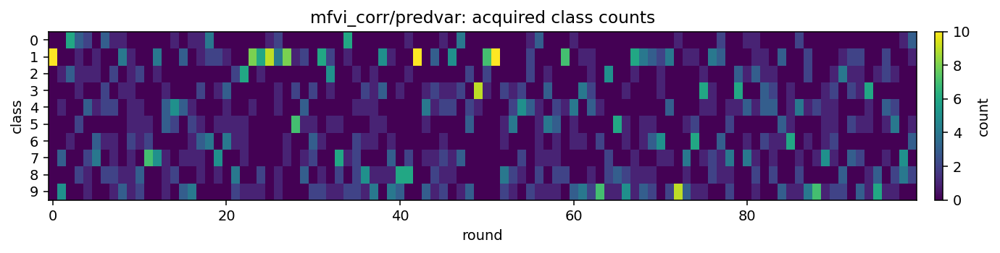

mean                      std                
metric                        acc      nll    rmse     acc     nll    rmse
method    acq                                                             
blr_corr  coreset          0.9746 -11.2315  0.0887  0.0008  0.2256  0.0020
          predvar          0.9753 -12.2650  0.0777  0.0014  0.1338  0.0008
          predvar_diverse  0.9751 -12.4192  0.0773  0.0022  0.3769  0.0031
          predvar_divide   0.9750 -11.6916  0.0836  0.0008  0.1278  0.0007
          predvar_seq      0.9770 -11.7129  0.0831  0.0011  0.2386  0.0035
          random           0.9642 -12.4779  0.0844  0.0020  0.3054  0.0029
blr_iid   coreset          0.9751 -10.2074  0.0856  0.0015  0.2168  0.0028
          predvar          0.9750 -10.8408  0.0780  0.0016  0.1710  0.0023
          predvar_diverse  0.9762 -10.8837  0.0774  0.0020  0.2497  0.0036
          predvar_divide   0.9730 -10.1557  0.0864  0.0011  0.2835  0.0034
          predvar_seq      0.9750 -10.2681  0.0849  0.0017  0.1375  0.0018
          random           0.9646 -10.6667  0.0841  0.0025  0.1978  0.0028
cnn_full  random           0.9642  -7.1764  0.1154  0.0030  0.4314  0.0038
mfvi_corr coreset          0.9741 -11.1058  0.0865  0.0016  0.1796  0.0015
          predvar          0.9662 -11.7499  0.0824  0.0021  0.3175  0.0017
          predvar_diverse  0.9670 -12.1629  0.0797  0.0020  0.2823  0.0028
          predvar_divide   0.9766 -11.6117  0.0799  0.0012  0.2434  0.0012
          predvar_seq      0.9771 -11.8705  0.0773  0.0019  0.1164  0.0024
          random           0.9647 -11.0891  0.0842  0.0027  0.1408  0.0029
mfvi_iid  coreset          0.9751  -9.8735  0.0875  0.0011  0.1271  0.0017
          predvar          0.9671 -10.3806  0.0806  0.0020  0.1882  0.0027
          predvar_diverse  0.9695 -10.3764  0.0805  0.0033  0.3075  0.0044
          predvar_divide   0.9751 -10.2221  0.0827  0.0011  0.2101  0.0028
          predvar_seq      0.9746 -10.2861  0.0819  0.0019  0.2336  0.0032
          random           0.9642 -10.1119  0.0843  0.0020  0.2002  0.0027
ridge     coreset          0.9754 -10.0408  0.0871  0.0018  0.2830  0.0032
          random           0.9645 -10.2831  0.0843  0.0021  0.2475  0.0029

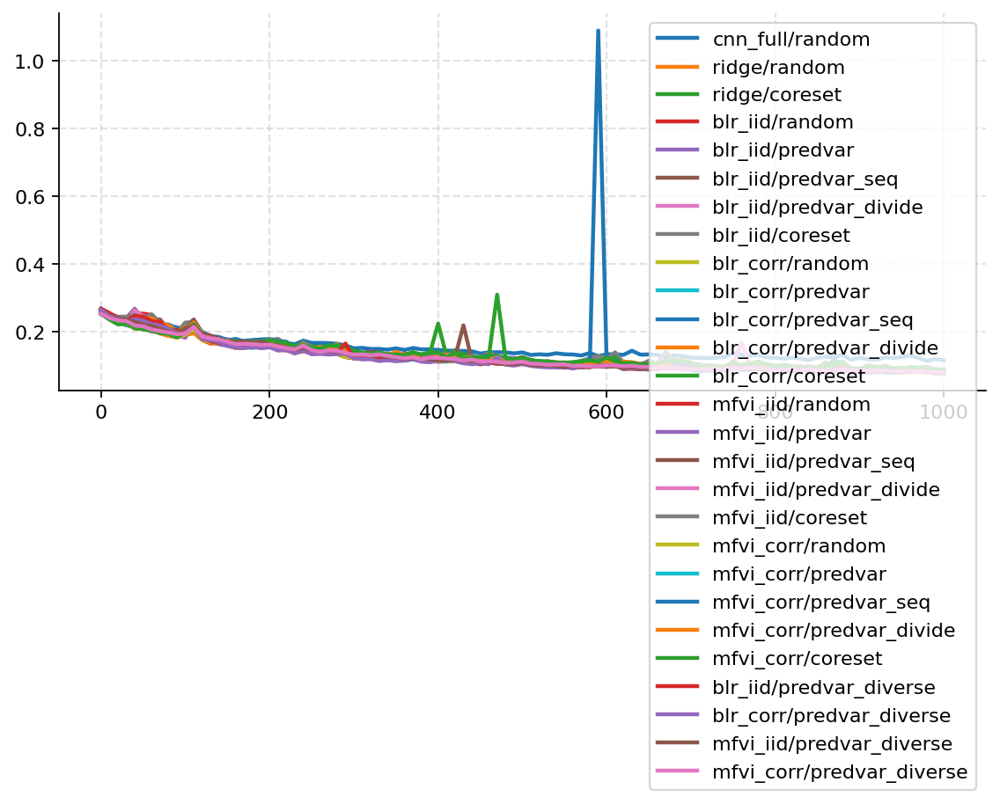

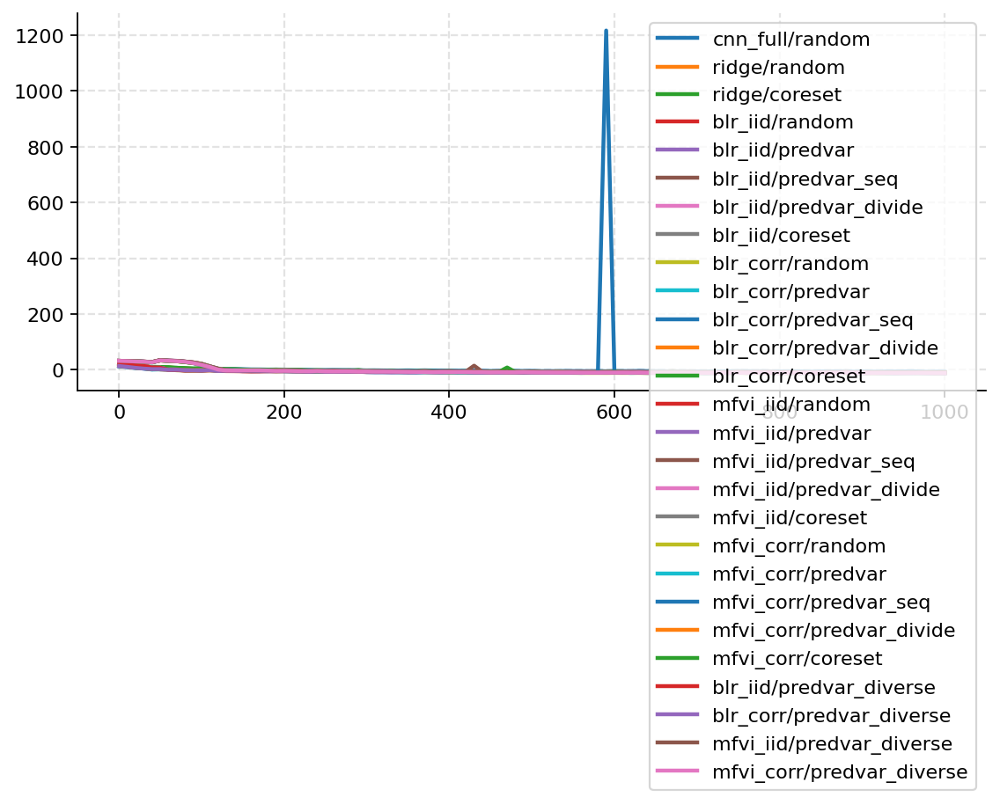

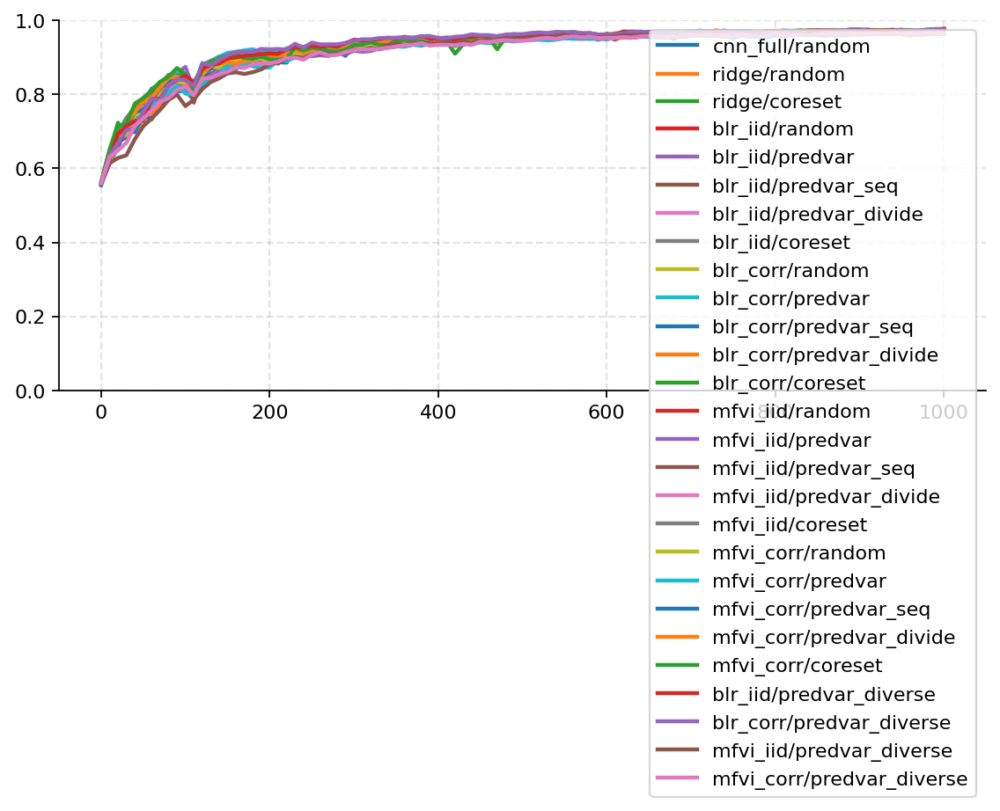

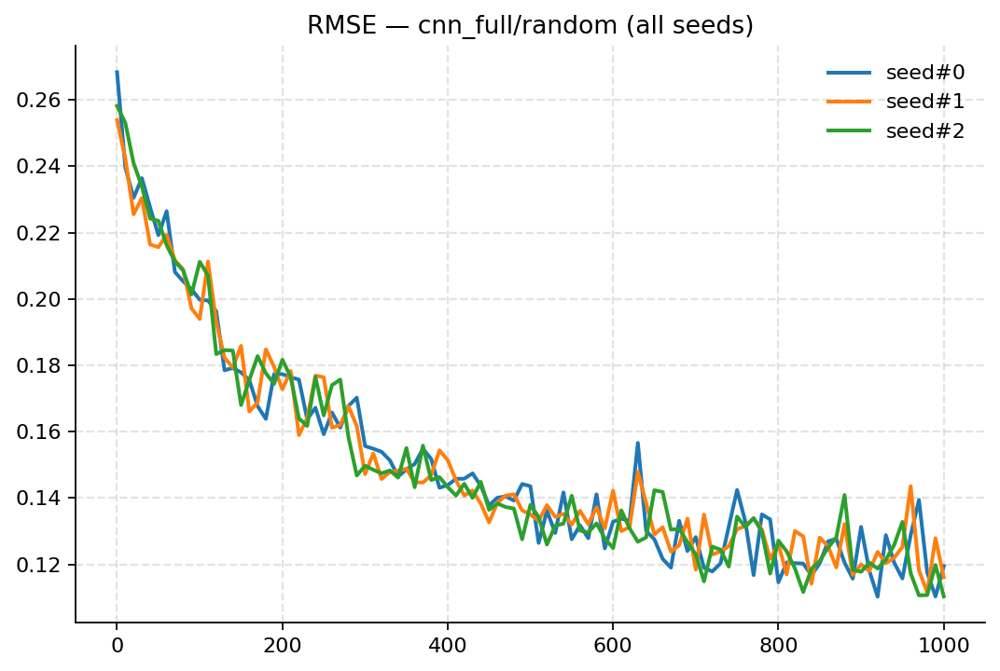

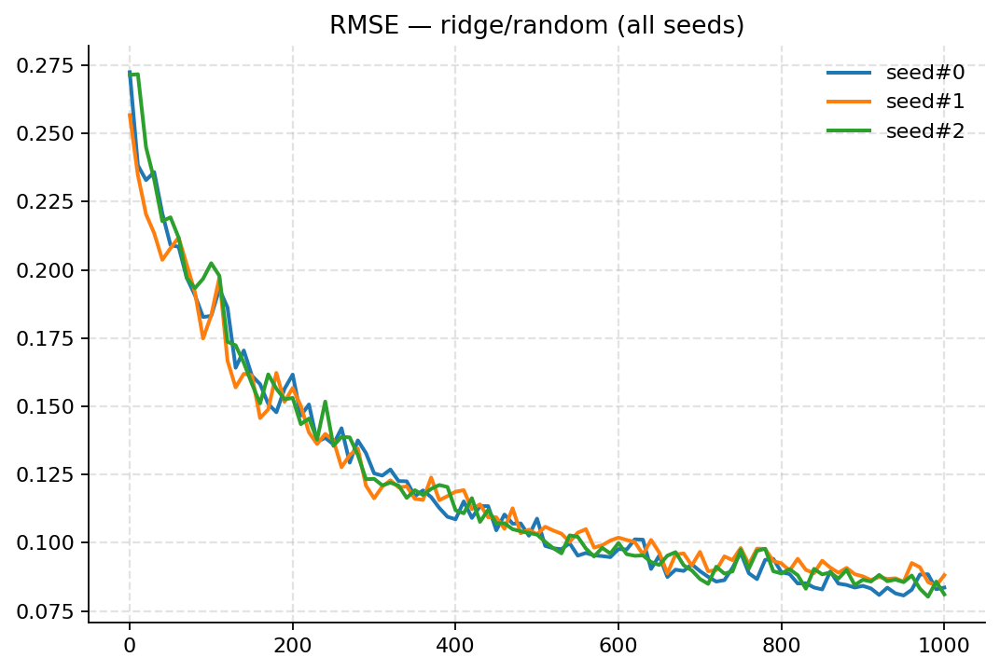

...

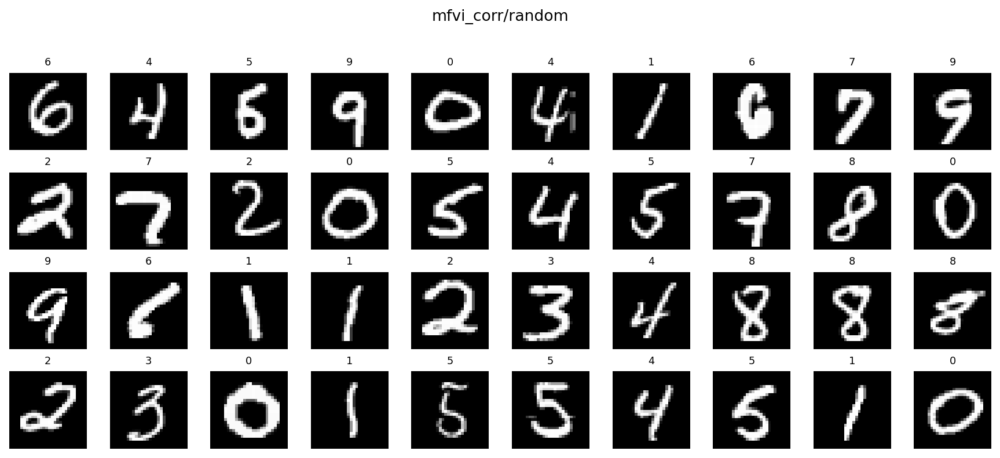

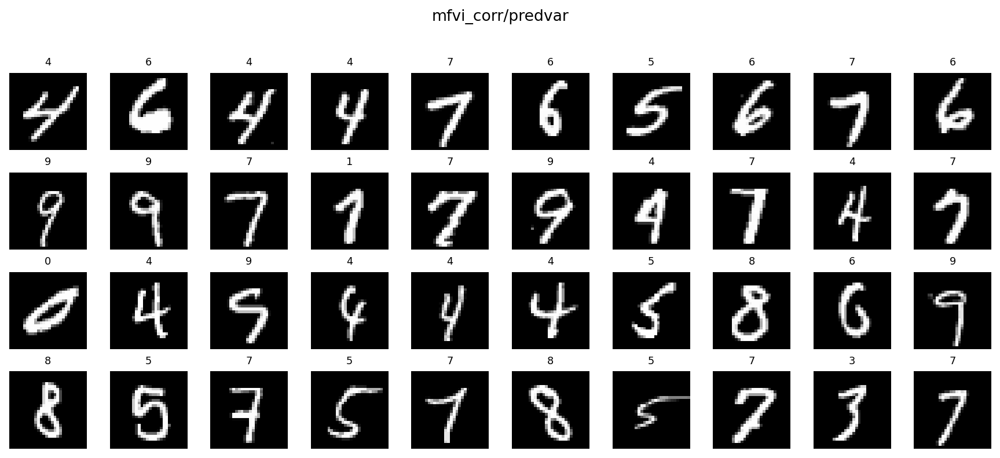

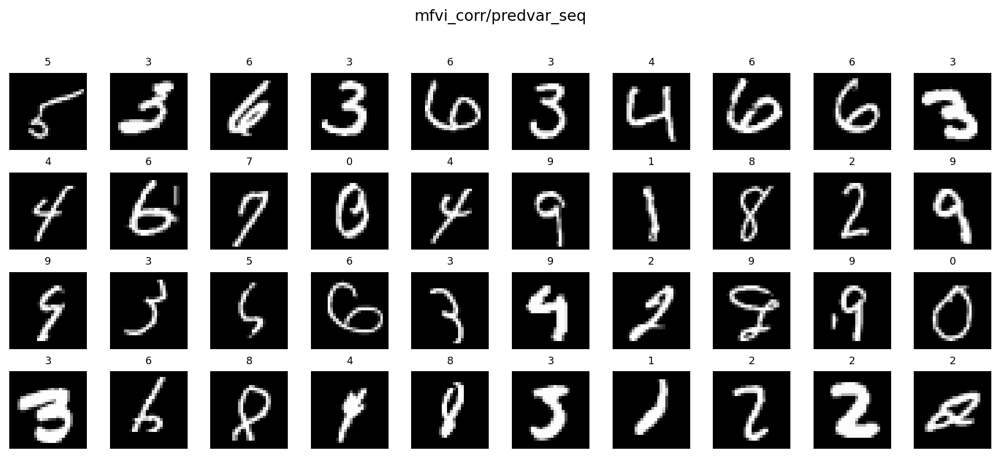

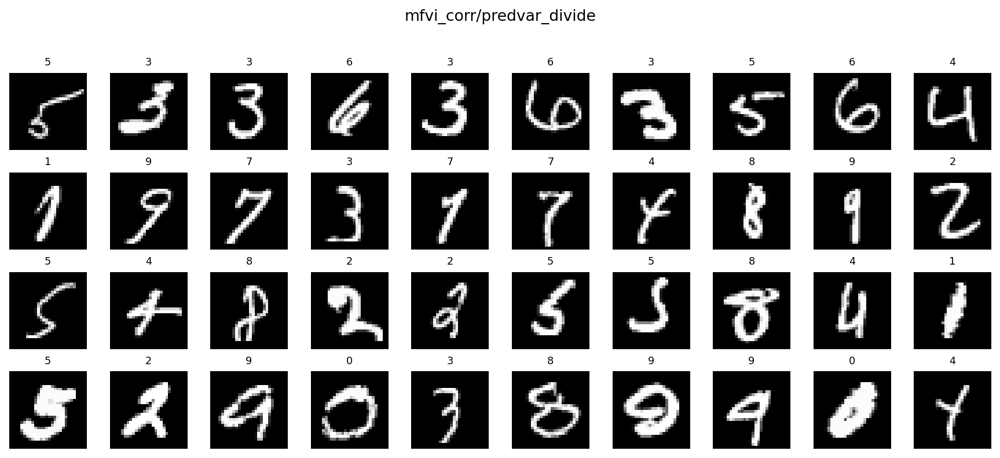

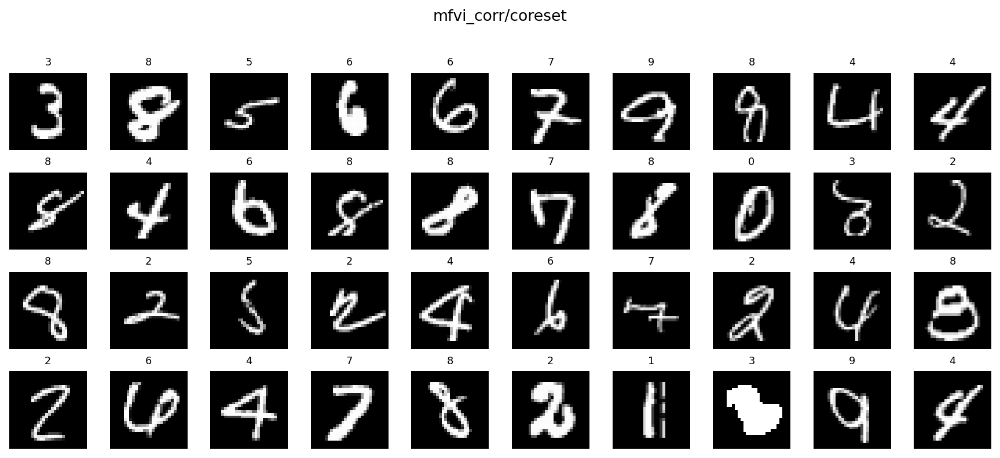

In [12]:
CFG["predvar_diverse"] = False
x, out, acq_logs = run_suite(runs, log=False)

CFG["predvar_diverse"] = True
runs_div = [(m,a) for (m,a) in runs if a == "predvar"]
x2, out2, _ = run_suite(runs_div, log=False)

out_merged = dict(out)
for (m, a), d in out2.items():  # a == "predvar"
    out_merged[(m, "predvar_diverse")] = d

display(final_table(out_merged).round(4))

plot_metric(x, out_merged, "rmse")
plot_metric(x, out_merged, "nll")
plot_metric(x, out_merged, "acc", ylim=(0.0, 1.0))
plot_rmse_runs(x, out_merged, per_seed_fig=False)

RARE_ROUNDS = (0, 10, 50, 99)
for (m, a), log_ in acq_logs.items():
    show_acquired(log_, rounds=RARE_ROUNDS, title=f"{m}/{a}")


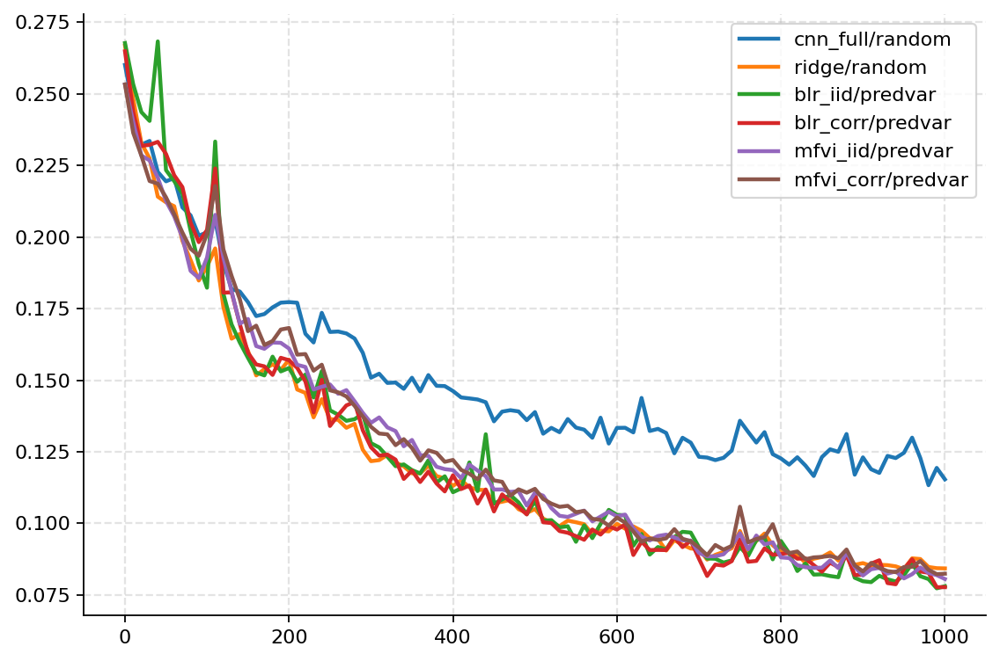

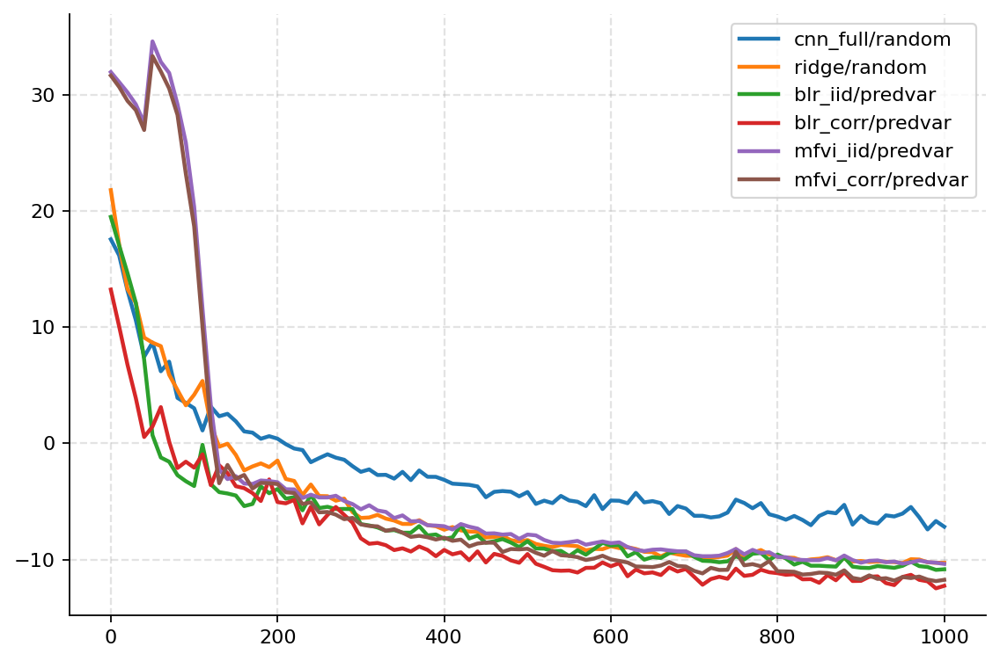

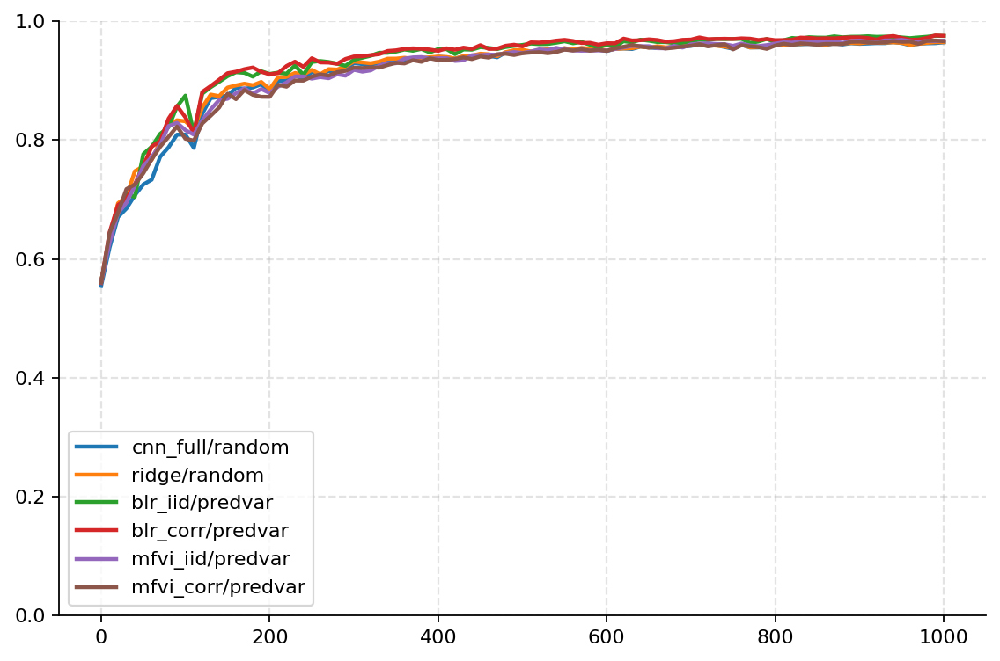

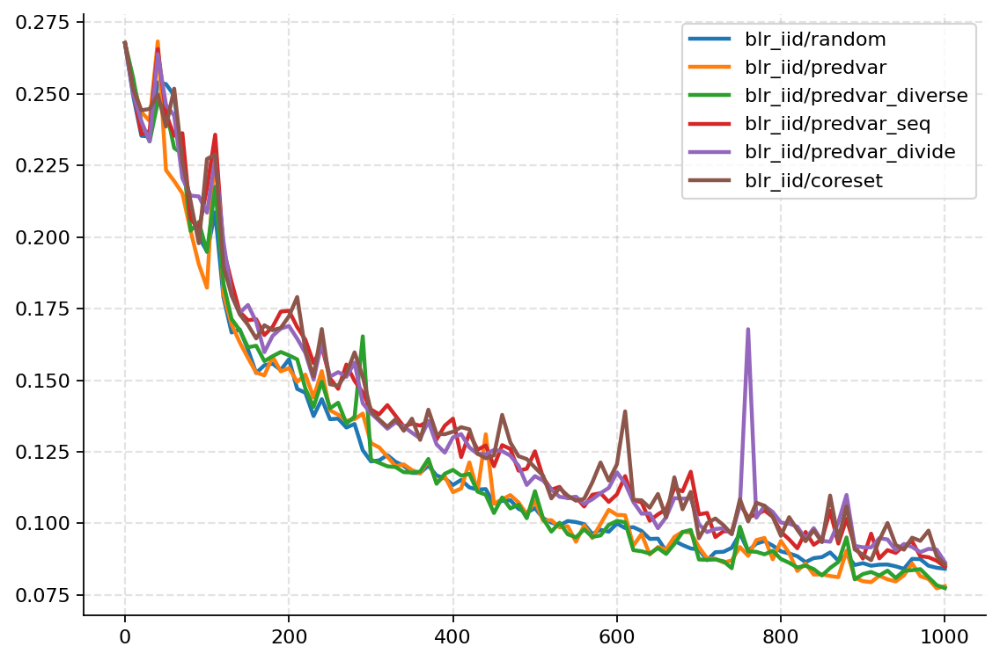

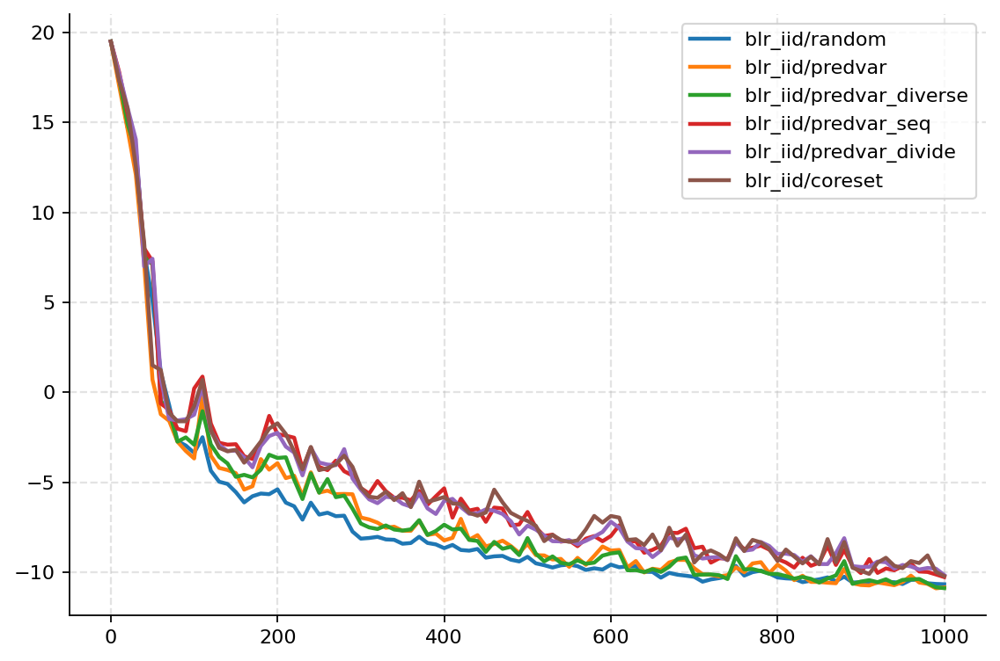

...

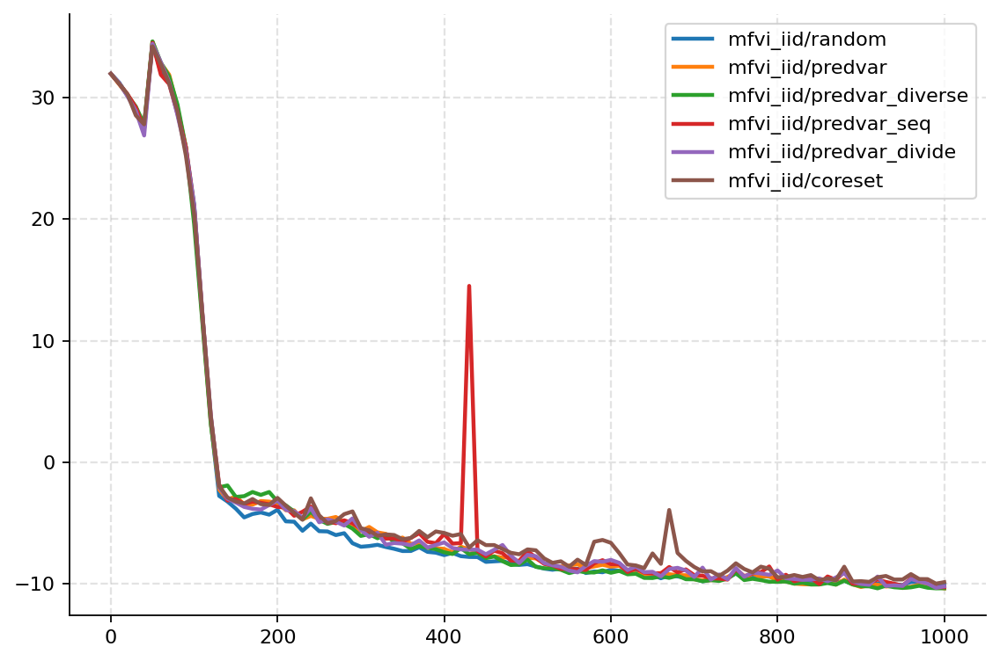

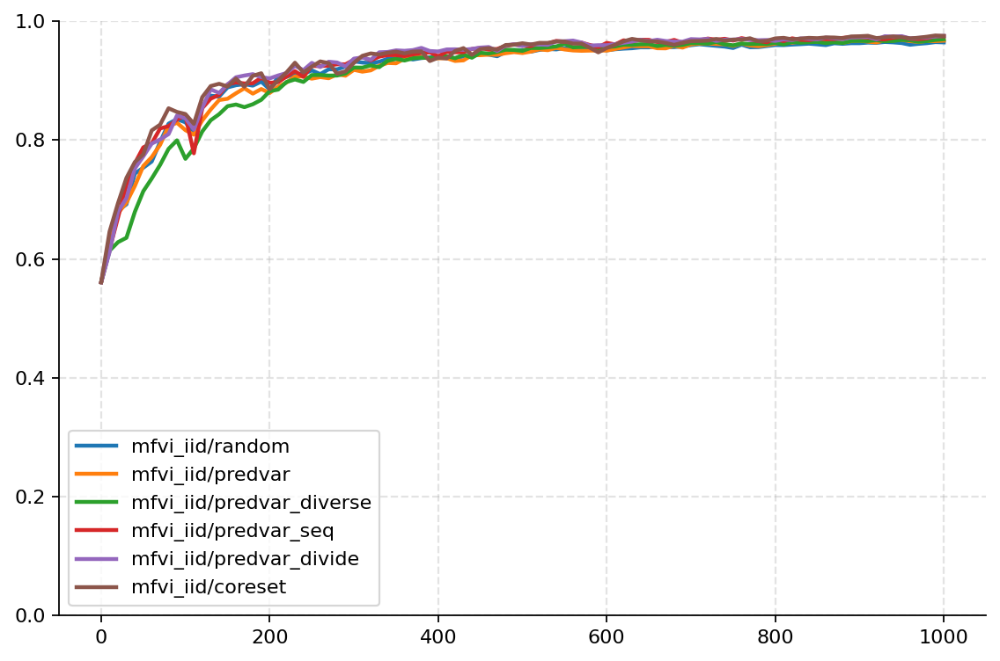

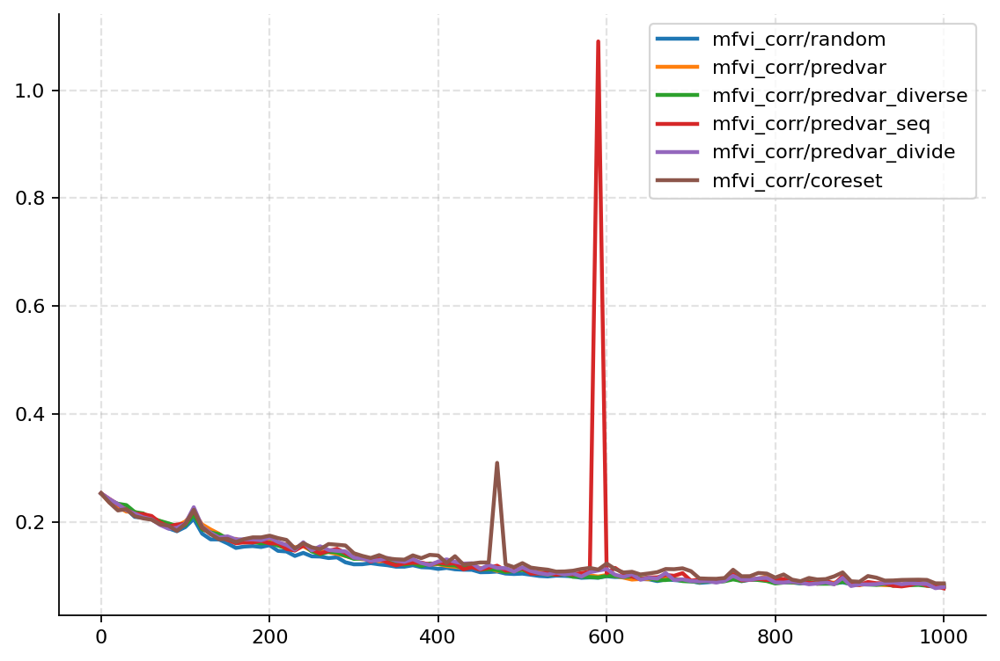

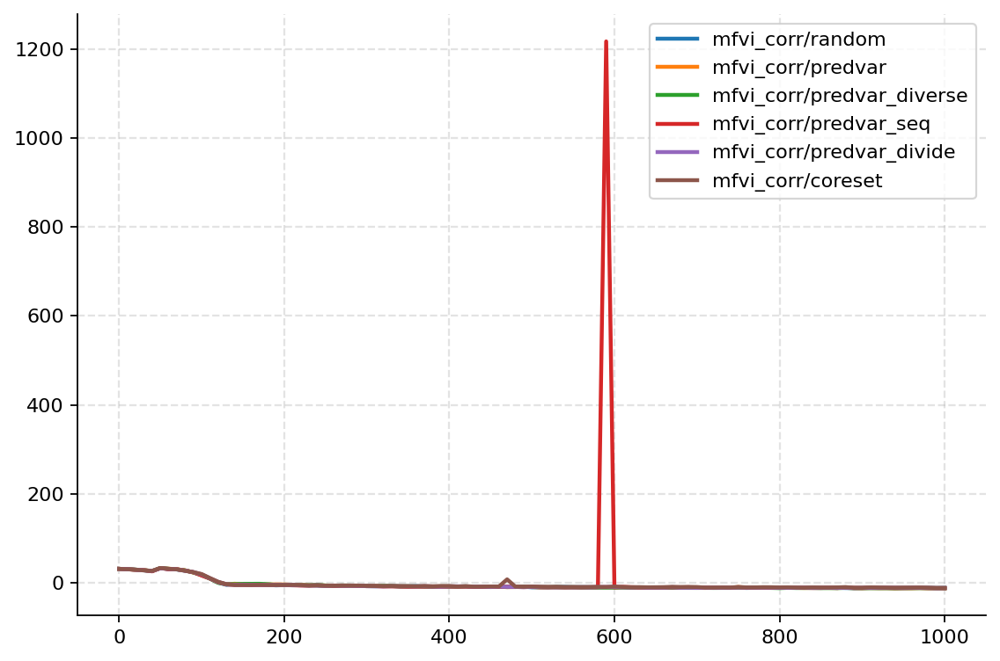

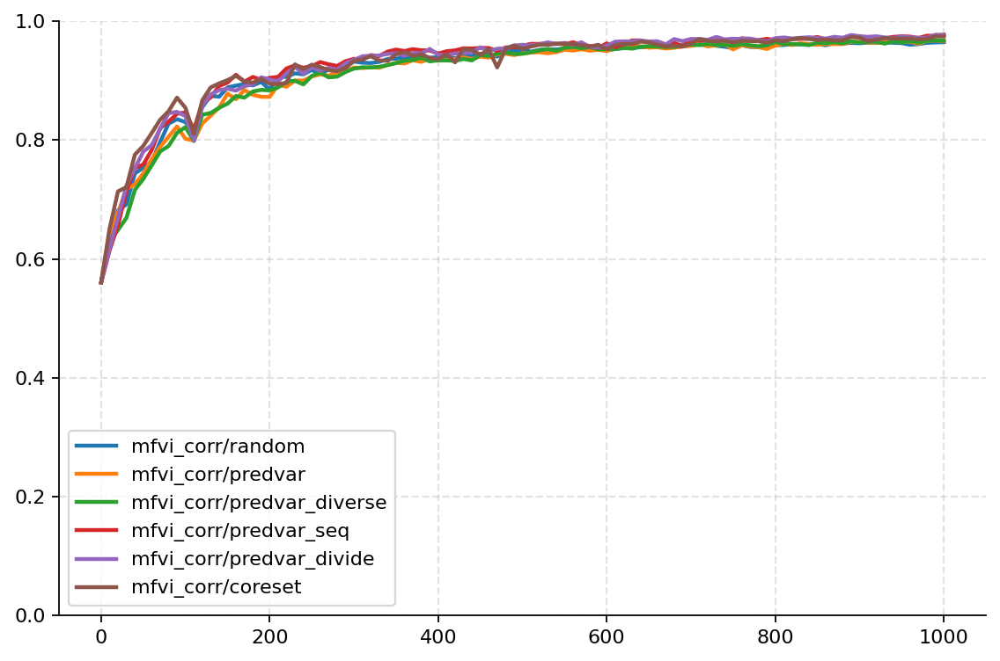

In [13]:
METHODS_LL = ["blr_iid","blr_corr","mfvi_iid","mfvi_corr"]
BASELINES = [("cnn_full","random"), ("ridge","random")]

def _subset_out(out, keys):
    return {k: out[k] for k in keys if k in out}

keys_predvar_only = []
keys_predvar_only += [k for k in BASELINES if k in out_merged]
keys_predvar_only += [(m, "predvar") for m in METHODS_LL if (m,"predvar") in out_merged]

if keys_predvar_only:
    plot_metric(x, _subset_out(out_merged, keys_predvar_only), "rmse")
    plot_metric(x, _subset_out(out_merged, keys_predvar_only), "nll")
    plot_metric(x, _subset_out(out_merged, keys_predvar_only), "acc", ylim=(0.0, 1.0))

# per method comparison
for m in METHODS_LL:
    keys_m = [(m,a) for a in ["random","predvar","predvar_diverse","predvar_seq","predvar_divide", "coreset"] if (m,a) in out_merged]
    if keys_m:
        plot_metric(x, _subset_out(out_merged, keys_m), "rmse")
        plot_metric(x, _subset_out(out_merged, keys_m), "nll")
        plot_metric(x, _subset_out(out_merged, keys_m), "acc", ylim=(0.0, 1.0))